# biocharStability - Correlation models

In [270]:
import biocharStability as bs
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes, inset_axes
import matplotlib.cm as cm
from inspect import getfullargspec
from ast import literal_eval
import re
import ipywidgets as widgets
from scipy.optimize import curve_fit
import itertools
import seaborn as sns
from adjustText import adjust_text
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)
import string
from sklearn.metrics import mean_squared_error, r2_score, roc_curve, explained_variance_score, mean_absolute_error
import dcor as dc
import pickle


In [271]:
fp = '../biocharStability/database/biochar_incubation_database_2022-03-22_live.xlsx'
metadata, schema, metadata_column_sets = bs.load_metadata(filepath=fp)
data = bs.load_data(filepath=fp)
articles = bs.load_articles(filepath=fp)
validation = bs.load_validation(filepath=fp)

Metadata loaded, with 187 rows
Data loaded, with 2941 rows
Articles loaded, with 76 rows
Validation loaded, with 151 rows


Warning: manus_03_ notebook is based on last-run best fit selection in notebook manus_01

Cell below is the one that must be run, with the right date selector..
```
day_run = '2023-06-27' # based on database file prior to Aubertin & Herath updates
day_run = '2023-09-05' # with new digitzed Aubertin2021 data and new Herath2015 data
day_run = '2023-09-09' # with new raw Aubertin2021 data and new Herath2015 data

fitdata = bs.load_fitted_observations('../simulations/manuscript/curve-fitting_alllibs_allfits_v'+day_run+'.xlsx')
fitdata[('strategy','p0', 'tuple')].fillna(value='None', inplace=True) # to be able to filter on fits without p0, for S1
#fitdata = bs.applyQ10(fitdata, metadata, tTs=14.9, verbose=False) # needed or not?
for bfc in S:
    print("Selecting best fit for, criteria: ", bfc['name'])
    no_best, bestfit = bs.select_best_fit(fitdata, bfc['model_pool'], bfc['checks'], bfc['spec_val'], bfc['rank'], 
                                      saveExcel='../simulations/manuscript/bestfits_'+bfc['name']+'.xlsx')
       
    if len(no_best)>0:
        print("No best fit found for observations: ", no_best)
    print("Best fit found for ", len(bestfit), " observations. \n")
```

In [272]:
# load a file of "best fits"

# fits from 2022-10-17 (for memory)
#fitdata =pd.read_excel('../simulations/bestfitdata-p0_2022-10-27.xlsx', index_col=0)

# fits from 2023-06, S1 / S2 / S3 / S4 (few more obs)
day_run = '2023-06-27' # based on database file prior to Aubertin & Herath updates
day_run = '2023-09-05' # with new Aubertin2021 data and new Herath2015 data
day_run = '2023-09-09' # with new raw Aubertin2021 data and new Herath2015 data
#warning: pay attention to the last run bestfit selection in manus_01_ # should be day_run = '2023-09-09'

S1_bestfit = pd.read_excel('../simulations/manuscript/bestfits_'+'S1'+'.xlsx', index_col=0) # double & triple, constrained only
S2_bestfit = pd.read_excel('../simulations/manuscript/bestfits_'+'S2'+'.xlsx', index_col=0) # single to triple, any form
S3_bestfit = pd.read_excel('../simulations/manuscript/bestfits_'+'S3'+'.xlsx', index_col=0) # power model only
S4_bestfit = pd.read_excel('../simulations/manuscript/bestfits_'+'S4'+'.xlsx', index_col=0) # power + any exponential, BIC

# align metadata with only relevant rows, in same order
from biocharStability.analyse import _align_dataframes
S1_bestfit, metadata_S1, _ = _align_dataframes(S1_bestfit, metadata, None) 
S2_bestfit, metadata_S2, _ = _align_dataframes(S2_bestfit, metadata, None) 
S3_bestfit, metadata_S3, _ = _align_dataframes(S3_bestfit, metadata, None) 
S4_bestfit, metadata_S4, _ = _align_dataframes(S4_bestfit, metadata, None) 

S1_bestfit.reset_index(inplace=True)
S2_bestfit.reset_index(inplace=True)
S3_bestfit.reset_index(inplace=True)
S4_bestfit.reset_index(inplace=True)

# restore the multi-index used in plotting function to indentify parameters (it's removed in best-fit selection function)
day_run = '2023-06-27'

temp = bs.load_fitted_observations('../simulations/manuscript/curve-fitting_alllibs_allfits_v'+day_run+'.xlsx')
multiIndex = temp.columns 
S1_bestfit.columns = multiIndex
S2_bestfit.columns = multiIndex
S3_bestfit.columns = multiIndex
S4_bestfit.columns = multiIndex

For the manuscript, we work with fitting strategies S2 (all exponentials) and S3 (power models), and at a set incubation temperature of 20C, and the temperature adjustment methods (all three to test difference at first).

## Applying temperature adjustment

Below, we apply the temperature adjustment to the best fits. It implies that for each dataframe, we add columns with:
- calculated fT for given conversion method
- calculated BC100 adjusted 
- anything else?

In [273]:
targetTemperature = 20

S2_bestfit_Q10, _, _ = bs.applyTempCorr(S2_bestfit, metadata, tTs=targetTemperature, TH=100, method=bs.fT_Woolf)
S2_bestfit_sQ10, _, _ = bs.applyTempCorr(S2_bestfit, metadata, tTs=targetTemperature, TH=100, method=bs.fT_WoolfStepwise)
S2_bestfit_kExp, _, _ = bs.applyTempCorr(S2_bestfit, metadata, tTs=targetTemperature, TH=100, method=bs.fT_DataFit)

S3_bestfit_Q10, _, _ = bs.applyTempCorr(S3_bestfit, metadata, tTs=targetTemperature, TH=100, method=bs.fT_Woolf)
S3_bestfit_sQ10, _, _ = bs.applyTempCorr(S3_bestfit, metadata, tTs=targetTemperature, TH=100, method=bs.fT_WoolfStepwise)
S3_bestfit_kExp, _, _ = bs.applyTempCorr(S3_bestfit, metadata, tTs=targetTemperature, TH=100, method=bs.fT_DataFit)

Then, we can also calculate all kind of stability features, e.g. t12, MRT, but also BC and k at any year.

In [274]:
from scipy.optimize import fsolve
from biocharStability.analyse import _align_dataframes, _calculateY, apply_Q10_bis, singleExp, singleExp_u, doubleExp, doubleExp_u, tripleExp, tripleExp_u, powerModel, rebuild_cov2, powerModel_q10

def std_fmodel(xdata, p_opt, p_cov, fmodel=doubleExp_u):
    '''
    Returns caculated propagated error for the given model, over the entire time range given (xdata)
    '''
    mapping = {
        singleExp:bs.std_singleExp,
        singleExp_u:bs.std_singleExp_u,
        doubleExp:bs.std_doubleExp,
        doubleExp_u:bs.std_doubleExp_u,
        tripleExp:bs.std_tripleExp,
        tripleExp_u:bs.std_tripleExp_u,
        powerModel:bs.std_powerModel,
        } # add other functions here, when calculated (by hand)
    std_func = mapping[fmodel]  
    return np.array([std_func(x, p_opt, p_cov) for x in xdata])

def _calculate_stability_features(fitdata, metadata, THs=[1, 2, 3, 5, 10, 20, 50, 75, 100, 150, 200]):
    '''
    Caculates a set of features relating to stability estimates, whether amounts of carbon remaining at given time, half-lives, mean resisdence times, or average decay rates, dervied from curve fitting
    Returns a copy of the metadata with additional columns for the new entries.
    
    Notes:
        - prefix `r`refers to raw, before temperature adjustment
        - prefix `a`refers to adjusted, after temperature adjustment
        
        - MRT / t12 calculation after temperature adjustment?
    '''
    # some constants 
    map_model_function = {"singleExp":singleExp,"singleExp_u":singleExp_u,"doubleExp":doubleExp,"doubleExp_u":doubleExp_u,"tripleExp":tripleExp,"tripleExp_u":tripleExp_u,"powerModel":powerModel,}            
    #THs = [1, 2, 3, 5, 10, 20, 50, 75, 100, 150, 200]
    #THs = [1, 2, 5, 10, 20, 30, 40, 50, 75, 100, 200, 500]
    stability_features = {}
    #THs = [1, 2, 5, 10, 20, 30, 40, 50, 75, 100, 200, 500]
    for ts in THs:
        stability_features['rBC_'+str(ts)] = []
        stability_features['aBC_'+str(ts)] = []
        stability_features['rK_y'+str(ts)] = []
        stability_features['aK_y'+str(ts)] = []
    stability_features['rT12'] = []
    stability_features['rMRT'] = []
    stability_features['aT12'] = []
    stability_features['aMRT'] = []
    stability_features['rK02_K100'] = []
    stability_features['aK02_K100'] = []
    
    # strip-off multi-level index..
    fitdata = fitdata.droplevel(level=[0,2], axis=1)
    
    for obs, row in fitdata.iterrows():
        # retrive already calculated fT
        fT = row['fT'] #row[('q10correction', 'fT', '1')]
        
        # retrive metadata and fitdata
        FIT_func = row['model']
        params = row[['k', 'c', 'k1', 'k2', 'c1', 'c2', 'k3', 'c0', 'b', 'm', 'c3']]
        
        # std is in absolute value (other named .1 => relative value, in %)
        params_std = row[['std_k', 'std_c','std_k1', 'std_k2', 'std_c1', 'std_c2', 'std_k3', 'std_c3', 'std_c0', 'std_b', 'std_m']]
        params_corr = ['corr(k, c)', 'corr(k1, k2)', 'corr(k1, c1)', 'corr(k2, c1)', 'corr(k1, c2)', 'corr(k2, c2)', 'corr(c1, c2)', 'corr(k1, k3)',
                        'corr(k2, k3)', 'corr(k3, c1)', 'corr(k3, c2)', 'corr(k1, c3)', 'corr(k2, c3)', 'corr(k3, c3)', 'corr(c1, c3)', 'corr(c2, c3)','corr(c0, b)', 'corr(c0, m)', 'corr(b, m)']
        params_cov = row[['cov(k, c)', 'cov(k1, k2)', 'cov(k1, c1)', 'cov(k2, c1)', 'cov(k1, c2)', 'cov(k2, c2)',
                       'cov(c1, c2)', 'cov(k1, k3)', 'cov(k2, k3)', 'cov(k3, c1)','cov(k3, c2)', 'cov(k1, c3)', 'cov(k2, c3)', 'cov(k3, c3)','cov(c1, c3)', 'cov(c2, c3)', 'cov(c0, b)', 'cov(c0, m)', 'cov(b, m)']]
        p_opt_names, p_opt, p_cov = rebuild_cov2(map_model_function[FIT_func], params, params_std, params_cov) 
    
        # calculate MRT and T12, WITHOUT temperature adjustment
        def f12(t):
            return map_model_function[FIT_func](t, *p_opt) - 50.
        t12 = fsolve(f12, x0=50*365) # half-life time, 50% C remaining
        t12 = t12[0]/365

        def fMRT(t):
            return map_model_function[FIT_func](t, *p_opt) - np.exp(-1)
        MRT_app = fsolve(fMRT, x0=50*365) # apparent MRT, np.exp(-1) = 36.8% C remaining
        MRT_app = MRT_app[0]/365

        # calculate MRT and T12, WITH temperature adjustment (TO DO)
        def f12(t):
            if FIT_func == 'singleExp':
                newBC100 = singleExp(t, fT*params['k'])
            elif FIT_func == 'singleExp_u':
                newBC100 = singleExp_u(t, fT*params['k'], params['c'])
            elif FIT_func == 'doubleExp':
                newBC100 = doubleExp(t, fT*params['k1'], fT*params['k2'], params['c1'])
            elif FIT_func == 'doubleExp_u':
                newBC100 = doubleExp_u(t, fT*params['k1'], fT*params['k2'], params['c1'], params['c2'])
            elif FIT_func == 'tripleExp':
                newBC100 = tripleExp(t, fT*params['k1'], fT*params['k2'], fT*params['k3'], params['c1'], params['c2'])
            elif FIT_func == 'tripleExp_u':
                newBC100 = tripleExp_u(t, fT*params['k1'], fT*params['k2'], fT*params['k3'], params['c1'], params['c2'], params['c3'])
            elif FIT_func == 'powerModel':
                newBC100 = powerModel_q10(t, fT, params['c0'], params['b'], params['m'])
            else:
                # not supported
                print("Warning: encoutered model function not supported by Q10 recalibration for obs: ", FIT_func)
                newBC100 = np.nan     
            return newBC100 - 50.
        aT12 = fsolve(f12, x0=50*365) # half-life time, 50% C remaining, x0=initial guess
        aT12 = aT12[0]/365

        def fMRT(t):
            if FIT_func == 'singleExp':
                newBC100 = singleExp(t, fT*params['k'])
            elif FIT_func == 'singleExp_u':
                newBC100 = singleExp_u(t, fT*params['k'], params['c'])
            elif FIT_func == 'doubleExp':
                newBC100 = doubleExp(t, fT*params['k1'], fT*params['k2'], params['c1'])
            elif FIT_func == 'doubleExp_u':
                newBC100 = doubleExp_u(t, fT*params['k1'], fT*params['k2'], params['c1'], params['c2'])
            elif FIT_func == 'tripleExp':
                newBC100 = tripleExp(t, fT*params['k1'], fT*params['k2'], fT*params['k3'], params['c1'], params['c2'])
            elif FIT_func == 'tripleExp_u':
                newBC100 = tripleExp_u(t, fT*params['k1'], fT*params['k2'], fT*params['k3'], params['c1'], params['c2'], params['c3'])
            elif FIT_func == 'powerModel':
                newBC100 = powerModel_q10(t, fT, params['c0'], params['b'], params['m'])
            else:
                # not supported
                print("Warning: encoutered model function not supported by Q10 recalibration for obs: ", FIT_func)
                newBC100 = np.nan     
            return newBC100 - np.exp(-1)
        aMRT_app = fsolve(fMRT, x0=50*365) # apparent MRT, np.exp(-1) = 36.8% C remaining
        aMRT_app = aMRT_app[0]/365
        
        # apply correction to decay constants, for given TH
        def _calculateBC(ft, Th, params, p_cov, FIT_func):
            if FIT_func == 'singleExp':
                newBC100 = singleExp(Th*365, ft*params['k'])
                sigmaBC100 = std_fmodel([Th*365*ft], [params['k']], p_cov, singleExp)
            elif FIT_func == 'singleExp_u':
                newBC100 = singleExp_u(Th*365, ft*params['k'], params['c'])
                sigmaBC100 = std_fmodel([Th*365*ft], [params['k'], params['c']] , p_cov, singleExp_u)
            elif FIT_func == 'doubleExp':
                newBC100 = doubleExp(Th*365, ft*params['k1'], ft*params['k2'], params['c1'])
                sigmaBC100 = std_fmodel([Th*365*ft], [params['k1'], params['k2'], params['c1']] , p_cov, doubleExp)
            elif FIT_func == 'doubleExp_u':
                newBC100 = doubleExp_u(Th*365, ft*params['k1'], ft*params['k2'], params['c1'], params['c2'])
                sigmaBC100 = std_fmodel([Th*365*ft], [params['k1'], params['k2'], params['c1'], params['c2']] , p_cov, doubleExp_u)
            elif FIT_func == 'tripleExp':
                newBC100 = tripleExp(Th*365, ft*params['k1'], ft*params['k2'], ft*params['k3'], params['c1'], params['c2'])
                sigmaBC100 = std_fmodel([Th*365*ft], [params['k1'], params['k2'], params['k3'], params['c1'], params['c2']] , p_cov, tripleExp)
            elif FIT_func == 'tripleExp_u':
                newBC100 = tripleExp_u(Th*365, ft*params['k1'], ft*params['k2'], ft*params['k3'], params['c1'], params['c2'], params['c3'])
                sigmaBC100 = std_fmodel([Th*365*ft], [params['k1'], params['k2'], params['k3'], params['c1'], params['c2'], params['c3']] , p_cov, tripleExp_u)
            elif FIT_func == 'powerModel':
                newBC100 = powerModel_q10(Th*365, ft, params['c0'], params['b'], params['m'])
                sigmaBC100 = std_fmodel([Th*365*ft], [params['c0'], params['b'], params['m']] , p_cov, powerModel)
            else:
                # not supported
                print("Warning: encoutered model function not supported by Q10 recalibration for obs: ", FIT_func)
                newBC100 = np.nan
                sigmaBC100 = np.nan
                
            return max(0., newBC100), sigmaBC100
        
        # perform calculations, of BC and K
        r_timeseries = []
        a_timeseries = []
        r_K_timeseries = [0] # init with 0 for decay at time 0
        a_K_timeseries = [0] # init with 0 for decay at time 0
        for t in np.arange(0, THs[-1]+1, 1): # steps of 1 year in timeseries
            # temperature-adjusted timeseries
            BC, sBC = _calculateBC(ft=fT, Th=t, params=params, p_cov=p_cov, FIT_func=FIT_func) # Th in years, it is multiplied by 365 in the function
            a_timeseries.append(BC)
            if t > 0:
                a_K_timeseries.append(a_timeseries[t-1]-BC)
            
            # no temperature adjustment
            BC, sBC = _calculateBC(ft=1, Th=t, params=params, p_cov=p_cov, FIT_func=FIT_func) # Th in years, it is multiplied by 365 in the function
            r_timeseries.append(BC)
            if t > 0:
                r_K_timeseries.append(r_timeseries[t-1]-BC)
            
        for i in THs:
            # BC Remaining at given year
            stability_features['aBC_'+str(i)].append(a_timeseries[i]) # in % of initial carbon
            stability_features['rBC_'+str(i)].append(r_timeseries[i]) 
            # Annual average decay rates
            stability_features['aK_y'+str(i)].append(a_K_timeseries[i]) # in %ini per year
            stability_features['rK_y'+str(i)].append(r_K_timeseries[i])
    
        # Ratio between average decay rate in 1st two years divided by decay rate in year 100, as modelled by curve fit
        stability_features['aK02_K100'].append((a_timeseries[0]-a_timeseries[2])/2/a_K_timeseries[100] )
        stability_features['rK02_K100'].append((r_timeseries[0]-r_timeseries[2])/2/r_K_timeseries[100])
            
        # Half-life and MRT, in years
        stability_features['rT12'].append(t12)
        stability_features['rMRT'].append(MRT_app)
        stability_features['aT12'].append(aT12)
        stability_features['aMRT'].append(aMRT_app)
               
    return stability_features, r_timeseries, a_timeseries, a_K_timeseries, r_K_timeseries        

In [141]:
# for S2, and 3 adjustment methods
SF_S2_Q10, _, _, _, _ = _calculate_stability_features(
    S2_bestfit_Q10, metadata_S2, THs=[1, 2, 5, 10, 20, 30, 40, 50, 75, 100, 200, 500]
)
SF_S2_sQ10, _, _, _, _ = _calculate_stability_features(
    S2_bestfit_sQ10, metadata_S2, THs=[1, 2, 5, 10, 20, 30, 40, 50, 75, 100, 200, 500]
)
SF_S2_kExp, _, _, _, _ = _calculate_stability_features(
    S2_bestfit_kExp, metadata_S2, THs=[1, 2, 5, 10, 20, 30, 40, 50, 75, 100, 200, 500]
)

# for S3,  and 3 adjustment methods
SF_S3_Q10, _, _, _, _ = _calculate_stability_features(
    S3_bestfit_Q10, metadata_S3, THs=[1, 2, 5, 10, 20, 30, 40, 50, 75, 100, 200, 500]
)
SF_S3_sQ10, _, _, _, _ = _calculate_stability_features(
    S3_bestfit_sQ10, metadata_S3, THs=[1, 2, 5, 10, 20, 30, 40, 50, 75, 100, 200, 500]
)
SF_S3_kExp, _, _, _, _ = _calculate_stability_features(
    S3_bestfit_kExp, metadata_S3, THs=[1, 2, 5, 10, 20, 30, 40, 50, 75, 100, 200, 500]
)
# overflow errors, from uncertainty calculations, I believe or MRT/Halflife calculations. or uncertainty

c:\github\biocharstability\biocharStability\analyse.py:65: RuntimeWarning: overflow encountered in exp
  return c1*np.exp(-k1*t)+ c2*np.exp(-k2*t) + (100-c1-c2)*np.exp(-k3*t)
c:\github\biocharstability\biocharStability\analyse.py:65: RuntimeWarning: overflow encountered in exp
  return c1*np.exp(-k1*t)+ c2*np.exp(-k2*t) + (100-c1-c2)*np.exp(-k3*t)
c:\github\biocharstability\biocharStability\analyse.py:59: RuntimeWarning: overflow encountered in exp
  return c1*np.exp(-k1*t)+ (100-c1)*np.exp(-k2*t)
c:\github\biocharstability\biocharStability\analyse.py:62: RuntimeWarning: overflow encountered in exp
  return c1*np.exp(-k1*t)+ c2*np.exp(-k2*t)
c:\github\biocharstability\biocharStability\analyse.py:62: RuntimeWarning: overflow encountered in exp
  return c1*np.exp(-k1*t)+ c2*np.exp(-k2*t)
c:\github\biocharstability\biocharStability\analyse.py:65: RuntimeWarning: overflow encountered in exp
  return c1*np.exp(-k1*t)+ c2*np.exp(-k2*t) + (100-c1-c2)*np.exp(-k3*t)
c:\github\biocharstability\b

c:\github\biocharstability\biocharStability\analyse.py:62: RuntimeWarning: overflow encountered in exp
  return c1*np.exp(-k1*t)+ c2*np.exp(-k2*t)
c:\github\biocharstability\biocharStability\analyse.py:65: RuntimeWarning: overflow encountered in exp
  return c1*np.exp(-k1*t)+ c2*np.exp(-k2*t) + (100-c1-c2)*np.exp(-k3*t)
c:\github\biocharstability\biocharStability\analyse.py:65: RuntimeWarning: invalid value encountered in add
  return c1*np.exp(-k1*t)+ c2*np.exp(-k2*t) + (100-c1-c2)*np.exp(-k3*t)
C:\anaconda\envs\bw2\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
c:\github\biocharstability\biocharStability\analyse.py:53: RuntimeWarning: overflow encountered in exp
  return 100*np.exp(-k*t)
c:\github\biocharstability\biocharStability\analyse.py:56: RuntimeWarning: overflow encountered in exp
  return c*np.exp(-k*t)
c:\githu

c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: invalid value encountered in double_scalars
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vec

c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: invalid value encountered in double_scalars
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
C:\Users\Elias S. Azzi\AppData\Local\Temp\ipykernel_14800\2096437270.py:184: RuntimeWarning: divide by zero encountered in double_scalars
  stability_features['aK02_K100'].append((a_timeseries[0]-a_timeseries[2])/2/a_K_timeseries[100] )
C:\Users\Elias S. Azzi\AppData\Local\Temp\ipykernel_14800\2096437270.py:185: RuntimeWarni

c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: invalid value encountered in double_scalars
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vec

C:\Users\Elias S. Azzi\AppData\Local\Temp\ipykernel_14800\2096437270.py:184: RuntimeWarning: divide by zero encountered in double_scalars
  stability_features['aK02_K100'].append((a_timeseries[0]-a_timeseries[2])/2/a_K_timeseries[100] )
C:\Users\Elias S. Azzi\AppData\Local\Temp\ipykernel_14800\2096437270.py:185: RuntimeWarning: divide by zero encountered in double_scalars
  stability_features['rK02_K100'].append((r_timeseries[0]-r_timeseries[2])/2/r_K_timeseries[100])
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: invalid value encountered in double_scalars
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.e

c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: invalid value encountered in double_scalars
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vec

c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: invalid value encountered in double_scalars
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vec

c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: invalid value encountered in double_scalars
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vec

c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: invalid value encountered in double_scalars
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vec

C:\Users\Elias S. Azzi\AppData\Local\Temp\ipykernel_14800\2096437270.py:184: RuntimeWarning: divide by zero encountered in double_scalars
  stability_features['aK02_K100'].append((a_timeseries[0]-a_timeseries[2])/2/a_K_timeseries[100] )
C:\Users\Elias S. Azzi\AppData\Local\Temp\ipykernel_14800\2096437270.py:185: RuntimeWarning: divide by zero encountered in double_scalars
  stability_features['rK02_K100'].append((r_timeseries[0]-r_timeseries[2])/2/r_K_timeseries[100])
c:\github\biocharstability\biocharStability\analyse.py:73: RuntimeWarning: invalid value encountered in power
  z = c0 - c0*np.exp(b)/(m+1)*(t**(m+1))
C:\anaconda\envs\bw2\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
c:\github\biocharstability\biocharStability\analyse.py:84: RuntimeWarning: invalid value encountered in power
  z = c0 - c0*fT*np.exp(b)/(m+1)

c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: invalid value encountered in double_scalars
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vec

c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: invalid value encountered in double_scalars
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vec

c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: invalid value encountered in double_scalars
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vec

C:\Users\Elias S. Azzi\AppData\Local\Temp\ipykernel_14800\2096437270.py:184: RuntimeWarning: divide by zero encountered in double_scalars
  stability_features['aK02_K100'].append((a_timeseries[0]-a_timeseries[2])/2/a_K_timeseries[100] )
C:\Users\Elias S. Azzi\AppData\Local\Temp\ipykernel_14800\2096437270.py:185: RuntimeWarning: divide by zero encountered in double_scalars
  stability_features['rK02_K100'].append((r_timeseries[0]-r_timeseries[2])/2/r_K_timeseries[100])
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: invalid value encountered in double_scalars
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.e

C:\Users\Elias S. Azzi\AppData\Local\Temp\ipykernel_14800\2096437270.py:184: RuntimeWarning: divide by zero encountered in double_scalars
  stability_features['aK02_K100'].append((a_timeseries[0]-a_timeseries[2])/2/a_K_timeseries[100] )
C:\Users\Elias S. Azzi\AppData\Local\Temp\ipykernel_14800\2096437270.py:185: RuntimeWarning: divide by zero encountered in double_scalars
  stability_features['rK02_K100'].append((r_timeseries[0]-r_timeseries[2])/2/r_K_timeseries[100])
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: invalid value encountered in double_scalars
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.e

c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: invalid value encountered in double_scalars
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vec

c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: invalid value encountered in double_scalars
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vec

c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: invalid value encountered in double_scalars
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vec

c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: invalid value encountered in double_scalars
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vec

c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: invalid value encountered in double_scalars
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vec

c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: invalid value encountered in double_scalars
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:73: RuntimeWarning: invalid value encountered in power
  z = c0 - c0*np.exp(b)/(m+1)*(t**(m+1))
C:\anaconda\envs\bw2\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the

c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: invalid value encountered in double_scalars
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vec

C:\Users\Elias S. Azzi\AppData\Local\Temp\ipykernel_14800\2096437270.py:185: RuntimeWarning: divide by zero encountered in double_scalars
  stability_features['rK02_K100'].append((r_timeseries[0]-r_timeseries[2])/2/r_K_timeseries[100])
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: invalid value encountered in double_scalars
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
C:\Users\Elias S. Azzi\AppData\Local\Temp\ipykernel_14800\2096437270.py:185: RuntimeWarnin

c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: invalid value encountered in double_scalars
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vec

C:\Users\Elias S. Azzi\AppData\Local\Temp\ipykernel_14800\2096437270.py:184: RuntimeWarning: divide by zero encountered in double_scalars
  stability_features['aK02_K100'].append((a_timeseries[0]-a_timeseries[2])/2/a_K_timeseries[100] )
C:\Users\Elias S. Azzi\AppData\Local\Temp\ipykernel_14800\2096437270.py:185: RuntimeWarning: divide by zero encountered in double_scalars
  stability_features['rK02_K100'].append((r_timeseries[0]-r_timeseries[2])/2/r_K_timeseries[100])
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: invalid value encountered in double_scalars
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.e

c:\github\biocharstability\biocharStability\analyse.py:73: RuntimeWarning: invalid value encountered in power
  z = c0 - c0*np.exp(b)/(m+1)*(t**(m+1))
C:\anaconda\envs\bw2\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
c:\github\biocharstability\biocharStability\analyse.py:84: RuntimeWarning: invalid value encountered in power
  z = c0 - c0*fT*np.exp(b)/(m+1)*(t**(m+1))
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: invalid value encountered in double_scalars
  gX = n

c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: invalid value encountered in double_scalars
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vec

c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: invalid value encountered in double_scalars
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vec

c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: invalid value encountered in double_scalars
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vec

C:\Users\Elias S. Azzi\AppData\Local\Temp\ipykernel_14800\2096437270.py:184: RuntimeWarning: divide by zero encountered in double_scalars
  stability_features['aK02_K100'].append((a_timeseries[0]-a_timeseries[2])/2/a_K_timeseries[100] )
C:\Users\Elias S. Azzi\AppData\Local\Temp\ipykernel_14800\2096437270.py:185: RuntimeWarning: divide by zero encountered in double_scalars
  stability_features['rK02_K100'].append((r_timeseries[0]-r_timeseries[2])/2/r_K_timeseries[100])
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: invalid value encountered in double_scalars
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.e

C:\Users\Elias S. Azzi\AppData\Local\Temp\ipykernel_14800\2096437270.py:184: RuntimeWarning: divide by zero encountered in double_scalars
  stability_features['aK02_K100'].append((a_timeseries[0]-a_timeseries[2])/2/a_K_timeseries[100] )
C:\Users\Elias S. Azzi\AppData\Local\Temp\ipykernel_14800\2096437270.py:185: RuntimeWarning: divide by zero encountered in double_scalars
  stability_features['rK02_K100'].append((r_timeseries[0]-r_timeseries[2])/2/r_K_timeseries[100])
c:\github\biocharstability\biocharStability\analyse.py:73: RuntimeWarning: invalid value encountered in power
  z = c0 - c0*np.exp(b)/(m+1)*(t**(m+1))
C:\anaconda\envs\bw2\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
c:\github\biocharstability\biocharStability\analyse.py:84: RuntimeWarning: invalid value encountered in power
  z = c0 - c0*fT*np.exp(b)/(m+1)

c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: invalid value encountered in double_scalars
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vector X
c:\github\biocharstability\biocharStability\analyse.py:1111: RuntimeWarning: divide by zero encountered in log
  gX = np.array([ 1 - fT * np.exp(b) / (m+1) * (t**(m+1)) , fT * c0 * np.exp(b) / (m+1) * (t**(m+1))  , -1 * fT * np.exp(b) / (m+1) / (m+1) * (t**(m+1)) * (np.log(t)*(m+1) - 1 ) ]) # gradient of doubleExp_u, for vec

In [142]:
# save calculations to pickle
L1 = [SF_S2_Q10,SF_S2_sQ10,SF_S2_kExp,SF_S3_Q10,SF_S3_sQ10,SF_S3_kExp]
sL1 = ['SF_S2_Q10','SF_S2_sQ10','SF_S2_kExp','SF_S3_Q10','SF_S3_sQ10','SF_S3_kExp']
L2 = [S2_bestfit_Q10, S2_bestfit_sQ10,S2_bestfit_kExp,S3_bestfit_Q10,S3_bestfit_sQ10,S3_bestfit_kExp]
for o, f in zip(L1, sL1):
    fp = '../simulations/manuscript/stability-features/'+f+'.pickle'
    s = pickle.dump(o,  open(fp, 'wb'))

In [275]:
# load params
sL1 = ['SF_S2_Q10','SF_S2_sQ10','SF_S2_kExp','SF_S3_Q10','SF_S3_sQ10','SF_S3_kExp']
SF_S2_Q10 = pickle.load(open('../simulations/manuscript/stability-features/'+sL1[0]+'.pickle', 'rb'))
SF_S2_sQ10 = pickle.load(open('../simulations/manuscript/stability-features/'+sL1[1]+'.pickle', 'rb'))
SF_S2_kExp = pickle.load(open('../simulations/manuscript/stability-features/'+sL1[2]+'.pickle', 'rb'))

SF_S3_Q10 = pickle.load(open('../simulations/manuscript/stability-features/'+sL1[3]+'.pickle', 'rb'))
SF_S3_sQ10 = pickle.load(open('../simulations/manuscript/stability-features/'+sL1[4]+'.pickle', 'rb'))
SF_S3_kExp = pickle.load(open('../simulations/manuscript/stability-features/'+sL1[5]+'.pickle', 'rb'))


In [276]:
# add above dictionaries to the right dataframes
L1 = [SF_S2_Q10,SF_S2_sQ10,SF_S2_kExp,SF_S3_Q10,SF_S3_sQ10,SF_S3_kExp]
L2 = [S2_bestfit_Q10, S2_bestfit_sQ10,S2_bestfit_kExp,S3_bestfit_Q10,S3_bestfit_sQ10,S3_bestfit_kExp]

def addStabFeatures(SF, df):
    if 'stability features' not in df.columns.levels[0]:
        dSf = pd.DataFrame(SF, index=df.index)
        # add multi-index to that df
        # Create the MultiIndex with 3 levels
        level0_value = 'stability features'
        level2_value = '1'
        columns = pd.MultiIndex.from_tuples([(level0_value, col, level2_value) for col in dSf.columns])
        dSf.columns = columns
        return df.join(dSf)
    else:
        return df

S2_bestfit_Q10 = addStabFeatures(SF_S2_Q10, S2_bestfit_Q10)
S2_bestfit_sQ10 = addStabFeatures(SF_S2_sQ10, S2_bestfit_sQ10)
S2_bestfit_kExp = addStabFeatures(SF_S2_kExp, S2_bestfit_kExp)

S3_bestfit_Q10 = addStabFeatures(SF_S3_Q10, S3_bestfit_Q10)
S3_bestfit_sQ10 = addStabFeatures(SF_S3_sQ10, S3_bestfit_sQ10)
S3_bestfit_kExp = addStabFeatures(SF_S3_kExp, S3_bestfit_kExp)


## Correlation matrices

Goal: investigate what are the "best" correlation variables to use in models / check that H/C_org is still most relevant features

In [277]:
def reprocess_metadata_asEDA(metadata, data=data): 
    info_cols = ['ID_art', 'NameObs', 'Replicates','Biomass', 'Pyrolysis', 'BiomassLignin', 'Soil type',
                 'SoilMoisture_Absolute', 'SoilOrigin', 'SoilGeolocation', 'TotalFluxMeasurement', 'BiocharFluxDetermination', 'OtherIncubationDescription', 'AssociatedControl',
                 'Cultivated', 'ID_Lehmann2019', 'ID_Woolf2021', 'ID_Lehmann2021',
                 ]
    col_to_drop = ['pH_bc-soil', 'Magnesium', 'Potassium', 'Phosphorous', 'ParticleSize', 'BulkDensity',
                  'TrueDensity', 'OxidationH2O2', 'BiocharYield', 'δ ¹³C biochar',
                  'δ ¹³C soil', 'FixedCarbon', 'VolatileMatter', 'pH_CaCl2', 'CEC', 'SA_N2', 'SA_CO2', 'Sulphur', 'ApplicationRate',]

    col_categorical = ['BiomassClass', 'PyrolysisClass', 'LabField', 'AuthorDate']

    col_numerical = ['HHT', 'RT', 'HR', 'Soil clay content', 'Soil sand content', 'Soil silt content', 'Soil organic matter content',
                    'SoilMoisture_WHC', 'pH_soil', 'IncubationTemperature', 'IncubationDuration', 
                    'Ash550', 'Ash700', 'Carbon', 'Carbon, organic', 'Hydrogen', 'Nitrogen',
                    'Oxygen', 'H/C_org', 'H/C_tot', 'O/C_org', 'C/N', 'pH_H2O',
                    ]
    df = metadata.copy(deep=True)
    df.drop(info_cols, axis=1, inplace=True)

    # adding, dry ash-free elemental contents
    dafs = ['Carbon', 'Carbon, organic', 'Hydrogen', 'Oxygen']
    for d in dafs:
        df = bs.dry2daf(df, x=d, ash='Ash')

    # adding, H/C_all    
    df['H/C_all'] = df['H/C_org'].fillna(df['H/C_tot'], inplace=False)
    
    # adding H+O/C_a
    df['HO/C'] = (df['Hydrogen']/1.0 + df['Oxygen']/16.0) / ( df['Carbon, organic'].fillna(df['Carbon'], inplace=False)) * 12.0 
    
    # total carbon loss
    cum_loss = []
    last_measured_time = []
    for o in metadata.index:
        try:
            time,closs = bs.select_timeseries(o, data, col_to_plot='C_bc_loss_rel', factor=100)
            cum_loss.append(closs[-1])
            last_measured_time.append(time[-1])
        except Exception:
            #print("data missing for: ", o)
            cum_loss.append(np.nan)
            last_measured_time.append(np.nan)

    df['Total C lost'] = cum_loss

    # last measured decay rate and time for each observation
    cum_loss = []
    last_measured_time = []
    for o in metadata.index:
        try:
            time,closs = bs.select_timeseries(o, data, col_to_plot='k_bc_rel0', factor=365)
            cum_loss.append(closs[-1])
            last_measured_time.append(time[-1])
        except Exception:
            #print("data missing for: ", o)
            cum_loss.append(np.nan)
            last_measured_time.append(np.nan)

    df['Last measured decay rate'] = cum_loss
    
    return df

def metadata_wSF(fitdata, metadata):
    df = metadata.copy().reset_index(inplace=False) # reset index needed, for the join to work here, on same ordered objects
    if 'stability features' in fitdata.columns.levels[0]:
        sub = fitdata.xs('stability features', level=0, axis=1).droplevel(level=1, axis=1)
        df = df.join(sub)
    if 'estimator' in fitdata.columns.levels[0]:
        sub = fitdata.xs('estimator', level=0, axis=1).droplevel(level=1, axis=1)
        df = df.join(sub)
    if 'q10correction' in fitdata.columns.levels[0]:
        sub = fitdata.xs('q10correction', level=0, axis=1).droplevel(level=1, axis=1)
        df = df.join(sub)
    df.set_index('ID_obs', inplace=True, drop=True)
    return df

def make_corr4sf(fitdata, metadata, method='pearson', filterCols=[], filterRows=[]):
    '''
    method= 'pearson' or 'distance'
    '''

    subcorr=metadata.corr(method='pearson', numeric_only=True) # needed just to get the columns of metadata.corr
    
    # making joint df with metadata and stability features
    df = metadata.copy().reset_index(inplace=False) # reset index needed, for the join to work here, on same ordered objects
    sub = fitdata.xs('stability features', level=0, axis=1).droplevel(level=1, axis=1)
    df = df.join(sub)
    df.set_index('ID_obs', inplace=True, drop=True)
    
    # calculatinng correlation
    corr = df.corr(method='pearson', numeric_only=True)
    
    # calculating distance correlation if needed
    if method=='distance':
        dcorr = pd.DataFrame(columns=corr.columns, index=corr.index)
        count=0
        for x1, x2 in itertools.product(corr.index, corr.columns):
            shivesh = df[[x1,x2]].dropna()
            dcorr.loc[x1, x2] = dc.distance_correlation(shivesh[x1], shivesh[x2])
        #print(x1, x2, dcorr.loc[x1, x2])
        dcorr = dcorr.astype(np.float64)
        
    f, ax = plt.subplots(figsize=(15, 15))
    
    if method=='pearson':
        cmap = sns.diverging_palette(230, 20, as_cmap=True)
        lol = sns.heatmap(corr[sorted(sub.columns, key=lambda x: x[0:3])].T[subcorr.columns], cmap=cmap, center=0,
                    square=True, linewidths=.1, linecolor='white', cbar_kws={"shrink": 0.13},
                    annot=True, annot_kws={"size": 6}, fmt='.1f')
        lol.collections[0].set_clim(-1,1)
        
    if method=='distance':
        #cmap = sns.color_palette("flare", as_cmap=True)
        #cmap = sns.color_palette("light:#5A9", as_cmap=True)
        cmap = sns.diverging_palette(30, 230, as_cmap=True)

        lol = sns.heatmap(dcorr[sorted(sub.columns, key=lambda x: x[0:3])].T[subcorr.columns], cmap=cmap, center=0,
                    square=True, linewidths=.1, linecolor='white', cbar_kws={"shrink": 0.13},
                    annot=True, annot_kws={"size": 6}, fmt='.1f')
        lol.collections[0].set_clim(0,1)
        
    ax.tick_params(axis='both', which='major', labelsize=10, 
                   labelbottom = False, bottom=False, top = True, labeltop=True, left=False,
                   color="grey", length=5, pad=0)

    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='left', verticalalignment='baseline',
                       parse_math=True);
    
    return f, ax

In [278]:
metadata_S2_EDA = reprocess_metadata_asEDA(metadata_S2)
metadata_S3_EDA = reprocess_metadata_asEDA(metadata_S3)

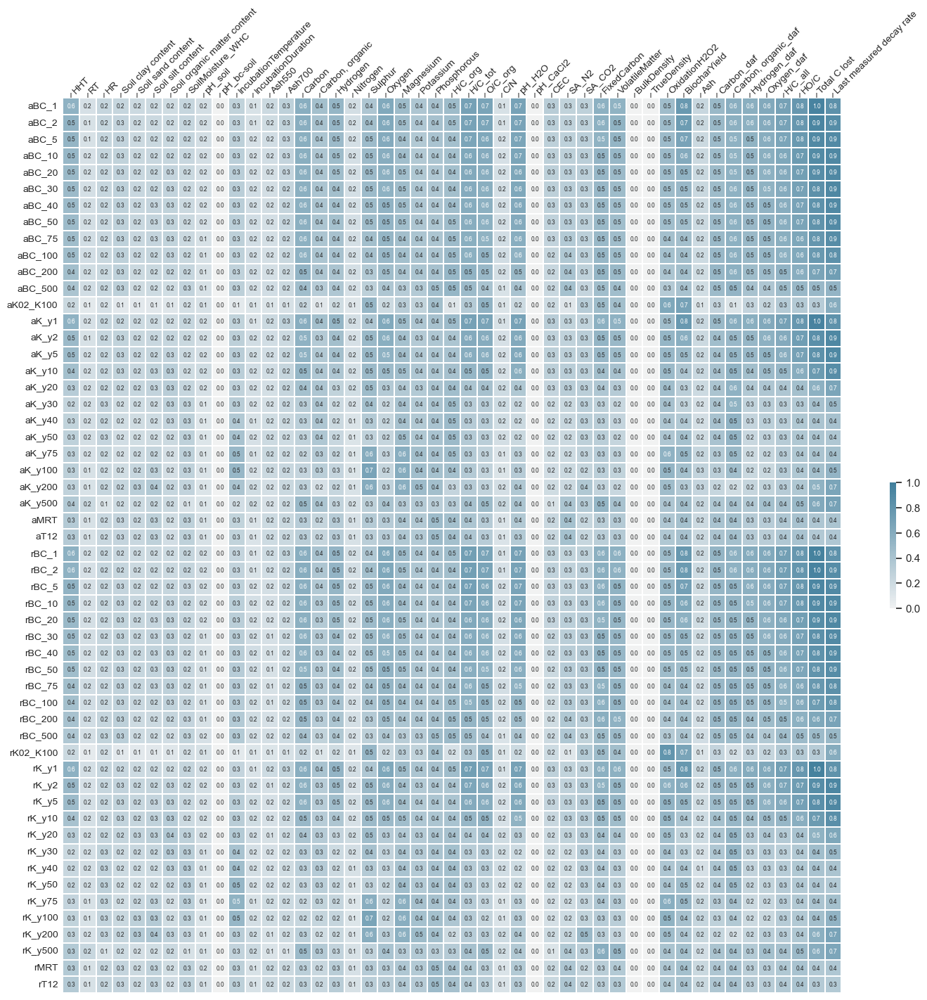

In [147]:
f, ax = make_corr4sf(S2_bestfit_Q10, metadata_S2_EDA, method='distance')
f.tight_layout()
f.savefig('../simulations/manuscript/FigureS17_DistanceCorrelation_S2Exp_DurabilityEstimates.png', dpi=600)

C:\anaconda\envs\bw2\lib\site-packages\dcor\_dcor_internals.py:144: RuntimeWarning: invalid value encountered in subtract
  out -= mu_rows
C:\anaconda\envs\bw2\lib\site-packages\dcor\_dcor_internals.py:144: RuntimeWarning: invalid value encountered in subtract
  out -= mu_rows


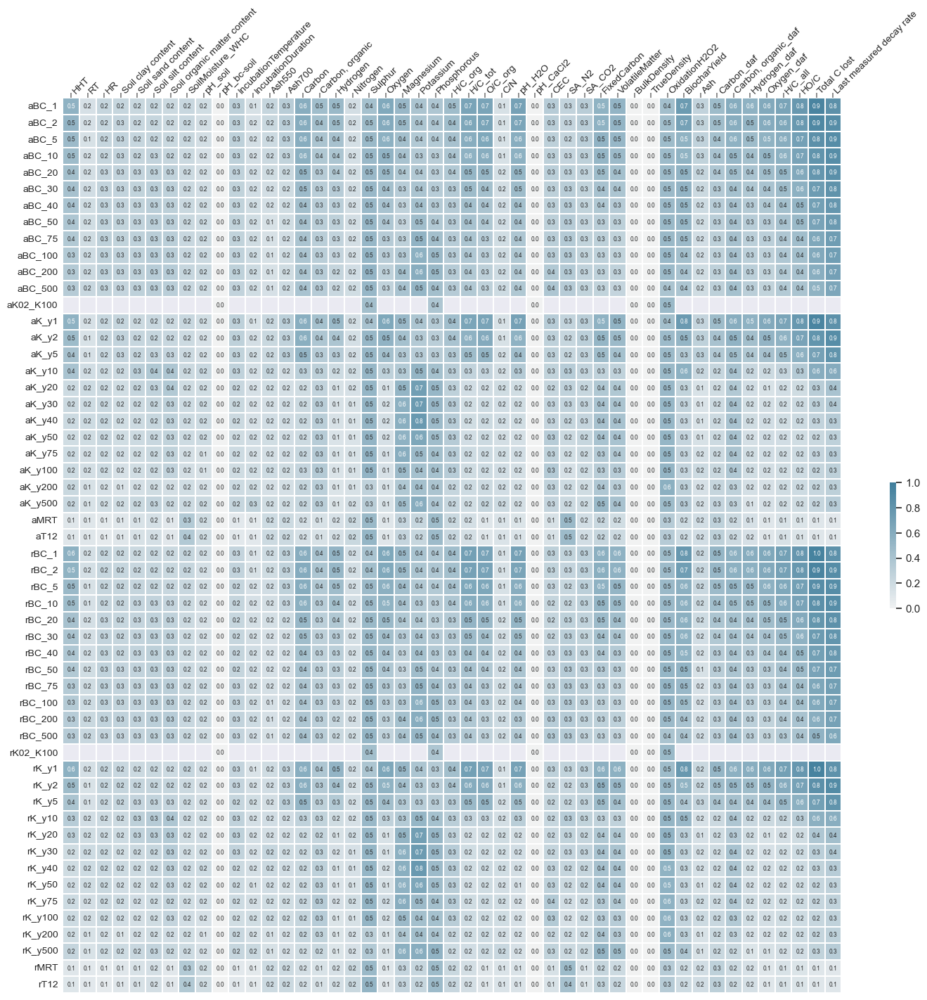

In [148]:
f2, ax2 = make_corr4sf(S3_bestfit_sQ10, metadata_S3_EDA, method='distance')
f2.tight_layout()
f2.savefig('../simulations/manuscript/FigureS18_DistanceCorrelation_S3Pow_DurabilityEstimates.png', dpi=600)

In [279]:
mS2_Q10 = metadata_wSF(S2_bestfit_Q10, metadata_S2_EDA)
mS2_sQ10 = metadata_wSF(S2_bestfit_sQ10, metadata_S2_EDA)
mS2_kExp = metadata_wSF(S2_bestfit_kExp, metadata_S2_EDA)

mS3_Q10 = metadata_wSF(S3_bestfit_Q10, metadata_S3_EDA)
mS3_sQ10 = metadata_wSF(S3_bestfit_sQ10, metadata_S3_EDA)
mS3_kExp = metadata_wSF(S3_bestfit_kExp, metadata_S3_EDA)

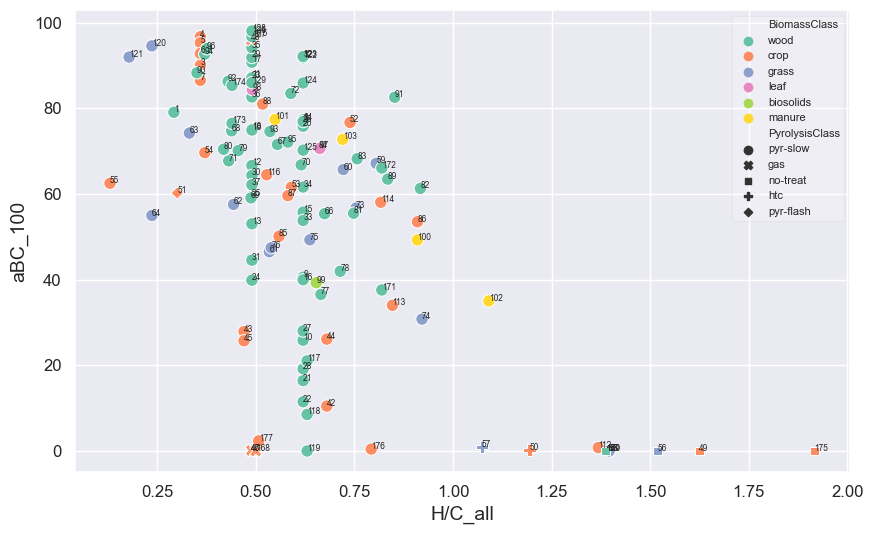

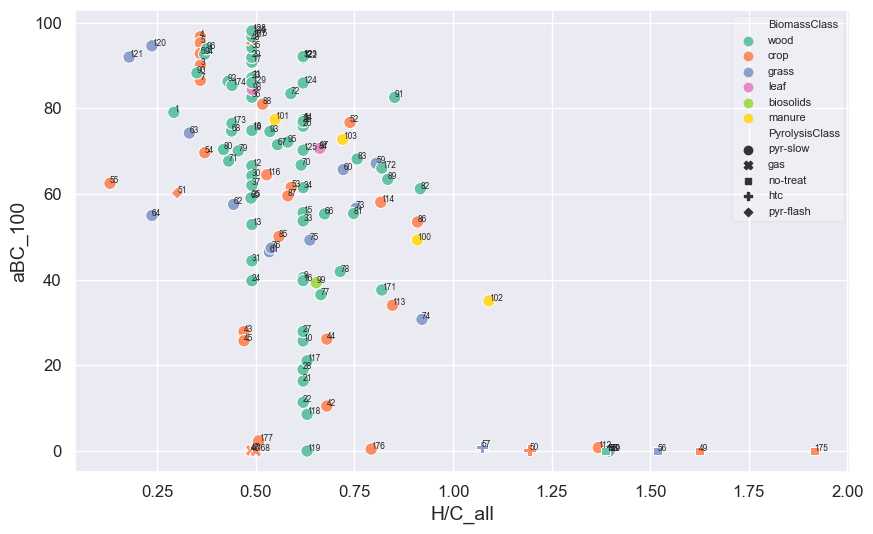

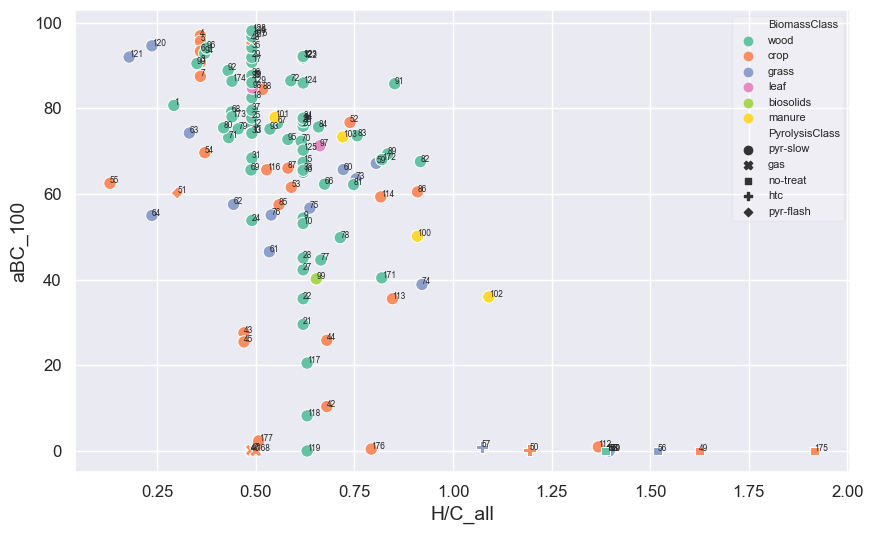

In [285]:
bs.make_corr_scatter(mS2_Q10, y='aBC_100', x='H/C_all', 
                  an=list(mS2_Q10.index), saveFig=False, figsize=(10,6))

bs.make_corr_scatter(mS2_sQ10, y='aBC_100', x='H/C_all', 
                  an=list(mS2_sQ10.index), saveFig=False, figsize=(10,6))

bs.make_corr_scatter(mS2_kExp, y='aBC_100', x='H/C_all', 
                  an=list(mS2_kExp.index), saveFig=False, figsize=(10,6))

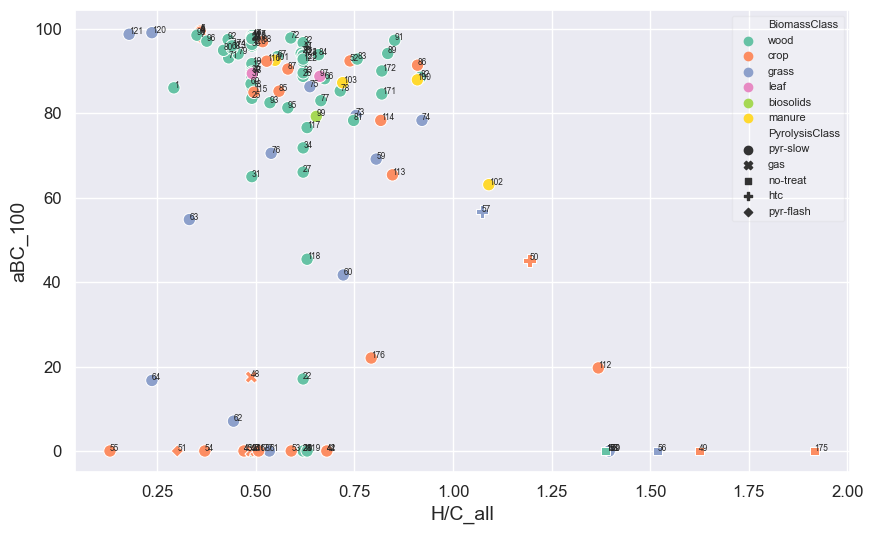

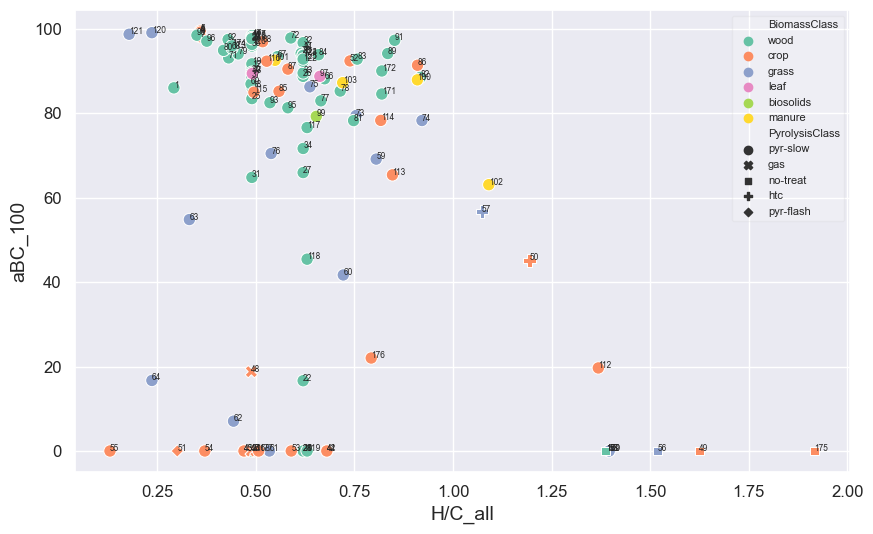

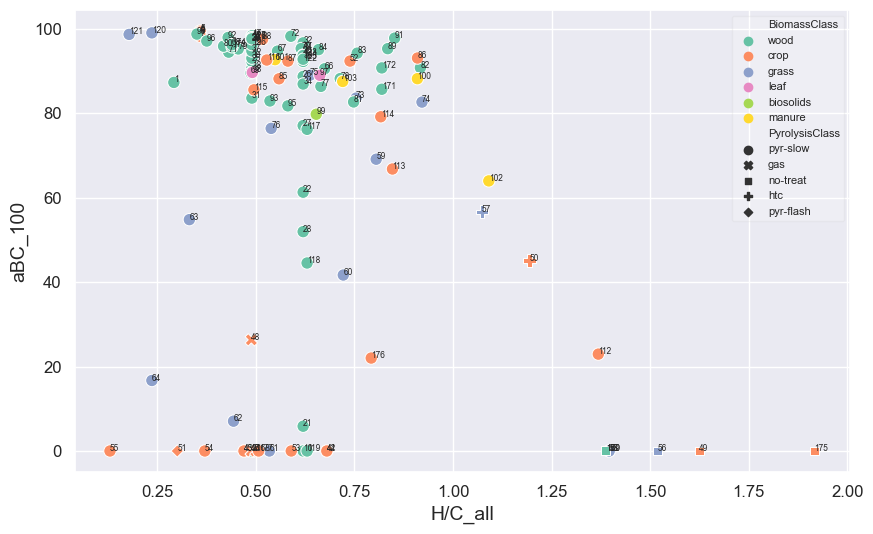

In [275]:
bs.make_corr_scatter(mS3_Q10, y='aBC_100', x='H/C_all', 
                  an=list(mS3_Q10.index), saveFig=False, figsize=(10,6))

bs.make_corr_scatter(mS3_sQ10, y='aBC_100', x='H/C_all', 
                  an=list(mS3_sQ10.index), saveFig=False, figsize=(10,6))

bs.make_corr_scatter(mS3_kExp, y='aBC_100', x='H/C_all', 
                  an=list(mS3_kExp.index), saveFig=False, figsize=(10,6))

<AxesSubplot: >

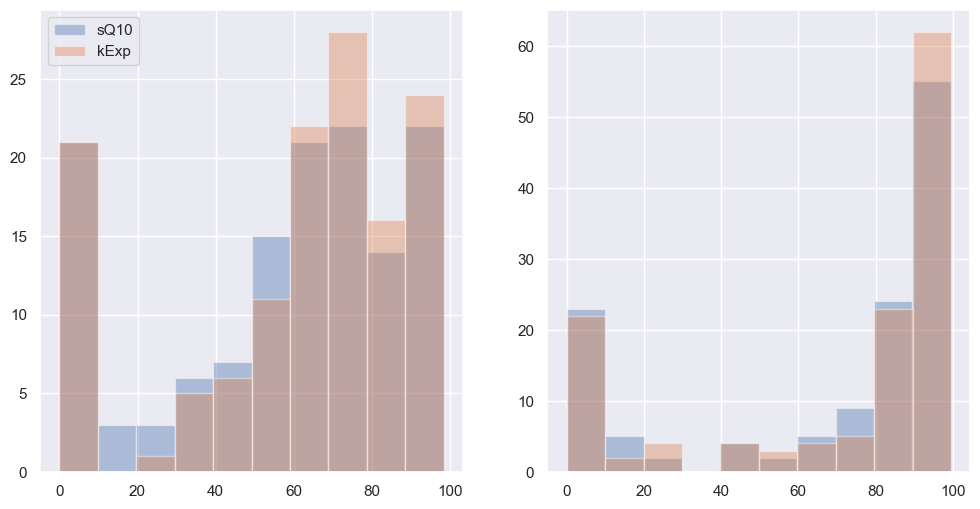

In [149]:
f, a = plt.subplots(nrows=1, ncols=2, figsize=(12,6))
i=0
#mS2_Q10['aBC_100'].hist(ax=a[i], alpha=0.4, label='Q10')
mS2_sQ10['aBC_100'].hist(ax=a[i], alpha=0.4, label='sQ10')
mS2_kExp['aBC_100'].hist(ax=a[i], alpha=0.4, label='kExp')
a[i].legend();
i=1
#mS3_Q10['aBC_100'].hist(ax=a[i], alpha=0.4, label='Q10')
mS3_sQ10['aBC_100'].hist(ax=a[i], alpha=0.4, label='sQ10')
mS3_kExp['aBC_100'].hist(ax=a[i], alpha=0.4, label='kExp')

# this figure shows that BC100 with three methods at 20C will lead very similar results!

In [293]:
y = ['aBC_10', 'aBC_50', 'aBC_100', 'aBC_200']
x = ['Total C lost', 'Last measured decay rate', 'H/C_all', 'Oxygen_daf', 'Carbon, organic_daf', 'Hydrogen_daf',
    'BiocharYield', 'FixedCarbon', 'VolatileMatter', 'OxidationH2O2','pH_H2O', 'O/C_org', 'HHT']

C:\Users\Elias S. Azzi\AppData\Local\Temp\ipykernel_23632\922148334.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f, a = plt.subplots(nrows=2, ncols=1, figsize=(12,10))


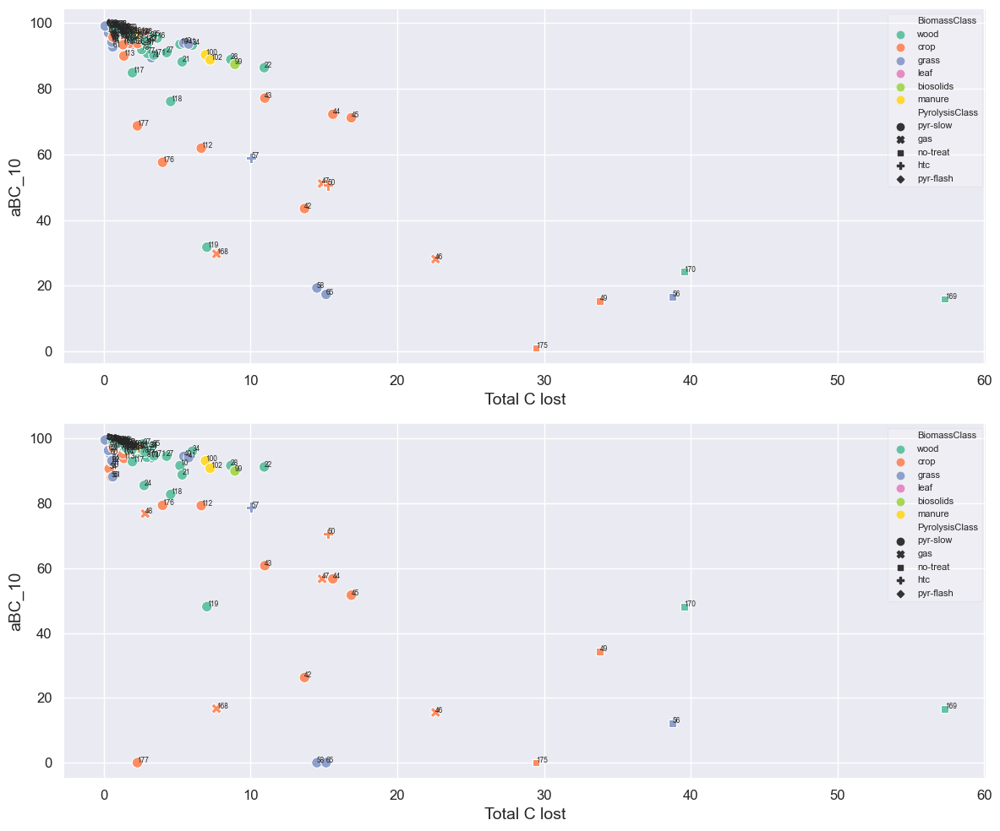

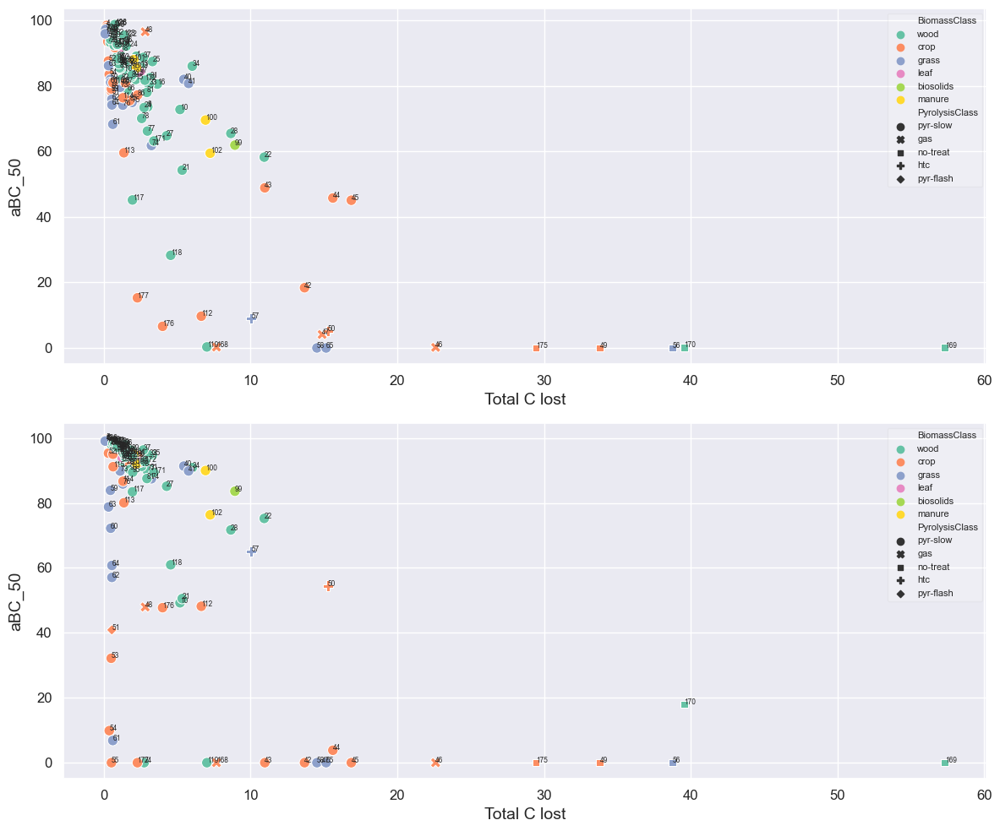

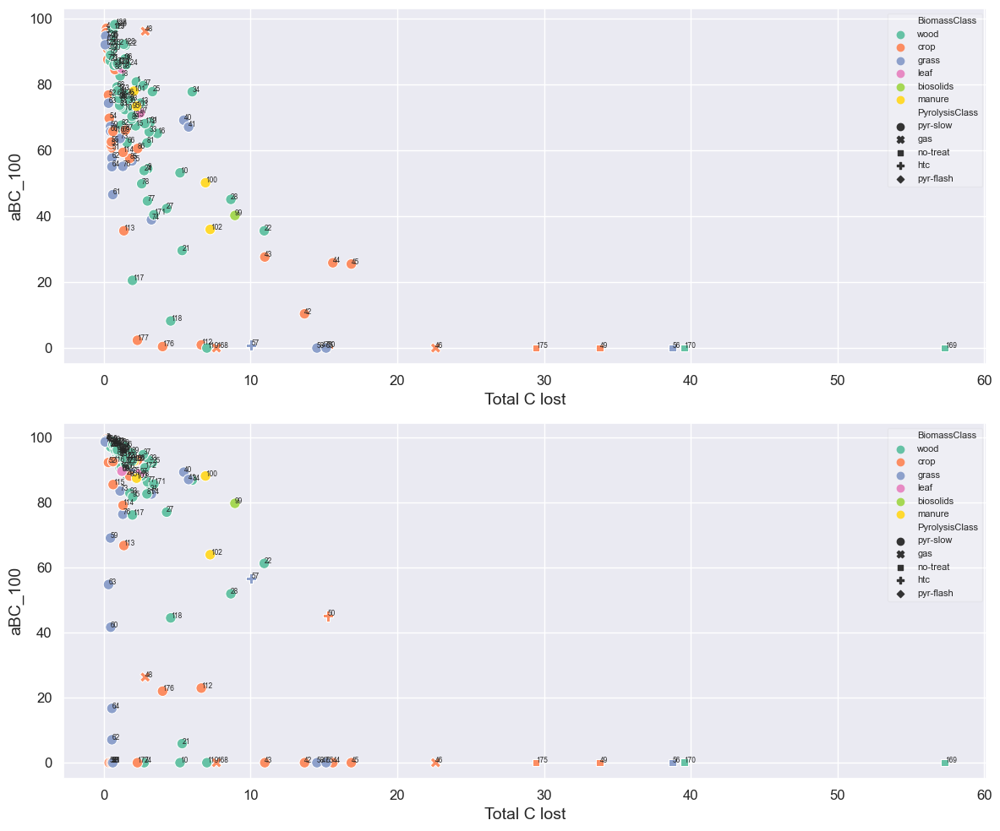

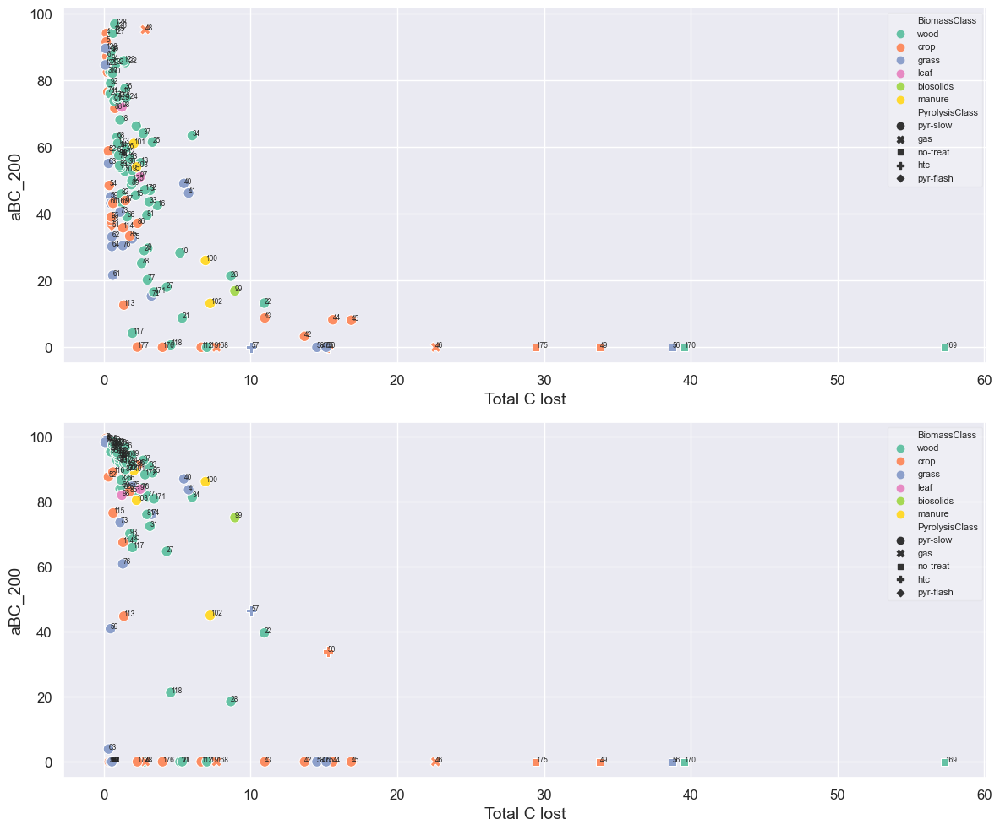

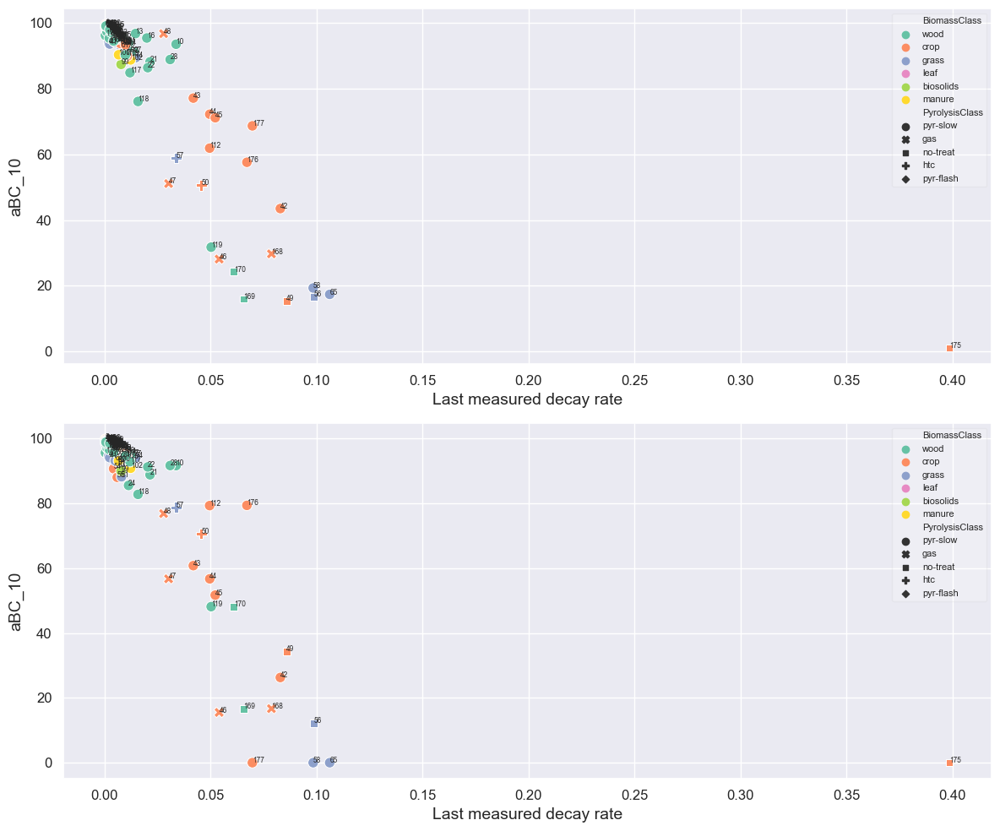

...

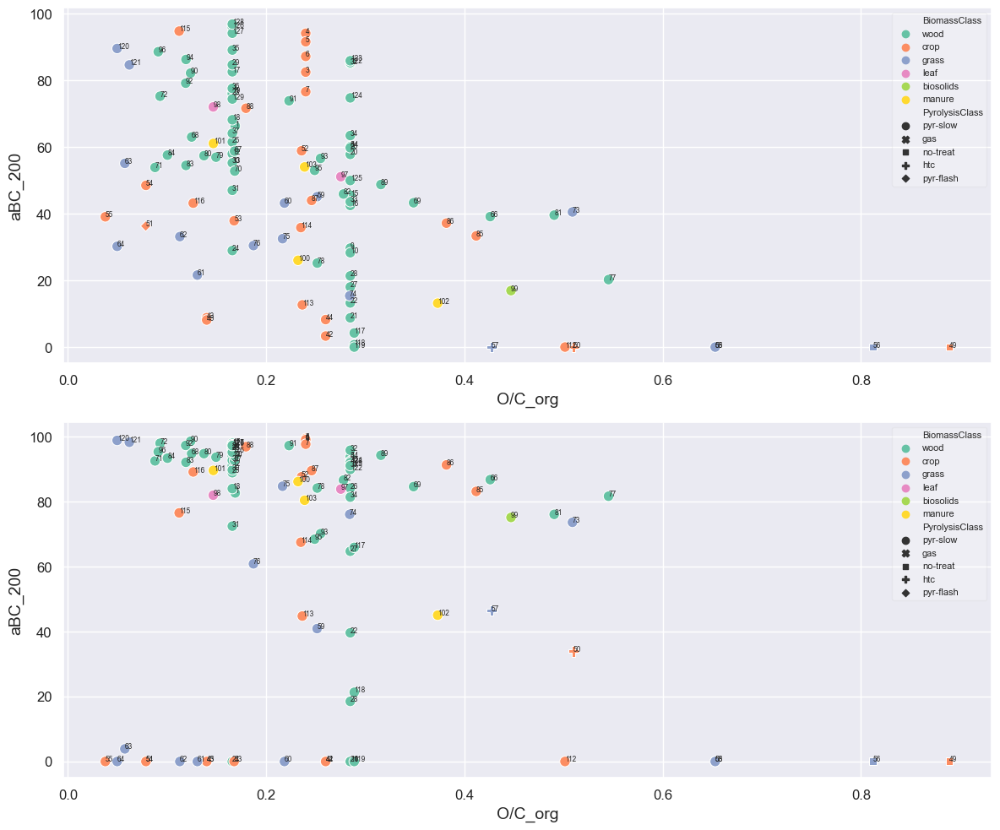

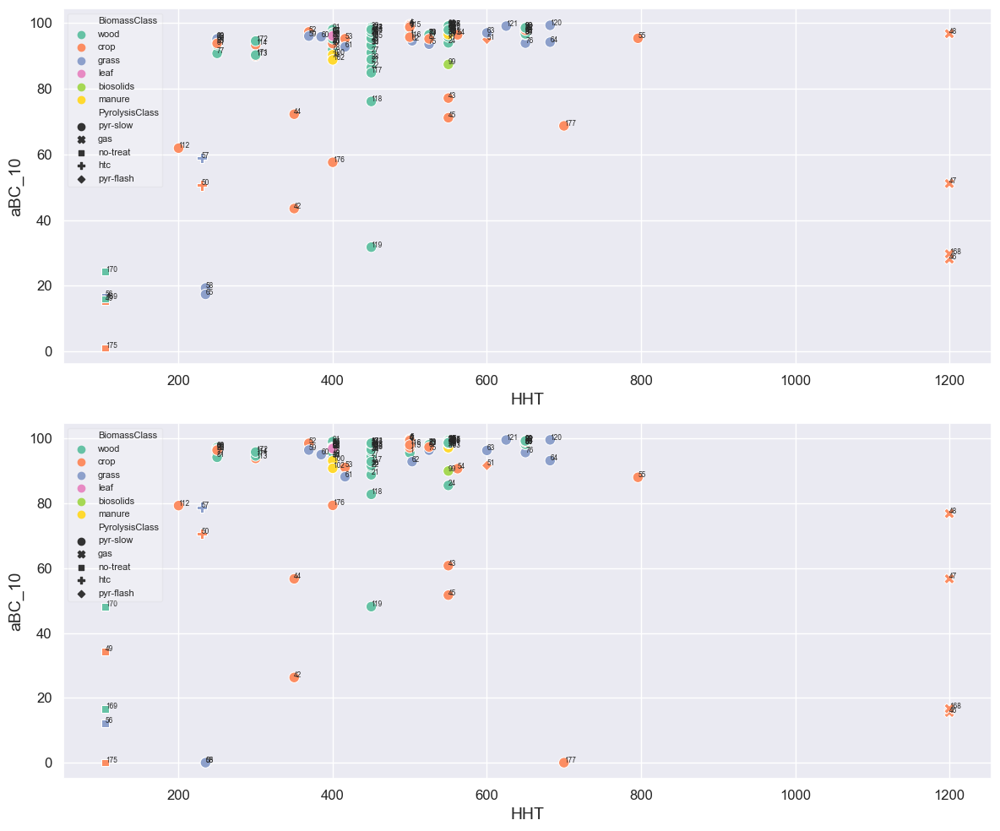

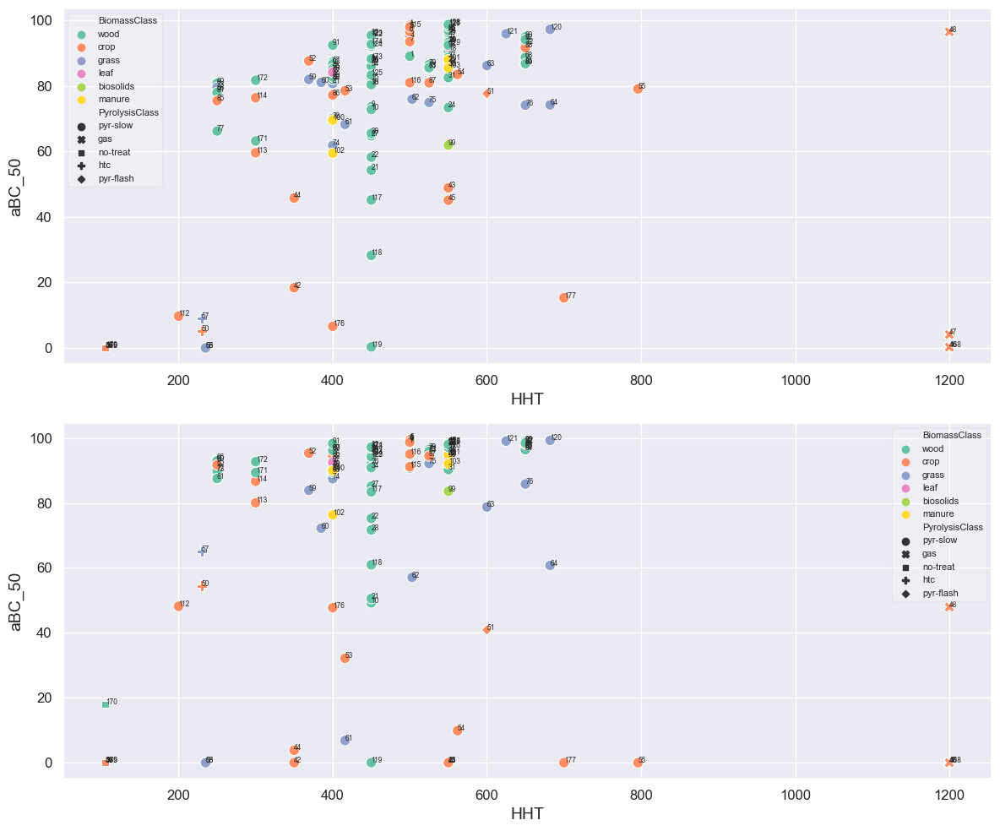

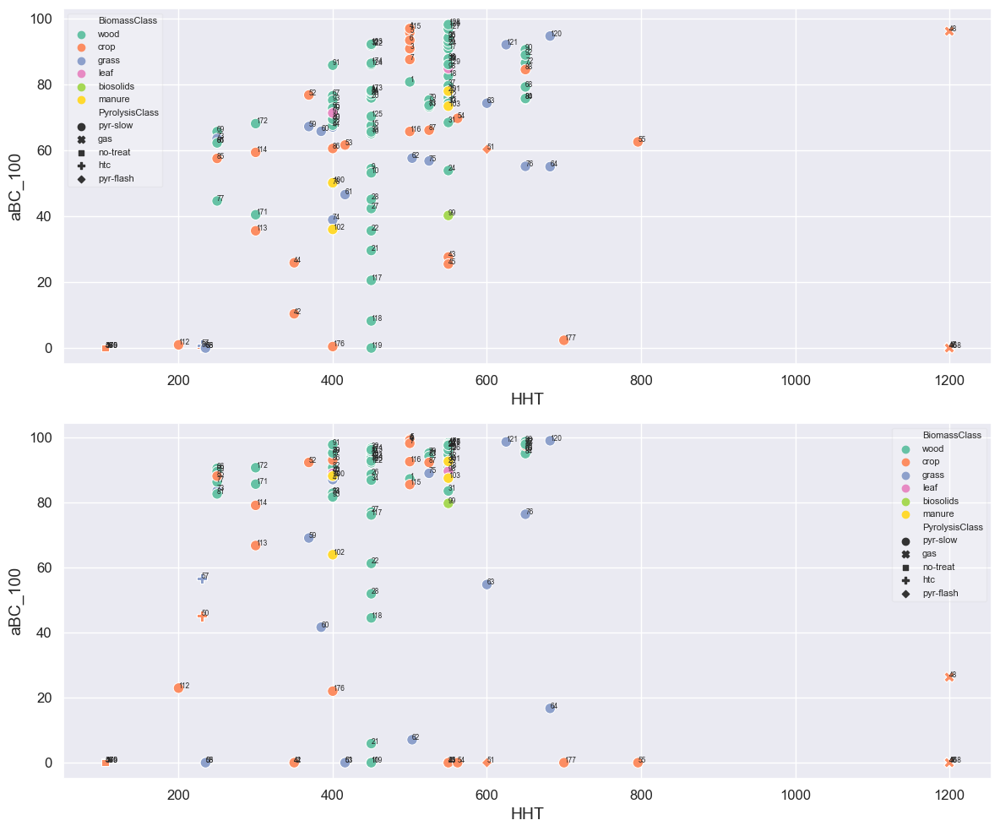

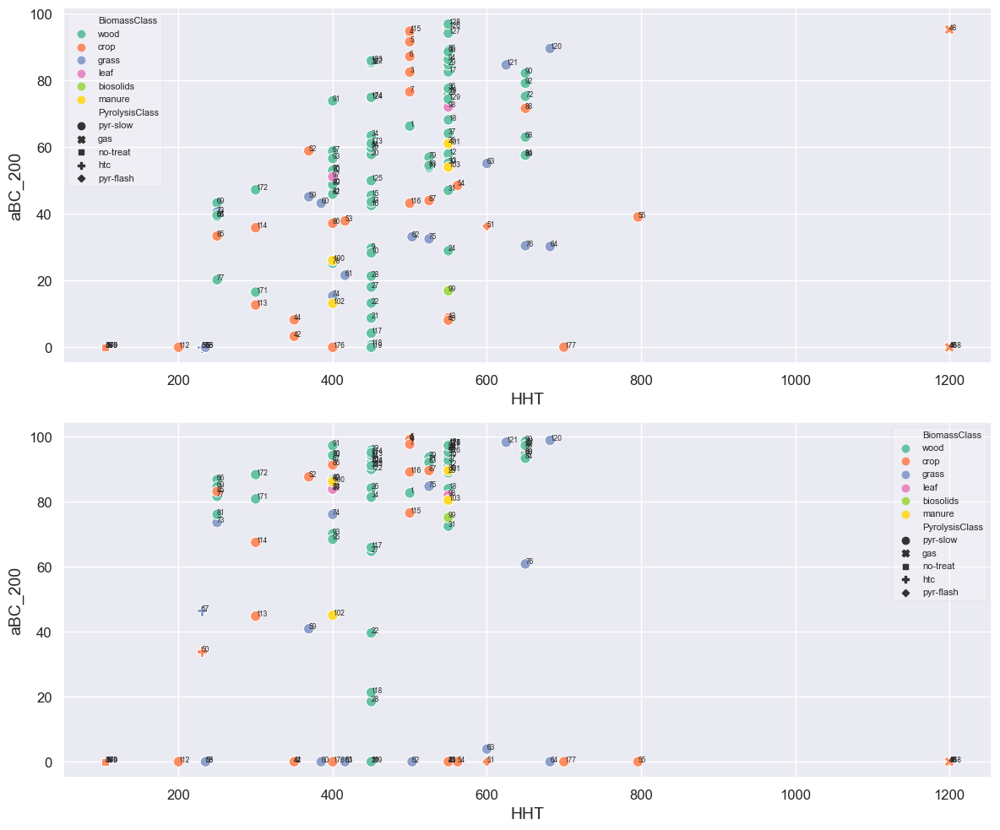

In [295]:
for xx, yy in itertools.product(x, y):
    f, a = plt.subplots(nrows=2, ncols=1, figsize=(12,10))
    bs.make_corr_scatter(mS2_kExp, y=yy, x=xx, 
                  an=list(mS2_kExp.index), fig=f, ax=a[0], saveFig=False)

    bs.make_corr_scatter(mS3_kExp, y=yy, x=xx,
                  an=list(mS3_kExp.index), fig=f, ax=a[1], saveFig=False)
    
    f.tight_layout()
    f.savefig('simulations/manuscript/scatter/scatter_'+str(xx).replace("/", "")+'_'+str(yy).replace("/", "")+'.png', dpi=200)
    plt.close()

In [304]:
xx='HO/C'
yy='aBC_100'
f, a = plt.subplots(nrows=2, ncols=1, figsize=(12,10))
bs.make_corr_scatter(mS2_kExp, y=yy, x=xx, 
              an=list(mS2_kExp.index), fig=f, ax=a[0], saveFig=False)

bs.make_corr_scatter(mS3_kExp, y=yy, x=xx,
              an=list(mS3_kExp.index), fig=f, ax=a[1], saveFig=False)

f.tight_layout()
#f.savefig('simulations/manuscript/scatter/scatter_'+str(xx).replace("/", "")+'_'+str(yy).replace("/", "")+'.png', dpi=200)
#plt.close()

We plot the scatter BC at any time horizon against any of the numerical variables in the dataset. We look at the scatters, and there is not any of them that looks like a good model of biochar durability (not better than previous ones; all with high variance). At least, when including all the datapoints without any filter.

## Excluding certain singular observations

Exclusion/Highlights from the correlations / regression models; but still shown on graphs in another color.

Different sets of data used and singular observations shown separately. 
- Fresh biomass [HTT < 200]
- H/C above threshold [very partially carbonized matter, not meeting the EBC definition of biochar of H/C < 0.7] 
- Incubation temperature above threshold [reason (whether valid or not): non-conventional soil behaviors, and limitations of temperature adjustment]
- Incubation durations below threshold [reason (whether valid or not): too short incubation to capture enough of long-term dynamics]

- Observations which have contrasting BC100 when using Power & Exponential models (i.e. when one predicts 0, but the other not)

- Experimental data showing irregularities, affecting curve fitting (detected from visual inspection of fits):
    - Affecting ExponentialModel:
    - Affecting PowerModel: when power model leads to accelerating decay (increasing rates) (m > 0)
     
   
- Outliers in correlation model, without explanation found (identified in later stage, when plotting scatter)



In [280]:
met = metadata.replace('na',np.NaN)

FreshBiomass = list(met[ met['HHT'] < 200].index)
FreshBiomass

[49, 56, 169, 170, 175]

In [281]:
met['H/C_all'] = met['H/C_org'].fillna(met['H/C_tot'], inplace=False)
tooHighHC = list(met[met['H/C_all'] > 0.7].index)
len(tooHighHC) # note: it also includes fresh biomass

31

In [282]:
tooHighTemp = list(met[met['IncubationTemperature'] > 39.].index)
len(tooHighTemp) #, tooHighTemp

20

In [283]:
tooShortExp = list(met[met['IncubationDuration'] < 349].index)
len(tooShortExp)

7

In [133]:
met[met['IncubationDuration'] < 345][['IncubationDuration', 'AuthorDate']]

,IncubationDuration,AuthorDate
ID_obs,,
48,164.0,Ventura2014
120,90.0,Rasse2017
121,90.0,Rasse2017
168,164.0,Ventura2014
175,200.0,Zhu2019
176,200.0,Zhu2019
177,200.0,Zhu2019


In [284]:
alpha = 20
s2 = S2_bestfit[[('observation', 'ID_obs', 'int'), ('estimator', 'BC100', '%')]].set_index(('observation', 'ID_obs', 'int'), drop=True).droplevel([0,2], axis=1)
s3 = S3_bestfit[[('observation', 'ID_obs', 'int'), ('estimator', 'BC100', '%')]].set_index(('observation', 'ID_obs', 'int'), drop=True).droplevel([0,2], axis=1)
s = s2.join(s3, lsuffix='EXP', rsuffix='POW')
PowerExpDiff = s[ ( (s['BC100EXP'] < alpha) & (s['BC100POW'] > alpha) ) | 
                ( (s['BC100EXP'] > alpha) & (s['BC100POW'] < alpha) )
                ]
lPowerExpDiff = list(PowerExpDiff.index)
len(PowerExpDiff)

15

In [285]:
PowerFitAccel = S3_bestfit[ S3_bestfit[ ('parameter', 'm', 'na')] > 0.].set_index(('observation', 'ID_obs', 'int'))
lPowerFitAccel = list(PowerFitAccel.index)
len(PowerFitAccel)

12

In [286]:
ExpSingle = S2_bestfit[ S2_bestfit[('strategy', 'model', 'str')].isin(['singleExp', 'singleExp_u'])].set_index(('observation', 'ID_obs', 'int'))
lExpSingle = list(ExpSingle.index)
len(lExpSingle)

13

In [287]:
# anything else not covered in previous criteria?
DataIrregularities = [
    # Power
    # Exponential
]

In [288]:
# Aubertin2021
# > excluding observations of weathered biochars (because C content is different from initial, making it not comparable with other observations)
# > excluding observations of pure biochar without soil, with only inoculum, because very small decay rates likely indicating non-viable microbial life
# > keeping only the 2 observations with fresh biochar mixed with compost
ExclAubertin2021 = [
    178, # miscanthus BC, fresh, without soil
    179, # miscanthus BC, weath, without soil
    181, # miscanthus BC, weath, with compost
    183, # corncob BC, weath, with compost
] # keeping 180 & 182

In [289]:
# how many observations in total, without/with dupplicates
AllCriteria = tooHighTemp + tooShortExp + lPowerExpDiff + lPowerFitAccel + lExpSingle + FreshBiomass + tooHighHC + ExclAubertin2021
sAllCriteria = set(AllCriteria)
len(AllCriteria), len(sAllCriteria), 128 - len(sAllCriteria)

(107, 72, 56)

In [1121]:
# how many observations in total, without/with dupplicates
AllCriteria = tooHighTemp + tooShortExp + lPowerExpDiff + lPowerFitAccel + lExpSingle + ExclAubertin2021#+ #FreshBiomass + tooHighHC 
sAllCriteria = set(AllCriteria)

synthesisExclusions = pd.DataFrame(index=list(sAllCriteria))
synthesisExclusions['AuthorDate'] = metadata.loc[synthesisExclusions.index, 'AuthorDate'].values
synthesisExclusions['NameObs'] = metadata.loc[synthesisExclusions.index, 'NameObs'].values
synthesisExclusions['lPowerExpDiff'] = [True if x in lPowerExpDiff else False for x in sAllCriteria]
synthesisExclusions['lPowerFitAccel'] = [True if x in lPowerFitAccel else False for x in sAllCriteria]
synthesisExclusions['lExpSingle'] = [True if x in lExpSingle else False for x in sAllCriteria]
synthesisExclusions['tooHighTemp'] = [True if x in tooHighTemp else False for x in sAllCriteria]
synthesisExclusions['tooShortExp'] = [True if x in tooShortExp else False for x in sAllCriteria]
#synthesisExclusions['FreshBiomass'] = [True if x in FreshBiomass else False for x in sAllCriteria]
#synthesisExclusions['tooHighHC'] = [True if x in tooHighHC else False for x in sAllCriteria]

synthesisExclusions['count'] = synthesisExclusions[['lPowerExpDiff', 'lPowerFitAccel', 'lExpSingle', 'tooHighTemp', 'tooShortExp' ]].sum(axis=1)
synthesisExclusions = synthesisExclusions.sort_values(by = 'count', ascending=False)

synthesisExclusions.to_clipboard()

* Among the 69 observations considered for exclusion, 13 of them meet two exclusion criteria. For 10 of these, it is related to a combination of lPowerExpDiff / lPowerFitAccel / lExpSingle, i.e. issue with data and curve fitting. 

In [290]:
UnexplainedOutliers = [
    43,45,44,42, # Herath
    46,47,168 # Ventura (field)
]

Excluding 43 observations.


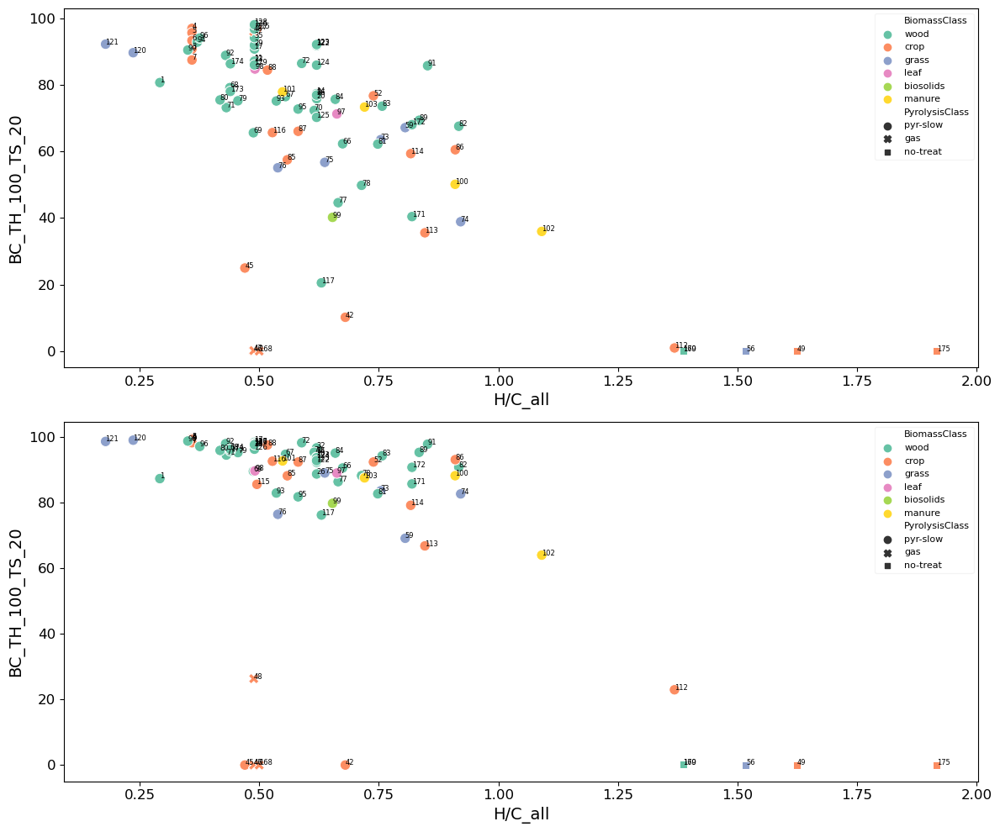

In [1091]:
AllCriteria = tooHighTemp  + lPowerExpDiff + lPowerFitAccel + lExpSingle + ExclAubertin2021 #+ FreshBiomass + tooHighHC
sAllCriteria = set(AllCriteria)
print('Excluding {} observations.'.format(len(sAllCriteria)))
xx='H/C_all'
yy='BC_TH_100_TS_20'#'aBC_100'
f, a = plt.subplots(nrows=2, ncols=1, figsize=(12,10))
bs.make_corr_scatter(mS2_kExp.drop(sAllCriteria, errors='ignore'), y=yy, x=xx, 
              an=list(mS2_kExp.drop(sAllCriteria, errors='ignore').index), fig=f, ax=a[0], saveFig=False)

bs.make_corr_scatter(mS3_kExp.drop(sAllCriteria, errors='ignore'), y=yy, x=xx,
              an=list(mS3_kExp.drop(sAllCriteria, errors='ignore').index), fig=f, ax=a[1], saveFig=False)

f.tight_layout()
#f.savefig('simulations/manuscript/scatter/scatter_'+str(xx).replace("/", "")+'_'+str(yy).replace("/", "")+'.png', dpi=200)
#plt.close()

Excluding 13 observations.


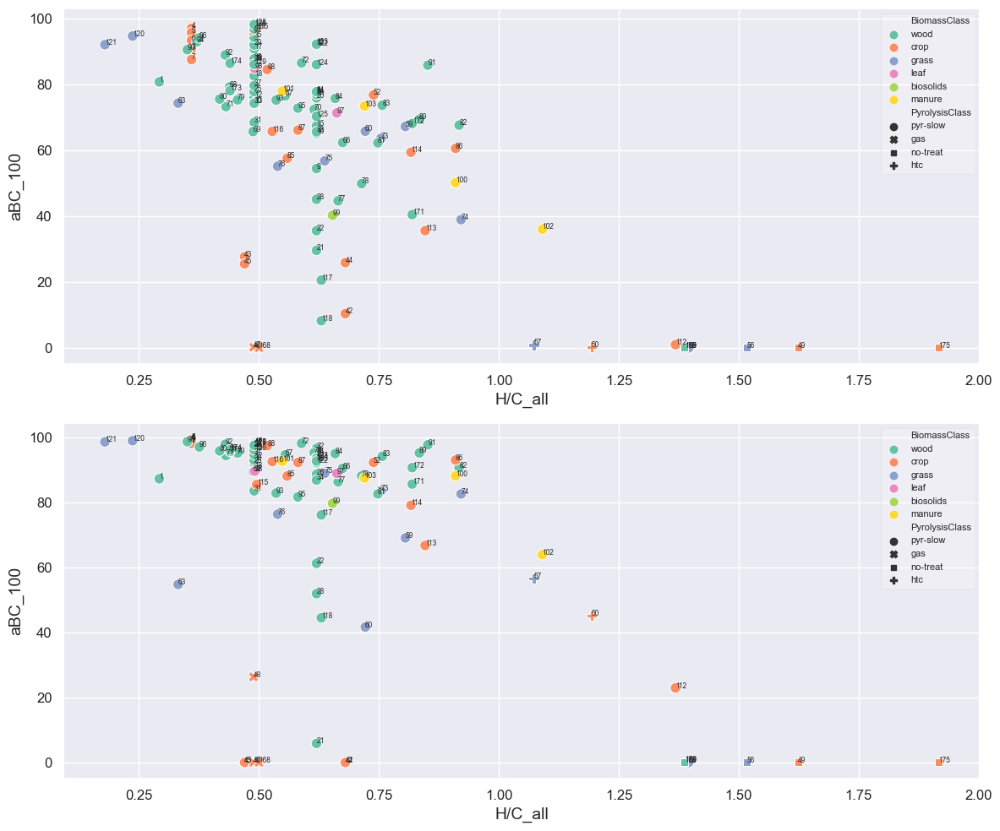

In [462]:
sAllCriteria = synthesisExclusions[ synthesisExclusions['count'] > 1 ].index

print('Excluding {} observations.'.format(len(sAllCriteria)))
xx='H/C_all'
yy='aBC_100'
f, a = plt.subplots(nrows=2, ncols=1, figsize=(12,10))
bs.make_corr_scatter(mS2_kExp.drop(sAllCriteria, errors='ignore'), y=yy, x=xx, 
              an=list(mS2_kExp.drop(sAllCriteria, errors='ignore').index), fig=f, ax=a[0], saveFig=False)

bs.make_corr_scatter(mS3_kExp.drop(sAllCriteria, errors='ignore'), y=yy, x=xx,
              an=list(mS3_kExp.drop(sAllCriteria, errors='ignore').index), fig=f, ax=a[1], saveFig=False)

f.tight_layout()
#f.savefig('simulations/manuscript/scatter/scatter_'+str(xx).replace("/", "")+'_'+str(yy).replace("/", "")+'.png', dpi=200)
#plt.close()

## Univariate linear models

In [291]:
def make_corr_scatter(df, x='HHT', y='BC_100', c='BiomassClass', m = 'PyrolysisClass', 
                      an=False, fi=None, 
                      fig=None, ax=None, saveFig=False, figsize=(6,6), zorder=None, s=80):
    '''
    Plot of scatter between two columns of the passed dataframe, with options to set color and marker via other columns, and annotate each datapoint.
    ''' 
    if ax is None:
        fig, ax = plt.subplots(nrows=1, ncols=1, figsize=figsize)
    if c is None:
        hue= None
        palette='dimgray' #sns.color_palette("Set2", as_cmap=False)[6]
        alpha=0.6
        sns.scatterplot(data=df, x=x, y=y, style=m, hue=hue, palette=palette, alpha=alpha, ax = ax, s=s, color=palette, zorder=zorder)
    else:
        hue = c
        palette = sns.color_palette("Set2", as_cmap=False)[:len(df[c].dropna().unique())]
        alpha=0.8
        sns.scatterplot(data=df, x=x, y=y, style=m, hue=hue, palette=palette, alpha=alpha, ax = ax, s=s, zorder=zorder)
    
    ax.set_xlabel(x, fontsize=14)
    ax.set_ylabel(y, fontsize=14)
    ax.tick_params(axis='both', which='major', labelsize=12)
    #ax.legend(facecolor='white', framealpha=0.2, fontsize=8) 
    
    handles, labels = ax.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax.legend(by_label.values(), by_label.keys(), loc='upper right')
    
    if an is not False:
        texts = an
        xss = list(df[x])
        yss = list(df[y])
        for i, txt in enumerate(texts):
            ax.annotate(txt, xy=(xss[i], yss[i]), xycoords="data", fontsize=6)
        
    if saveFig:
        x = x.replace("/", "")
        fig.savefig('simulations/scatter-'+y+'---'+x+'.png', dpi=300, bbox_inches='tight')

def CF_lvl(lvl=90):
    CF = {95:1.96, 90:1.645, 85:1.440, 80:1.282}
    return CF[lvl]

## Linear regression with scipy
def linear(x, a, b):
    return a*x+b


def linear_clip(x, a, b):
    y = a*x+b
    y = np.clip(y, 0.00, 100.0)
    return y

def std_linear(x, p_opt, p_cov):
    a = p_opt[0]
    b = p_opt[1]
    gX = np.array([x, 1])
    std_f2 = gX.T @ p_cov @ gX
    return np.sqrt(std_f2)

def parametric_sigmoid(x, max_value, min_value, a, b):
    return (max_value - min_value) / (1 + np.exp(a * (x - b))) + min_value

def parametric_sigmoid_toZero(x, max_value, a, b):
    return (max_value - 0) / (1 + np.exp(a * (x - b))) + 0

def power_func(x, M, a, c):
    return M - a * (x**c)

def power_func_NN(x, M, a, c):
    '''Non-Negative power function'''
    if M - a * (x**c) > 0:
        return M - a * (x**c)
    else:
        return 0 

def power_clip(x, M, a, c):
    y = M - a * ( (x) ** c)
    y = np.clip(y, 0.00, 100.0)
    return y

def piecewise_linear(x, breakpoints, intercepts):
    slopes = np.zeros_like(breakpoints)
    slopes[:-1] = np.diff(intercepts) / np.diff(breakpoints)
    piece_index = np.searchsorted(breakpoints, x, side='right') - 1
    return slopes[piece_index] * (x - breakpoints[piece_index]) + intercepts[piece_index]

def apply_cap(arr, low=0, high=100):
    arr[arr < low ]=low
    arr[arr > high ]=high
    return arr

def std_power_clip(t, p_opt, p_cov):
    '''
    Given optimal parameters of a fit (p_opt), the covariance matrix of the fitted parameters (p_cov),
    calculate the propagated error through a power function, based on Talor series expansion of 1st order
    https://en.wikipedia.org/wiki/Propagation_of_uncertainty

    See definition of `power_clip` for order of parameters (the clip is not defined as an explicit parameter)
    '''
    M = p_opt[0]
    a = p_opt[1]
    c = p_opt[2]
    gX = np.array([1 , t**c , a*np.log(t)*(t**c) ]) # gradient of power_clip, for vector X
    std_f2 = gX.T @ p_cov @ gX
    return np.sqrt(std_f2)

In [292]:
# drop most 
AllCriteria = tooHighTemp + tooShortExp + lPowerExpDiff + lPowerFitAccel + lExpSingle + ExclAubertin2021 #+ FreshBiomass + tooHighHC
sAllCriteria = set(AllCriteria)

AllCriteriaBiomass= tooHighTemp + tooShortExp + lPowerExpDiff + lPowerFitAccel + lExpSingle + FreshBiomass + ExclAubertin2021 #+ tooHighHC
sAllCriteriaBiomass = set(AllCriteriaBiomass)

# drop least
#sFittingCriteria = synthesisExclusions[ synthesisExclusions['count'] > 1 ].index


### Main scatter at 20°C

Without any regression curves/lines:

In [293]:
def evaluateRegression(func, params, xData, yData, clipValues=[0,100]):
    "Evaluating the regression model for given function and paramters"
    r2, _ = bs.rsquare(func, xData, yData, params)
    res, chisqr, redchisqr, aic, bic = bs.lmfit_fitting_stats(func, xData, yData, params)
    mae = mean_absolute_error(yData, func(xData, *params))
    
    # Calculating R2 only for the observations in the domain where BC100 is not clipped or capped
    tmpBC100 = func(xData, *params)
    NotForR2 = list(tmpBC100[( tmpBC100 == clipValues[0] ) | (tmpBC100 == clipValues[1])].index) # clipping is corresponding to predicted BC100 of 100 or 0%
    r2_excludingObs, _ = bs.rsquare(func, xData.drop(NotForR2, axis=0), yData.drop(NotForR2, axis=0), params)
    print("Model: ",  func.__name__)
    print("Params: ", params)
    print("Chisqr: ", chisqr, "\nAIC: ", aic, "\nBIC: ", bic)
    print("MAE:", mae)
    print("R2: ", r2)
    print("R2 Adjusted Obs: ", r2_excludingObs, "\n")
    return r2, mae

#### Fig. Scatter all data

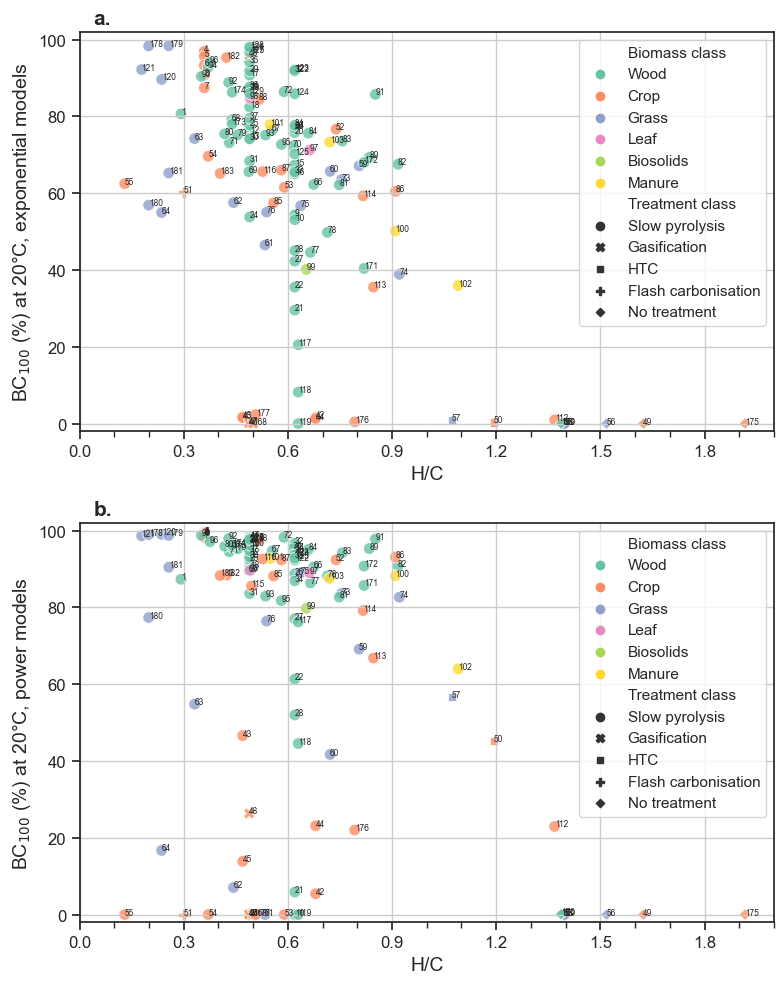

In [269]:
# PLOTING
%matplotlib inline
trendline=False
confidence=True
figsize = (8,10)
CF = 95

dummyClasses = pd.DataFrame(columns=df1.columns)
dummyClasses['PyrolysisClass'] = ['pyr-slow', 'gas', 'htc', 'pyr-flash', 'no-treat']
mappingKeys = {'BiomassClass':'Biomass class','wood':'Wood','crop':'Crop','grass':'Grass','leaf':'Leaf','biosolids':'Biosolids','manure':'Manure',
    'PyrolysisClass':'Treatment class', 'pyr-slow':'Slow pyrolysis', 'gas':'Gasification',
               'htc':'HTC', 'pyr-flash':'Flash carbonisation', 'no-treat': 'No treatment'
              }
with sns.axes_style("ticks"):

    f, a = plt.subplots(nrows=2, ncols=1, figsize=figsize)
    i = 0
    # scatter data
    make_corr_scatter(pd.concat([dummyClasses,df1],axis=0), y=yy, x=xx, an=list(pd.concat([dummyClasses,df1],axis=0).index), fig=f, ax=a[i], saveFig=False, s=70) # an = list(df1_to_plot.index)

    handles, labels = a[i].get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    for k,v in mappingKeys.items():
        if k in by_label:
            by_label[v] = by_label.pop(k)
        else:
            continue
        
    # lin reg on data
    if trendline:
        
        # LINEAR, EXP
        ccc = 'black'
        a[i].plot(xxx, r_exp_LIN, ls='solid', color=ccc, zorder=-100)
        lbl = "{} = {:.2f} x {} + {:.2f} | R2 = {:.2f}".format(yy, p_opt1[0], xx , p_opt1[1], eRl)
        print("Linear regression, exp, subset: "+lbl)
        
        txt = r"BC$_{100}$ = "+"{:.1f} - {:.1f}*H/C | R$^2$ = {:.2f} | MAE = {:.1f}".format(p_opt1[1], -1*p_opt1[0], eRl, eMl)
        a[i].annotate(txt, xy=(.025, 12), xycoords="data", fontsize=10, color=ccc)
        
        #txt= r"-- r$^{2}$"+" = {:.2f}".format(eRl)
        #a[i].annotate(txt, xy=(1.2, 90), xycoords="data", fontsize=12, color=ccc)
 
        if confidence:
            a[i].plot(xxx, linear(xxx, *p_opt1) + CF_lvl(CF)* np.array([std_linear(xx, p_opt1, p_cov1) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)
            a[i].plot(xxx, linear(xxx, *p_opt1) - CF_lvl(CF)* np.array([std_linear(xx, p_opt1, p_cov1) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)

        # LINEAR CLIP, EXP
        #ccc = 'orange'
        #ynew = linear_clip(xxx, *popt1_linclim)
        #a[i].plot(xxx, ynew, ls='dashed', color=ccc)
        #lbl = "{} = {:.2f} x {} + {:.2f} | R2 = {:.2f}".format(yy, popt1_linclim[0], xx , popt1_linclim[1], eRlc)
        #print("Clipped linear regression, exp, subset: "+lbl)

        #txt= r"r$^{2}$"+" = {:.2f}".format(eRlc)
        #a[i].annotate(txt, xy=(1.2, 10), xycoords="data", fontsize=12, color=ccc)

        # POWER CLIP, EXP
        ccc = 'blue'
        ynew = power_clip(xxx, *popt1_powclim)
        a[i].plot(xxx, ynew, ls='solid', color=ccc, zorder=-100)
        lbl = "{} = {:.2f} - {:.2f} * {} ^ ({:.2f}) | R2 = {:.2f}".format(yy, popt1_powclim[0], popt1_powclim[1], xx , popt1_powclim[2], eRpc)
        print("Clipped power regression, exp, subset: "+lbl)
        
        txt = r"BC$_{100}$ = "+"{:.1f} - {:.1f}*H/C^{:.1f} | R$^2$ = {:.2f} | MAE = {:.1f}".format(popt1_powclim[0], popt1_powclim[1], popt1_powclim[2], eRpc, eMpc)
        a[i].annotate(txt, xy=(.025, 4), xycoords="data", fontsize=10, color=ccc)
        
        #txt= r"-- r$^{2}$"+" = {:.2f}".format(eRpc)
        #a[i].annotate(txt, xy=(1.2, 70), xycoords="data", fontsize=12, color=ccc)

        if confidence:
            a[i].plot(xxx, power_func(xxx, *popt1_powclim) + CF_lvl(95)* np.array([std_power_clip(xx, popt1_powclim, pcov1_powclip) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)
            a[i].plot(xxx, power_func(xxx, *popt1_powclim) - CF_lvl(95)* np.array([std_power_clip(xx, popt1_powclim, pcov1_powclip) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)

        # Adding RF model:
        a[i].plot(fit_exp['BC_TS_20_TH_100'].index, fit_exp['BC_TS_20_TH_100'].values, color="red", ls='solid', lw=0.7)

    a[i].set_xlabel('H/C')
    a[i].set_ylabel(r'BC$_{100}$ (%) at 20°C, exponential models')
    a[i].set_xlim(x_lim)
    
    
    i=1
    make_corr_scatter(pd.concat([dummyClasses,df2],axis=0), y=yy, x=xx, an=list(pd.concat([dummyClasses,df2],axis=0).index), fig=f, ax=a[i], saveFig=False, s=70) # an = list(df1_to_plot.index)

    handles, labels = a[i].get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    for k,v in mappingKeys.items():
        if k in by_label:
            by_label[v] = by_label.pop(k)
        else:
            continue
        
    # lin reg on data
    if trendline:
        print("\n")
        
        # LINEAR, POW
        ccc = 'black'
        a[i].plot(xxx, r_pow_LIN, ls='solid', color=ccc, zorder=-100)
        lbl = "{} = {:.2f} x {} + {:.2f} | R2 = {:.2f}".format(yy, p_opt2[0], xx , p_opt2[1], pRl)
        print("Linear regression, pow, subset: "+lbl)
        
        txt = r"BC$_{100}$ = "+"{:.1f} - {:.1f}*H/C | R$^2$ = {:.2f} | MAE = {:.1f}".format(p_opt2[1], -1*p_opt2[0], pRl, pMl)
        a[i].annotate(txt, xy=(.025, 12), xycoords="data", fontsize=10, color=ccc)
        
        #txt= r"-- r$^{2}$"+" = {:.2f}".format(pRl)
        #a[i].annotate(txt, xy=(1.2, 90), xycoords="data", fontsize=12, color=ccc)

        if confidence:
            a[i].plot(xxx, linear(xxx, *p_opt2) + CF_lvl(CF)* np.array([std_linear(xx, p_opt2, p_cov2) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)
            a[i].plot(xxx, linear(xxx, *p_opt2) - CF_lvl(CF)* np.array([std_linear(xx, p_opt2, p_cov2) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)

    
        # LINEAR CLIP, POW
        #ccc = 'orange'
        #ynew = linear_clip(xxx, *popt2_linclim)
        #a[i].plot(xxx, ynew, ls='dashed', color=ccc)
        #lbl = "{} = {:.2f} x {} + {:.2f} | R2 = {:.2f}".format(yy, popt2_linclim[0], xx , popt2_linclim[1], pRlc)
        #print("Clipped linear regression, pow, subset: "+lbl)

        #txt= r"r$^{2}$"+" = {:.2f}".format(pRlc)
        #a[i].annotate(txt, xy=(1.2, 10), xycoords="data", fontsize=12, color=ccc)

        # POWER CLIP, POW
        ccc = 'blue'
        ynew = power_clip(xxx, *popt2_powclim)
        a[i].plot(xxx, ynew, ls='solid', color=ccc, zorder=-100)
        lbl = "{} = {:.1f} - {:.2f} * {} ^ ({:.2f}) | R2 = {:.2f}".format(yy, popt2_powclim[0], popt2_powclim[1], xx , popt2_powclim[2], pRpc)
        print("Clipped power regression, pow, subset: "+lbl)

        txt = r"BC$_{100}$ = "+"{:.1f} - {:.1f}*H/C^{:.2f} | R$^2$ = {:.2f} | MAE = {:.1f}".format(popt2_powclim[0], popt2_powclim[1], popt2_powclim[2], pRpc, pMpc)
        a[i].annotate(txt, xy=(.025, 4), xycoords="data", fontsize=10, color=ccc)
        
        #txt= r"-- r$^{2}$"+" = {:.2f}".format(pRpc)
        #a[i].annotate(txt, xy=(1.2, 70), xycoords="data", fontsize=12, color=ccc)

        if confidence:
            a[i].plot(xxx, power_func(xxx, *popt2_powclim) + CF_lvl(95)* np.array([std_power_clip(xx, popt2_powclim, pcov2_powclip) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)
            a[i].plot(xxx, power_func(xxx, *popt2_powclim) - CF_lvl(95)* np.array([std_power_clip(xx, popt2_powclim, pcov2_powclip) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)

        # Adding RF model:
        a[i].plot(fit_pow['BC_TS_20_TH_100'].index, fit_pow['BC_TS_20_TH_100'].values, color="red", ls='solid', lw=0.7)
        
    a[i].set_xlabel('H/C')
    a[i].set_ylabel(r'BC$_{100}$ (%) at 20°C, power models')
    for i in [0,1]:
        a[i].text(0.02, 1.02, string.ascii_lowercase[i]+r'.', transform=a[i].transAxes, size=15, weight='bold')
        a[i].set_ylim([-2, 102])
        a[i].set_xlim(x_lim)
        a[i].xaxis.set_major_locator(MultipleLocator(0.3))
        a[i].xaxis.set_major_formatter('{x:.1f}')
        a[i].xaxis.set_minor_locator(MultipleLocator(0.1))
        a[i].grid(axis='both')
        a[i].set_axisbelow(True)
        a[i].legend(by_label.values(), by_label.keys(), loc='upper right')


    f.tight_layout()
    f.savefig('../simulations/manuscript/FigureS19_aBC100_ExpPower_withoutRegressions_AllDataIDs', dpi=600)

In [78]:
toDrop = [None]#sAllCriteria
df1 = mS2_kExp
df2 = mS3_kExp
figsize = (8,10)
xx='H/C_all'
yy= 'BC_TH_100_TS_20'#'aBC_100'
x_lim = [0, 2]
trendline = False
trenderror = False

if len(toDrop)>0:
    print('Excluding {} observations.'.format(len(toDrop)))

df1_to_plot = df1.drop(toDrop, errors='ignore')
df1_outliers = df1[df1.index.isin(toDrop)] 
df2_to_plot = df2.drop(toDrop, errors='ignore')
df2_outliers = df2[df2.index.isin(toDrop)] 

Excluding 1 observations.


In [79]:
## REGRESSIONS (without singular observations)
# 1 >> exp
# 2 >> pow

# taking care of potential NaNs in xx [e.g. Kuzyakov]
xxx = np.linspace(x_lim[0]+0.001, x_lim[1], 1000) # range of H/C
vXnan1 = list(df1_to_plot[df1_to_plot[xx].isna()].index)
vXnan2 = list(df2_to_plot[df2_to_plot[xx].isna()].index)
vX1 = df1_to_plot.drop(vXnan1, axis=0) # exp
vX2 = df2_to_plot.drop(vXnan2, axis=0) # pow
print('Nb of observations left, after removing NaNs: {} (exponential), {} (power)'.format(len(vX1), len(vX2)))

# select an error function for curve_fit
err_func = mean_absolute_error #mean_squared_error # explained_variance_score  

# LINEAR, EXP
p_opt1, p_cov1 = curve_fit(f=linear, xdata=vX1[xx], ydata=vX1[yy], p0=None, method='trf', sigma=None, absolute_sigma=False)
r2_1, _ =  bs.rsquare(linear, vX1[xx], vX1[yy], p_opt1) # R2
eVar1 = err_func(vX1[yy], linear(vX1[xx], *p_opt1))

r_exp_LIN = linear(xxx, *p_opt1)
r_exp_LIN[r_exp_LIN < 0 ]=0
r_exp_LIN[r_exp_LIN > 100 ]=100
r_exp_LIN 

# LINEAR, POW
p_opt2, p_cov2 = curve_fit(f=linear, xdata=vX2[xx], ydata=vX2[yy], p0=None, method='trf', sigma=None, absolute_sigma=False)
r2_2, _ =  bs.rsquare(linear, vX2[xx], vX2[yy], p_opt2) # R2
eVar2 = err_func(vX2[yy], linear(vX2[xx], *p_opt2))

r_pow_LIN = linear(xxx, *p_opt2)
r_pow_LIN[r_pow_LIN < 0 ]=0
r_pow_LIN[r_pow_LIN > 100 ]=100

# LINEAR CLIP, EXP + POW
popt1_linclim, pcov1_linclip = curve_fit(linear_clip, vX1[xx], vX1[yy], p0=None)
popt2_linclim, pcov2_linclip = curve_fit(linear_clip, vX2[xx], vX2[yy], p0=None)


# SIGMOID, EXP
ps_opt1, ps_cov1 = curve_fit(f=parametric_sigmoid, xdata=vX1[xx], ydata=vX1[yy], 
                             p0= [90, 0, 9, 0.8],
                             method='trf', sigma=None, absolute_sigma=False)
r2s_1, _ =  bs.rsquare(parametric_sigmoid, vX1[xx], vX1[yy], ps_opt1) # R2
eVars1 = err_func(vX1[yy], parametric_sigmoid(vX1[xx], *ps_opt1)) # mean_absolute error

r_exp_SIG = parametric_sigmoid(xxx, *ps_opt1)

ps_opt1, ps_cov1 = curve_fit(f=parametric_sigmoid_toZero, xdata=vX1[xx], ydata=vX1[yy], 
                             p0= [90, 9, 0.8],
                             method='trf', sigma=None, absolute_sigma=False)
r2s_1, _ =  bs.rsquare(parametric_sigmoid_toZero, vX1[xx], vX1[yy], ps_opt1) # R2
eVars1 = err_func(vX1[yy], parametric_sigmoid_toZero(vX1[xx], *ps_opt1)) # mean_absolute error

r_exp_SIG0 = parametric_sigmoid_toZero(xxx, *ps_opt1)

# SIGMOID, POW
p_opt2_sig, p_cov2_sig = curve_fit(f=parametric_sigmoid, xdata=vX2[xx], ydata=vX2[yy], 
                             p0= [90, 0, 9, 0.8],
                             method='trf', sigma=None, absolute_sigma=False)
r2_2_sig, _ =  bs.rsquare(parametric_sigmoid, vX2[xx], vX2[yy], p_opt2_sig) # R2

r_pow_SIG = parametric_sigmoid(xxx, *p_opt2_sig)

p_opt2_sig0, p_cov2_sig0 = curve_fit(f=parametric_sigmoid_toZero, xdata=vX2[xx], ydata=vX2[yy], 
                             p0= [90, 9, 0.8],
                             method='trf', sigma=None, absolute_sigma=False)
r2_2_sig0, _ =  bs.rsquare(parametric_sigmoid_toZero, vX2[xx], vX2[yy], p_opt2_sig0) # R2
r_pow_SIG0 = parametric_sigmoid_toZero(xxx, *p_opt2_sig0)


# POWER, EXP
p_opt1_pow, p_cov1_pow = curve_fit(f=power_func, xdata=vX1[xx], ydata=vX1[yy], 
                             p0=None, bounds=(0, np.Inf), # force shape of power function with bounds
                             method='trf', sigma=None, absolute_sigma=False)
r2_1_pow, _ =  bs.rsquare(power_func, vX1[xx], vX1[yy], p_opt1_pow) # R2
eVar1_pow = err_func(vX1[yy], power_func(vX1[xx], *p_opt1_pow)) # mean_absolute error

r_exp_POW = power_func(xxx, *p_opt1_pow)
r_exp_POW = apply_cap(r_exp_POW)

# POWER CLIP, EXP + POW
popt1_powclim, pcov1_powclip = curve_fit(power_clip, vX1[xx], vX1[yy], p0=None)
popt2_powclim, pcov2_powclip = curve_fit(power_clip, vX2[xx], vX2[yy], p0=[90.0, 20., 5.0])

# POWER, POW
p_opt2_pow, p_cov2_pow = curve_fit(f=power_func, xdata=vX2[xx], ydata=vX2[yy], 
                             p0=None, bounds=(0, np.Inf), # force shape of power function with bounds
                             method='trf', sigma=None, absolute_sigma=False)
r2_2_pow, _ =  bs.rsquare(power_func, vX2[xx], vX2[yy], p_opt2_pow) # R2
eVar2_pow = err_func(vX2[yy], power_func(vX2[xx], *p_opt2_pow)) # mean_absolute error

r_pow_POW = power_func(xxx, *p_opt2_pow)
r_pow_POW = apply_cap(r_pow_POW)

# REG ON DATA SPLIT: H/C below 1.0
split = 1.0 
vX1s = vX1[ vX1[xx] < split]
vX2s = vX2[ vX2[xx] < split]

# POWER, EXP, SPLIT
p_opt1_powS, p_cov1_pow = curve_fit(f=power_func, xdata=vX1s[xx], ydata=vX1s[yy], 
                             p0=[90, 45, 6], #bounds=(0, np.Inf), # force shape of power function with bounds
                             method='trf', sigma=None, absolute_sigma=False)
r2_1_pow, _ =  bs.rsquare(power_func, vX1s[xx], vX1s[yy], p_opt1_powS) # R2
eVar1_pow = err_func(vX1s[yy], power_func(vX1s[xx], *p_opt1_powS)) # mean_absolute error

r_exp_POWs = power_func(xxx, *p_opt1_powS)
r_exp_POWs = apply_cap(r_exp_POWs)

# POWER, POW, SPLIT
p_opt2_powS, p_cov2_pow = curve_fit(f=power_func, xdata=vX2s[xx], ydata=vX2s[yy], 
                             p0=None, #bounds=(0, np.Inf), # force shape of power function with bounds
                             method='trf', sigma=None, absolute_sigma=False)
r2_2_powS, _ =  bs.rsquare(power_func, vX2s[xx], vX2s[yy], p_opt2_powS) # R2
eVar2_pow = err_func(vX2s[yy], power_func(vX2s[xx], *p_opt2_powS)) # mean_absolute error

r_pow_POWs = power_func(xxx, *p_opt2_powS)
r_pow_POWs = apply_cap(r_pow_POWs)

Nb of observations left, after removing NaNs: 132 (exponential), 127 (power)


In [80]:
  
eRpc,eMpc = evaluateRegression(power_clip, popt1_powclim, vX1[xx], vX1[yy])
pRpc,pMpc = evaluateRegression(power_clip, popt2_powclim, vX2[xx], vX2[yy])

eRl,eMl = evaluateRegression(linear, p_opt1, vX1[xx], vX1[yy])
pRl,pMl = evaluateRegression(linear, p_opt2, vX2[xx], vX2[yy])

eRlc,_ = evaluateRegression(linear_clip, popt1_linclim, vX1[xx], vX1[yy])
pRlc,_ = evaluateRegression(linear_clip, popt2_linclim, vX2[xx], vX2[yy])

Model:  power_clip
Params:  [84.17863999 50.17560578  1.78235647]
Chisqr:  76981.74093924905 
AIC:  846.6448537700962 
BIC:  855.2932595378553
MAE: 17.77932491423733
R2:  0.38176079881447533
R2 Adjusted Obs:  0.17131596083421985 

Model:  power_clip
Params:  [74.60645381  3.3015397   9.38421438]
Chisqr:  130447.9614113314 
AIC:  886.6869072317019 
BIC:  895.2194684910777
MAE: 24.61704011358413
R2:  0.23117100456455286
R2 Adjusted Obs:  0.09649095837058264 

Model:  linear
Params:  [-64.05956649 100.56163321]
Chisqr:  78861.15508849014 
AIC:  847.8287614330504 
BIC:  853.5943652782232
MAE: 18.686148508927435
R2:  0.36666725210915296
R2 Adjusted Obs:  0.36666725210915296 

Model:  linear
Params:  [-46.16949158  98.31315641]
Chisqr:  146120.56146388067 
AIC:  899.0960300898632 
BIC:  904.7844042627804
MAE: 27.32439475663166
R2:  0.13880045906964789
R2 Adjusted Obs:  0.13880045906964789 

Model:  linear_clip
Params:  [-68.0317245  102.73935275]
Chisqr:  78221.86306183759 
AIC:  846.7543357

Linear regression, exp, subset: BC_TH_100_TS_20 = -64.06 x H/C_all + 100.56 | R2 = 0.37
Clipped power regression, exp, subset: BC_TH_100_TS_20 = 84.18 - 50.18 * H/C_all ^ (1.78) | R2 = 0.38


Linear regression, pow, subset: BC_TH_100_TS_20 = -46.17 x H/C_all + 98.31 | R2 = 0.14
Clipped power regression, pow, subset: BC_TH_100_TS_20 = 74.6 - 3.30 * H/C_all ^ (9.38) | R2 = 0.23


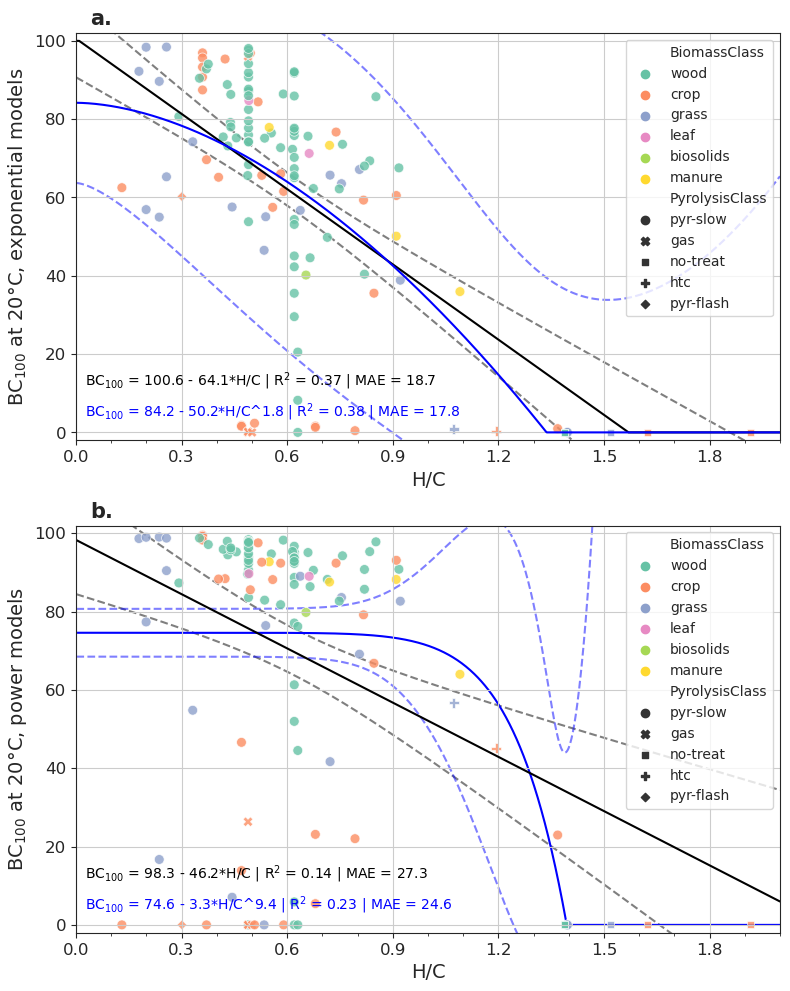

In [272]:
# PLOTING
%matplotlib inline
trendline=True
confidence=True
CF = 95
with sns.axes_style("ticks"):

    f, a = plt.subplots(nrows=2, ncols=1, figsize=figsize)
    i = 0
    # scatter data
    make_corr_scatter(df1_to_plot, y=yy, x=xx, an=False, fig=f, ax=a[i], saveFig=False, s=50) # an = list(df1_to_plot.index)
    # scatter outlier data
    make_corr_scatter(df1_outliers, y=yy, x=xx, c=None, an=False, fig=f, ax=a[i], saveFig=False, zorder=-10, s=20)
    
    # lin reg on data
    if trendline:
        
        # LINEAR, EXP
        ccc = 'black'
        a[i].plot(xxx, r_exp_LIN, ls='solid', color=ccc)
        lbl = "{} = {:.2f} x {} + {:.2f} | R2 = {:.2f}".format(yy, p_opt1[0], xx , p_opt1[1], eRl)
        print("Linear regression, exp, subset: "+lbl)
        
        txt = r"BC$_{100}$ = "+"{:.1f} - {:.1f}*H/C | R$^2$ = {:.2f} | MAE = {:.1f}".format(p_opt1[1], -1*p_opt1[0], eRl, eMl)
        a[i].annotate(txt, xy=(.025, 12), xycoords="data", fontsize=10, color=ccc)
        
        #txt= r"-- r$^{2}$"+" = {:.2f}".format(eRl)
        #a[i].annotate(txt, xy=(1.2, 90), xycoords="data", fontsize=12, color=ccc)
 
        if confidence:
            a[i].plot(xxx, linear(xxx, *p_opt1) + CF_lvl(CF)* np.array([std_linear(xx, p_opt1, p_cov1) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)
            a[i].plot(xxx, linear(xxx, *p_opt1) - CF_lvl(CF)* np.array([std_linear(xx, p_opt1, p_cov1) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)

        # LINEAR CLIP, EXP
        #ccc = 'orange'
        #ynew = linear_clip(xxx, *popt1_linclim)
        #a[i].plot(xxx, ynew, ls='dashed', color=ccc)
        #lbl = "{} = {:.2f} x {} + {:.2f} | R2 = {:.2f}".format(yy, popt1_linclim[0], xx , popt1_linclim[1], eRlc)
        #print("Clipped linear regression, exp, subset: "+lbl)

        #txt= r"r$^{2}$"+" = {:.2f}".format(eRlc)
        #a[i].annotate(txt, xy=(1.2, 10), xycoords="data", fontsize=12, color=ccc)

        # POWER CLIP, EXP
        ccc = 'blue'
        ynew = power_clip(xxx, *popt1_powclim)
        a[i].plot(xxx, ynew, ls='solid', color=ccc)
        lbl = "{} = {:.2f} - {:.2f} * {} ^ ({:.2f}) | R2 = {:.2f}".format(yy, popt1_powclim[0], popt1_powclim[1], xx , popt1_powclim[2], eRpc)
        print("Clipped power regression, exp, subset: "+lbl)
        
        txt = r"BC$_{100}$ = "+"{:.1f} - {:.1f}*H/C^{:.1f} | R$^2$ = {:.2f} | MAE = {:.1f}".format(popt1_powclim[0], popt1_powclim[1], popt1_powclim[2], eRpc, eMpc)
        a[i].annotate(txt, xy=(.025, 4), xycoords="data", fontsize=10, color=ccc)
        
        #txt= r"-- r$^{2}$"+" = {:.2f}".format(eRpc)
        #a[i].annotate(txt, xy=(1.2, 70), xycoords="data", fontsize=12, color=ccc)

        if confidence:
            a[i].plot(xxx, power_func(xxx, *popt1_powclim) + CF_lvl(95)* np.array([std_power_clip(xx, popt1_powclim, pcov1_powclip) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)
            a[i].plot(xxx, power_func(xxx, *popt1_powclim) - CF_lvl(95)* np.array([std_power_clip(xx, popt1_powclim, pcov1_powclip) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)

        # Adding RF model:
        #a[i].plot(fit_exp['BC_TS_20_TH_100'].index, fit_exp['BC_TS_20_TH_100'].values, color="red", ls='dotted')
        
    a[i].set_xlabel('H/C')
    a[i].set_ylabel(r'BC$_{100}$ at 20°C, exponential models')
    a[i].set_xlim(x_lim)
    
    
    i=1
    # scatter data
    make_corr_scatter(df2_to_plot, y=yy, x=xx, an=False, fig=f, ax=a[i], saveFig=False, s=50) # an = list(df2_to_plot.index)
    # scatter outlier data
    make_corr_scatter(df2_outliers, y=yy, x=xx, c=None, an=False, fig=f, ax=a[i], saveFig=False, zorder=-10, s=20)
    # lin reg on data
    if trendline:
        print("\n")
        
        # LINEAR, POW
        ccc = 'black'
        a[i].plot(xxx, r_pow_LIN, ls='solid', color=ccc)
        lbl = "{} = {:.2f} x {} + {:.2f} | R2 = {:.2f}".format(yy, p_opt2[0], xx , p_opt2[1], pRl)
        print("Linear regression, pow, subset: "+lbl)
        
        txt = r"BC$_{100}$ = "+"{:.1f} - {:.1f}*H/C | R$^2$ = {:.2f} | MAE = {:.1f}".format(p_opt2[1], -1*p_opt2[0], pRl, pMl)
        a[i].annotate(txt, xy=(.025, 12), xycoords="data", fontsize=10, color=ccc)
        
        #txt= r"-- r$^{2}$"+" = {:.2f}".format(pRl)
        #a[i].annotate(txt, xy=(1.2, 90), xycoords="data", fontsize=12, color=ccc)

        if confidence:
            a[i].plot(xxx, linear(xxx, *p_opt2) + CF_lvl(CF)* np.array([std_linear(xx, p_opt2, p_cov2) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)
            a[i].plot(xxx, linear(xxx, *p_opt2) - CF_lvl(CF)* np.array([std_linear(xx, p_opt2, p_cov2) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)

    
        # LINEAR CLIP, POW
        #ccc = 'orange'
        #ynew = linear_clip(xxx, *popt2_linclim)
        #a[i].plot(xxx, ynew, ls='dashed', color=ccc)
        #lbl = "{} = {:.2f} x {} + {:.2f} | R2 = {:.2f}".format(yy, popt2_linclim[0], xx , popt2_linclim[1], pRlc)
        #print("Clipped linear regression, pow, subset: "+lbl)

        #txt= r"r$^{2}$"+" = {:.2f}".format(pRlc)
        #a[i].annotate(txt, xy=(1.2, 10), xycoords="data", fontsize=12, color=ccc)

        # POWER CLIP, POW
        ccc = 'blue'
        ynew = power_clip(xxx, *popt2_powclim)
        a[i].plot(xxx, ynew, ls='solid', color=ccc, zorder=-100)
        lbl = "{} = {:.1f} - {:.2f} * {} ^ ({:.2f}) | R2 = {:.2f}".format(yy, popt2_powclim[0], popt2_powclim[1], xx , popt2_powclim[2], pRpc)
        print("Clipped power regression, pow, subset: "+lbl)

        txt = r"BC$_{100}$ = "+"{:.1f} - {:.1f}*H/C^{:.1f} | R$^2$ = {:.2f} | MAE = {:.1f}".format(popt2_powclim[0], popt2_powclim[1], popt2_powclim[2], pRpc, pMpc)
        a[i].annotate(txt, xy=(.025, 4), xycoords="data", fontsize=10, color=ccc)
        
        #txt= r"-- r$^{2}$"+" = {:.2f}".format(pRpc)
        #a[i].annotate(txt, xy=(1.2, 70), xycoords="data", fontsize=12, color=ccc)

        if confidence:
            a[i].plot(xxx, power_func(xxx, *popt2_powclim) + CF_lvl(95)* np.array([std_power_clip(xx, popt2_powclim, pcov2_powclip) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)
            a[i].plot(xxx, power_func(xxx, *popt2_powclim) - CF_lvl(95)* np.array([std_power_clip(xx, popt2_powclim, pcov2_powclip) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)

        # Adding RF model:
        #a[i].plot(fit_pow['BC_TS_20_TH_100'].index, fit_pow['BC_TS_20_TH_100'].values, color="red", ls='dotted')
        
    a[i].set_xlabel('H/C')
    a[i].set_ylabel(r'BC$_{100}$ at 20°C, power models')
    for i in [0,1]:
        a[i].text(0.02, 1.02, string.ascii_lowercase[i]+r'.', transform=a[i].transAxes, size=15, weight='bold')
        a[i].set_ylim([-2, 102])
        a[i].set_xlim(x_lim)
        a[i].xaxis.set_major_locator(MultipleLocator(0.3))
        a[i].xaxis.set_major_formatter('{x:.1f}')
        a[i].xaxis.set_minor_locator(MultipleLocator(0.1))
        a[i].grid(axis='both')

    f.tight_layout()
    
    #f.savefig('../simulations/manuscript/Figure9_BC_TH100_TS_20_ExpPower_withRegressions_withHerathVentura.png', dpi=600)
    #f.savefig('../simulations/manuscript/Figure9_BC_TH100_TS_20_ExpPower_withRegressions_exclHerathVentura.png', dpi=600)

#### Fig. Scatter + Regression - Excl singular + Outliers

With regression curves/lines:

In [38]:
## DATA
toDrop = sAllCriteria.union(set(UnexplainedOutliers)) # Excluding Herath/Ventura remaining
df1 = mS2_kExp
df2 = mS3_kExp
figsize = (8,10)
xx='H/C_all'
yy='BC_TH_100_TS_20'#'aBC_100'
x_lim = [0, 2]
trendline = True
trenderror = False

df1_to_plot = df1.drop(toDrop, errors='ignore')
df1_outliers = df1[df1.index.isin(toDrop)] 
df2_to_plot = df2.drop(toDrop, errors='ignore')
df2_outliers = df2[df2.index.isin(toDrop)] 

if len(toDrop)>0:
    print('Excluding {} observations.'.format(len(toDrop)))
    print('Remaining {} observations.'.format(len(df1_to_plot)))


Excluding 52 observations.
Remaining 82 observations.


In [39]:
## REGRESSIONS (without singular observations)
# 1 >> exp
# 2 >> pow

# taking care of potential NaNs in xx [e.g. Kuzyakov]
xxx = np.linspace(x_lim[0]+0.001, x_lim[1], 1000) # range of H/C
vXnan1 = list(df1_to_plot[df1_to_plot[xx].isna()].index)
vXnan2 = list(df2_to_plot[df2_to_plot[xx].isna()].index)
vX1 = df1_to_plot.drop(vXnan1, axis=0) # exp
vX2 = df2_to_plot.drop(vXnan2, axis=0) # pow
print('Nb of observations left, after removing NaNs: {} (exponential), {} (power)'.format(len(vX1), len(vX2)))

# select an error function for curve_fit
err_func = mean_absolute_error #mean_squared_error # explained_variance_score  

# LINEAR, EXP
p_opt1, p_cov1 = curve_fit(f=linear, xdata=vX1[xx], ydata=vX1[yy], p0=None, method='trf', sigma=None, absolute_sigma=False)
r2_1, _ =  bs.rsquare(linear, vX1[xx], vX1[yy], p_opt1) # R2
eVar1 = err_func(vX1[yy], linear(vX1[xx], *p_opt1))

r_exp_LIN = linear(xxx, *p_opt1)
r_exp_LIN[r_exp_LIN < 0 ]=0
r_exp_LIN[r_exp_LIN > 100 ]=100
r_exp_LIN 

# LINEAR, POW
p_opt2, p_cov2 = curve_fit(f=linear, xdata=vX2[xx], ydata=vX2[yy], p0=None, method='trf', sigma=None, absolute_sigma=False)
r2_2, _ =  bs.rsquare(linear, vX2[xx], vX2[yy], p_opt2) # R2
eVar2 = err_func(vX2[yy], linear(vX2[xx], *p_opt2))

r_pow_LIN = linear(xxx, *p_opt2)
r_pow_LIN[r_pow_LIN < 0 ]=0
r_pow_LIN[r_pow_LIN > 100 ]=100

# LINEAR CLIP, EXP + POW
popt1_linclim, pcov1_linclip = curve_fit(linear_clip, vX1[xx], vX1[yy], p0=None)
popt2_linclim, pcov2_linclip = curve_fit(linear_clip, vX2[xx], vX2[yy], p0=None)


# SIGMOID, EXP
ps_opt1, ps_cov1 = curve_fit(f=parametric_sigmoid, xdata=vX1[xx], ydata=vX1[yy], 
                             p0= [90, 0, 9, 0.8],
                             method='trf', sigma=None, absolute_sigma=False)
r2s_1, _ =  bs.rsquare(parametric_sigmoid, vX1[xx], vX1[yy], ps_opt1) # R2
eVars1 = err_func(vX1[yy], parametric_sigmoid(vX1[xx], *ps_opt1)) # mean_absolute error

r_exp_SIG = parametric_sigmoid(xxx, *ps_opt1)

ps_opt1, ps_cov1 = curve_fit(f=parametric_sigmoid_toZero, xdata=vX1[xx], ydata=vX1[yy], 
                             p0= [90, 9, 0.8],
                             method='trf', sigma=None, absolute_sigma=False)
r2s_1, _ =  bs.rsquare(parametric_sigmoid_toZero, vX1[xx], vX1[yy], ps_opt1) # R2
eVars1 = err_func(vX1[yy], parametric_sigmoid_toZero(vX1[xx], *ps_opt1)) # mean_absolute error

r_exp_SIG0 = parametric_sigmoid_toZero(xxx, *ps_opt1)

# SIGMOID, POW
p_opt2_sig, p_cov2_sig = curve_fit(f=parametric_sigmoid, xdata=vX2[xx], ydata=vX2[yy], 
                             p0= [90, 0, 9, 0.8],
                             method='trf', sigma=None, absolute_sigma=False)
r2_2_sig, _ =  bs.rsquare(parametric_sigmoid, vX2[xx], vX2[yy], p_opt2_sig) # R2

r_pow_SIG = parametric_sigmoid(xxx, *p_opt2_sig)

p_opt2_sig0, p_cov2_sig0 = curve_fit(f=parametric_sigmoid_toZero, xdata=vX2[xx], ydata=vX2[yy], 
                             p0= [90, 9, 0.8],
                             method='trf', sigma=None, absolute_sigma=False)
r2_2_sig0, _ =  bs.rsquare(parametric_sigmoid_toZero, vX2[xx], vX2[yy], p_opt2_sig0) # R2
r_pow_SIG0 = parametric_sigmoid_toZero(xxx, *p_opt2_sig0)


# POWER, EXP
p_opt1_pow, p_cov1_pow = curve_fit(f=power_func, xdata=vX1[xx], ydata=vX1[yy], 
                             p0=None, bounds=(0, np.Inf), # force shape of power function with bounds
                             method='trf', sigma=None, absolute_sigma=False)
r2_1_pow, _ =  bs.rsquare(power_func, vX1[xx], vX1[yy], p_opt1_pow) # R2
eVar1_pow = err_func(vX1[yy], power_func(vX1[xx], *p_opt1_pow)) # mean_absolute error

r_exp_POW = power_func(xxx, *p_opt1_pow)
r_exp_POW = apply_cap(r_exp_POW)

# POWER CLIP, EXP + POW
popt1_powclim, pcov1_powclip = curve_fit(power_clip, vX1[xx], vX1[yy], p0=None)
popt2_powclim, pcov2_powclip = curve_fit(power_clip, vX2[xx], vX2[yy], p0=[90.0, 20., 5.0])

# POWER, POW
p_opt2_pow, p_cov2_pow = curve_fit(f=power_func, xdata=vX2[xx], ydata=vX2[yy], 
                             p0=None, bounds=(0, np.Inf), # force shape of power function with bounds
                             method='trf', sigma=None, absolute_sigma=False)
r2_2_pow, _ =  bs.rsquare(power_func, vX2[xx], vX2[yy], p_opt2_pow) # R2
eVar2_pow = err_func(vX2[yy], power_func(vX2[xx], *p_opt2_pow)) # mean_absolute error

r_pow_POW = power_func(xxx, *p_opt2_pow)
r_pow_POW = apply_cap(r_pow_POW)

# REG ON DATA SPLIT: H/C below 1.0
split = 1.0 
vX1s = vX1[ vX1[xx] < split]
vX2s = vX2[ vX2[xx] < split]

# POWER, EXP, SPLIT
p_opt1_powS, p_cov1_pow = curve_fit(f=power_func, xdata=vX1s[xx], ydata=vX1s[yy], 
                             p0=[90, 45, 6], #bounds=(0, np.Inf), # force shape of power function with bounds
                             method='trf', sigma=None, absolute_sigma=False)
r2_1_pow, _ =  bs.rsquare(power_func, vX1s[xx], vX1s[yy], p_opt1_powS) # R2
eVar1_pow = err_func(vX1s[yy], power_func(vX1s[xx], *p_opt1_powS)) # mean_absolute error

r_exp_POWs = power_func(xxx, *p_opt1_powS)
r_exp_POWs = apply_cap(r_exp_POWs)

# POWER, POW, SPLIT
p_opt2_powS, p_cov2_pow = curve_fit(f=power_func, xdata=vX2s[xx], ydata=vX2s[yy], 
                             p0=None, #bounds=(0, np.Inf), # force shape of power function with bounds
                             method='trf', sigma=None, absolute_sigma=False)
r2_2_powS, _ =  bs.rsquare(power_func, vX2s[xx], vX2s[yy], p_opt2_powS) # R2
eVar2_pow = err_func(vX2s[yy], power_func(vX2s[xx], *p_opt2_powS)) # mean_absolute error

r_pow_POWs = power_func(xxx, *p_opt2_powS)
r_pow_POWs = apply_cap(r_pow_POWs)

Nb of observations left, after removing NaNs: 80 (exponential), 79 (power)


In [40]:
#Evaluate Regressions
eRpc,eMpc = evaluateRegression(power_clip, popt1_powclim, vX1[xx], vX1[yy])
pRpc,pMpc = evaluateRegression(power_clip, popt2_powclim, vX2[xx], vX2[yy])

eRl,eMl = evaluateRegression(linear, p_opt1, vX1[xx], vX1[yy])
pRl,pMl = evaluateRegression(linear, p_opt2, vX2[xx], vX2[yy])

eRlc,_ = evaluateRegression(linear_clip, popt1_linclim, vX1[xx], vX1[yy])
pRlc,_ = evaluateRegression(linear_clip, popt2_linclim, vX2[xx], vX2[yy])

Model:  power_clip
Params:  [93.0089163  49.12107877  1.97891641]
Chisqr:  14224.9105076307 
AIC:  420.45786664779155 
BIC:  427.6039465518132
MAE: 9.771745587372214
R2:  0.7077792339867639
R2 Adjusted Obs:  0.49469074779010547 

Model:  power_clip
Params:  [93.75548255 18.0017584   4.85365316]
Chisqr:  3463.8042810771676 
AIC:  304.67331826724853 
BIC:  311.7816618246496
MAE: 5.115293093973249
R2:  0.9131083923327185
R2 Adjusted Obs:  0.86063389493377 

Model:  linear
Params:  [-75.22677293 118.0751776 ]
Chisqr:  15696.67780088953 
AIC:  426.3342183385704 
BIC:  431.09827160791815
MAE: 10.526840647231424
R2:  0.6775448809763451
R2 Adjusted Obs:  0.6775448809763451 

Model:  linear
Params:  [-69.55665466 130.37946699]
Chisqr:  12025.912505978078 
AIC:  401.00431877237196 
BIC:  405.743214477306
MAE: 9.095468026952487
R2:  0.698322772733122
R2 Adjusted Obs:  0.698322772733122 

Model:  linear_clip
Params:  [-80.43622975 121.91830954]
Chisqr:  15255.707592736875 
AIC:  424.0545876573541 

##### with Random Forest lines

Linear regression, exp, subset: BC_TH_100_TS_20 = -75.23 x H/C_all + 118.08 | R2 = 0.68
Clipped power regression, exp, subset: BC_TH_100_TS_20 = 93.01 - 49.12 * H/C_all ^ (1.98) | R2 = 0.71


Linear regression, pow, subset: BC_TH_100_TS_20 = -69.56 x H/C_all + 130.38 | R2 = 0.70
Clipped power regression, pow, subset: BC_TH_100_TS_20 = 93.8 - 18.00 * H/C_all ^ (4.85) | R2 = 0.91


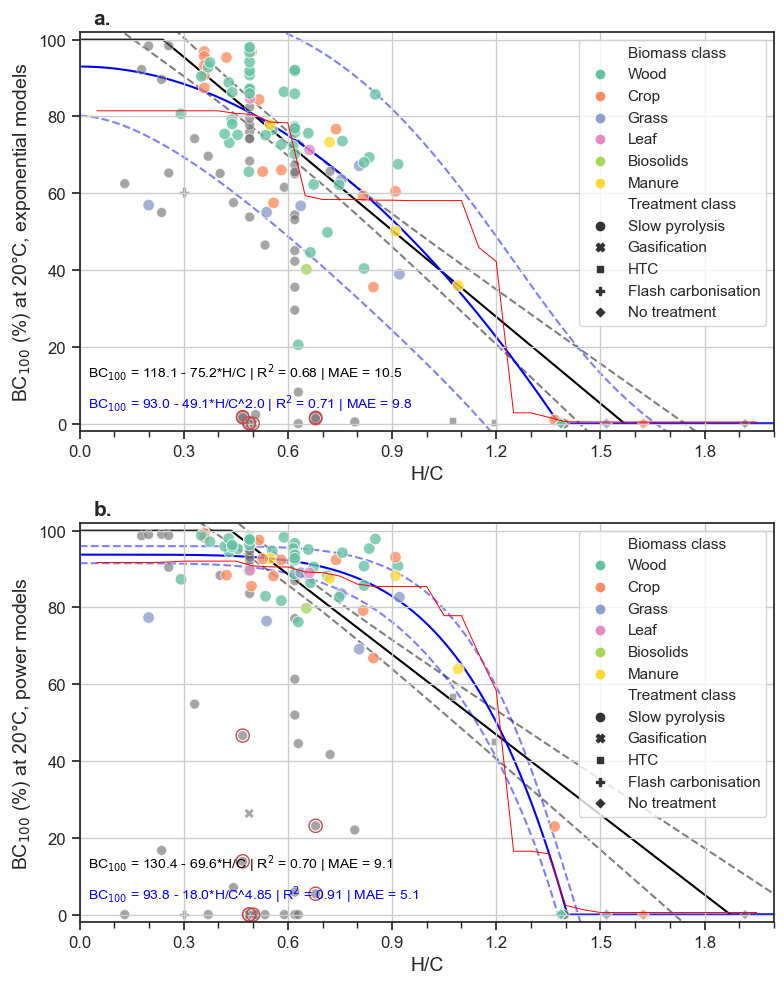

In [265]:
# PLOTING
%matplotlib inline
trendline=True
confidence=True
figsize = (8,10)
CF = 95

dummyClasses = pd.DataFrame(columns=df1.columns)
dummyClasses['PyrolysisClass'] = ['pyr-slow', 'gas', 'htc', 'pyr-flash', 'no-treat']
mappingKeys = {'BiomassClass':'Biomass class','wood':'Wood','crop':'Crop','grass':'Grass','leaf':'Leaf','biosolids':'Biosolids','manure':'Manure',
    'PyrolysisClass':'Treatment class', 'pyr-slow':'Slow pyrolysis', 'gas':'Gasification',
               'htc':'HTC', 'pyr-flash':'Flash carbonisation', 'no-treat': 'No treatment'
              }
with sns.axes_style("ticks"):

    f, a = plt.subplots(nrows=2, ncols=1, figsize=figsize)
    i = 0
    # scatter data
    make_corr_scatter(pd.concat([dummyClasses,df1_to_plot],axis=0), y=yy, x=xx, an=False, fig=f, ax=a[i], saveFig=False, s=70) # an = list(df1_to_plot.index)
    # scatter outlier data
    make_corr_scatter(pd.concat([dummyClasses,df1_outliers],axis=0), y=yy, x=xx, c=None, an=False, fig=f, ax=a[i], saveFig=False, zorder=-10, s=50)
    
    # circle the Unexplained Outliers
    EmphasizeOutliers = df1_outliers[df1_outliers.index.isin(UnexplainedOutliers)]
    a[i].scatter(EmphasizeOutliers[xx], EmphasizeOutliers[yy], s=80, facecolors='none', edgecolors='r')
    
    handles, labels = a[i].get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    for k,v in mappingKeys.items():
        if k in by_label:
            by_label[v] = by_label.pop(k)
        else:
            continue
        
    # lin reg on data
    if trendline:
        
        # LINEAR, EXP
        ccc = 'black'
        a[i].plot(xxx, r_exp_LIN, ls='solid', color=ccc, zorder=-100)
        lbl = "{} = {:.2f} x {} + {:.2f} | R2 = {:.2f}".format(yy, p_opt1[0], xx , p_opt1[1], eRl)
        print("Linear regression, exp, subset: "+lbl)
        
        txt = r"BC$_{100}$ = "+"{:.1f} - {:.1f}*H/C | R$^2$ = {:.2f} | MAE = {:.1f}".format(p_opt1[1], -1*p_opt1[0], eRl, eMl)
        a[i].annotate(txt, xy=(.025, 12), xycoords="data", fontsize=10, color=ccc)
        
        #txt= r"-- r$^{2}$"+" = {:.2f}".format(eRl)
        #a[i].annotate(txt, xy=(1.2, 90), xycoords="data", fontsize=12, color=ccc)
 
        if confidence:
            a[i].plot(xxx, linear(xxx, *p_opt1) + CF_lvl(CF)* np.array([std_linear(xx, p_opt1, p_cov1) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)
            a[i].plot(xxx, linear(xxx, *p_opt1) - CF_lvl(CF)* np.array([std_linear(xx, p_opt1, p_cov1) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)

        # LINEAR CLIP, EXP
        #ccc = 'orange'
        #ynew = linear_clip(xxx, *popt1_linclim)
        #a[i].plot(xxx, ynew, ls='dashed', color=ccc)
        #lbl = "{} = {:.2f} x {} + {:.2f} | R2 = {:.2f}".format(yy, popt1_linclim[0], xx , popt1_linclim[1], eRlc)
        #print("Clipped linear regression, exp, subset: "+lbl)

        #txt= r"r$^{2}$"+" = {:.2f}".format(eRlc)
        #a[i].annotate(txt, xy=(1.2, 10), xycoords="data", fontsize=12, color=ccc)

        # POWER CLIP, EXP
        ccc = 'blue'
        ynew = power_clip(xxx, *popt1_powclim)
        a[i].plot(xxx, ynew, ls='solid', color=ccc, zorder=-100)
        lbl = "{} = {:.2f} - {:.2f} * {} ^ ({:.2f}) | R2 = {:.2f}".format(yy, popt1_powclim[0], popt1_powclim[1], xx , popt1_powclim[2], eRpc)
        print("Clipped power regression, exp, subset: "+lbl)
        
        txt = r"BC$_{100}$ = "+"{:.1f} - {:.1f}*H/C^{:.1f} | R$^2$ = {:.2f} | MAE = {:.1f}".format(popt1_powclim[0], popt1_powclim[1], popt1_powclim[2], eRpc, eMpc)
        a[i].annotate(txt, xy=(.025, 4), xycoords="data", fontsize=10, color=ccc)
        
        #txt= r"-- r$^{2}$"+" = {:.2f}".format(eRpc)
        #a[i].annotate(txt, xy=(1.2, 70), xycoords="data", fontsize=12, color=ccc)

        if confidence:
            a[i].plot(xxx, power_func(xxx, *popt1_powclim) + CF_lvl(95)* np.array([std_power_clip(xx, popt1_powclim, pcov1_powclip) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)
            a[i].plot(xxx, power_func(xxx, *popt1_powclim) - CF_lvl(95)* np.array([std_power_clip(xx, popt1_powclim, pcov1_powclip) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)

        # Adding RF model:
        a[i].plot(fit_exp['BC_TS_20_TH_100'].index, fit_exp['BC_TS_20_TH_100'].values, color="red", ls='solid', lw=0.7)

    a[i].set_xlabel('H/C')
    a[i].set_ylabel(r'BC$_{100}$ (%) at 20°C, exponential models')
    a[i].set_xlim(x_lim)
    
    
    i=1
    # scatter data
    make_corr_scatter(pd.concat([dummyClasses,df2_to_plot],axis=0), y=yy, x=xx, an=False, fig=f, ax=a[i], saveFig=False, s=70) # an = list(df2_to_plot.index)
    # scatter outlier data
    make_corr_scatter(pd.concat([dummyClasses,df2_outliers],axis=0), y=yy, x=xx, c=None, an=False, fig=f, ax=a[i], saveFig=False, zorder=-10, s=50)
    
    # circle the Unexplained Outliers
    EmphasizeOutliers = df2_outliers[df2_outliers.index.isin(UnexplainedOutliers)]
    a[i].scatter(EmphasizeOutliers[xx], EmphasizeOutliers[yy], s=90, facecolors='none', edgecolors='r')

    handles, labels = a[i].get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    for k,v in mappingKeys.items():
        if k in by_label:
            by_label[v] = by_label.pop(k)
        else:
            continue
        
    # lin reg on data
    if trendline:
        print("\n")
        
        # LINEAR, POW
        ccc = 'black'
        a[i].plot(xxx, r_pow_LIN, ls='solid', color=ccc, zorder=-100)
        lbl = "{} = {:.2f} x {} + {:.2f} | R2 = {:.2f}".format(yy, p_opt2[0], xx , p_opt2[1], pRl)
        print("Linear regression, pow, subset: "+lbl)
        
        txt = r"BC$_{100}$ = "+"{:.1f} - {:.1f}*H/C | R$^2$ = {:.2f} | MAE = {:.1f}".format(p_opt2[1], -1*p_opt2[0], pRl, pMl)
        a[i].annotate(txt, xy=(.025, 12), xycoords="data", fontsize=10, color=ccc)
        
        #txt= r"-- r$^{2}$"+" = {:.2f}".format(pRl)
        #a[i].annotate(txt, xy=(1.2, 90), xycoords="data", fontsize=12, color=ccc)

        if confidence:
            a[i].plot(xxx, linear(xxx, *p_opt2) + CF_lvl(CF)* np.array([std_linear(xx, p_opt2, p_cov2) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)
            a[i].plot(xxx, linear(xxx, *p_opt2) - CF_lvl(CF)* np.array([std_linear(xx, p_opt2, p_cov2) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)

    
        # LINEAR CLIP, POW
        #ccc = 'orange'
        #ynew = linear_clip(xxx, *popt2_linclim)
        #a[i].plot(xxx, ynew, ls='dashed', color=ccc)
        #lbl = "{} = {:.2f} x {} + {:.2f} | R2 = {:.2f}".format(yy, popt2_linclim[0], xx , popt2_linclim[1], pRlc)
        #print("Clipped linear regression, pow, subset: "+lbl)

        #txt= r"r$^{2}$"+" = {:.2f}".format(pRlc)
        #a[i].annotate(txt, xy=(1.2, 10), xycoords="data", fontsize=12, color=ccc)

        # POWER CLIP, POW
        ccc = 'blue'
        ynew = power_clip(xxx, *popt2_powclim)
        a[i].plot(xxx, ynew, ls='solid', color=ccc, zorder=-100)
        lbl = "{} = {:.1f} - {:.2f} * {} ^ ({:.2f}) | R2 = {:.2f}".format(yy, popt2_powclim[0], popt2_powclim[1], xx , popt2_powclim[2], pRpc)
        print("Clipped power regression, pow, subset: "+lbl)

        txt = r"BC$_{100}$ = "+"{:.1f} - {:.1f}*H/C^{:.2f} | R$^2$ = {:.2f} | MAE = {:.1f}".format(popt2_powclim[0], popt2_powclim[1], popt2_powclim[2], pRpc, pMpc)
        a[i].annotate(txt, xy=(.025, 4), xycoords="data", fontsize=10, color=ccc)
        
        #txt= r"-- r$^{2}$"+" = {:.2f}".format(pRpc)
        #a[i].annotate(txt, xy=(1.2, 70), xycoords="data", fontsize=12, color=ccc)

        if confidence:
            a[i].plot(xxx, power_func(xxx, *popt2_powclim) + CF_lvl(95)* np.array([std_power_clip(xx, popt2_powclim, pcov2_powclip) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)
            a[i].plot(xxx, power_func(xxx, *popt2_powclim) - CF_lvl(95)* np.array([std_power_clip(xx, popt2_powclim, pcov2_powclip) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)

        # Adding RF model:
        a[i].plot(fit_pow['BC_TS_20_TH_100'].index, fit_pow['BC_TS_20_TH_100'].values, color="red", ls='solid', lw=0.7)
        
    a[i].set_xlabel('H/C')
    a[i].set_ylabel(r'BC$_{100}$ (%) at 20°C, power models')
    for i in [0,1]:
        a[i].text(0.02, 1.02, string.ascii_lowercase[i]+r'.', transform=a[i].transAxes, size=15, weight='bold')
        a[i].set_ylim([-2, 102])
        a[i].set_xlim(x_lim)
        a[i].xaxis.set_major_locator(MultipleLocator(0.3))
        a[i].xaxis.set_major_formatter('{x:.1f}')
        a[i].xaxis.set_minor_locator(MultipleLocator(0.1))
        a[i].grid(axis='both')
        a[i].set_axisbelow(True)
        a[i].legend(by_label.values(), by_label.keys(), loc='upper right')


    f.tight_layout()
    
    #f.savefig('../simulations/manuscript/Figure9_BC_TH100_TS_20_ExpPower_withRegressions_withHerathVentura.png', dpi=600)
    f.savefig('../simulations/manuscript/FigureS21_BC_TH100_TS_20_ExpPower_withRegressions_exclHerathVentura_withRF.png', dpi=600)

##### without Random Forest lines (after review)

Also highlighting the UnexplainedOutliers (Herath, Ventura,)

Linear regression, exp, subset: BC_TH_100_TS_20 = -75.23 x H/C_all + 118.08 | R2 = 0.68
Clipped power regression, exp, subset: BC_TH_100_TS_20 = 93.01 - 49.12 * H/C_all ^ (1.98) | R2 = 0.71


Linear regression, pow, subset: BC_TH_100_TS_20 = -69.56 x H/C_all + 130.38 | R2 = 0.70
Clipped power regression, pow, subset: BC_TH_100_TS_20 = 93.8 - 18.00 * H/C_all ^ (4.85) | R2 = 0.91


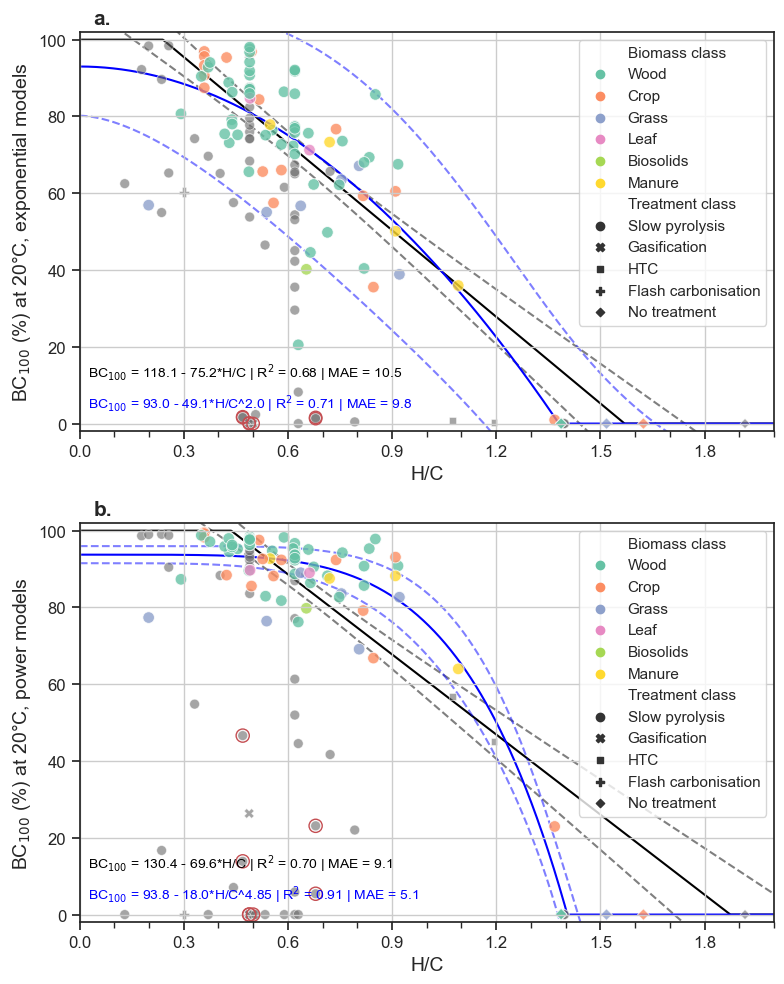

In [263]:
# PLOTING
%matplotlib inline
trendline=True
confidence=True
figsize = (8,10)
CF = 95

dummyClasses = pd.DataFrame(columns=df1.columns)
dummyClasses['PyrolysisClass'] = ['pyr-slow', 'gas', 'htc', 'pyr-flash', 'no-treat']
mappingKeys = {'BiomassClass':'Biomass class','wood':'Wood','crop':'Crop','grass':'Grass','leaf':'Leaf','biosolids':'Biosolids','manure':'Manure',
    'PyrolysisClass':'Treatment class', 'pyr-slow':'Slow pyrolysis', 'gas':'Gasification',
               'htc':'HTC', 'pyr-flash':'Flash carbonisation', 'no-treat': 'No treatment'
              }
with sns.axes_style("ticks"):

    f, a = plt.subplots(nrows=2, ncols=1, figsize=figsize)
    i = 0
    # scatter data
    make_corr_scatter(pd.concat([dummyClasses,df1_to_plot],axis=0), y=yy, x=xx, an=False, fig=f, ax=a[i], saveFig=False, s=70) # an = list(df1_to_plot.index)
    # scatter outlier data
    make_corr_scatter(pd.concat([dummyClasses,df1_outliers],axis=0), y=yy, x=xx, c=None, an=False, fig=f, ax=a[i], saveFig=False, zorder=-10, s=50)
    
    # circle the Unexplained Outliers
    EmphasizeOutliers = df1_outliers[df1_outliers.index.isin(UnexplainedOutliers)]
    a[i].scatter(EmphasizeOutliers[xx], EmphasizeOutliers[yy], s=80, facecolors='none', edgecolors='r')
    
    handles, labels = a[i].get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    for k,v in mappingKeys.items():
        if k in by_label:
            by_label[v] = by_label.pop(k)
        else:
            continue
        
    # lin reg on data
    if trendline:
        
        # LINEAR, EXP
        ccc = 'black'
        a[i].plot(xxx, r_exp_LIN, ls='solid', color=ccc, zorder=-100)
        lbl = "{} = {:.2f} x {} + {:.2f} | R2 = {:.2f}".format(yy, p_opt1[0], xx , p_opt1[1], eRl)
        print("Linear regression, exp, subset: "+lbl)
        
        txt = r"BC$_{100}$ = "+"{:.1f} - {:.1f}*H/C | R$^2$ = {:.2f} | MAE = {:.1f}".format(p_opt1[1], -1*p_opt1[0], eRl, eMl)
        a[i].annotate(txt, xy=(.025, 12), xycoords="data", fontsize=10, color=ccc)
        
        #txt= r"-- r$^{2}$"+" = {:.2f}".format(eRl)
        #a[i].annotate(txt, xy=(1.2, 90), xycoords="data", fontsize=12, color=ccc)
 
        if confidence:
            a[i].plot(xxx, linear(xxx, *p_opt1) + CF_lvl(CF)* np.array([std_linear(xx, p_opt1, p_cov1) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)
            a[i].plot(xxx, linear(xxx, *p_opt1) - CF_lvl(CF)* np.array([std_linear(xx, p_opt1, p_cov1) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)

        # LINEAR CLIP, EXP
        #ccc = 'orange'
        #ynew = linear_clip(xxx, *popt1_linclim)
        #a[i].plot(xxx, ynew, ls='dashed', color=ccc)
        #lbl = "{} = {:.2f} x {} + {:.2f} | R2 = {:.2f}".format(yy, popt1_linclim[0], xx , popt1_linclim[1], eRlc)
        #print("Clipped linear regression, exp, subset: "+lbl)

        #txt= r"r$^{2}$"+" = {:.2f}".format(eRlc)
        #a[i].annotate(txt, xy=(1.2, 10), xycoords="data", fontsize=12, color=ccc)

        # POWER CLIP, EXP
        ccc = 'blue'
        ynew = power_clip(xxx, *popt1_powclim)
        a[i].plot(xxx, ynew, ls='solid', color=ccc, zorder=-100)
        lbl = "{} = {:.2f} - {:.2f} * {} ^ ({:.2f}) | R2 = {:.2f}".format(yy, popt1_powclim[0], popt1_powclim[1], xx , popt1_powclim[2], eRpc)
        print("Clipped power regression, exp, subset: "+lbl)
        
        txt = r"BC$_{100}$ = "+"{:.1f} - {:.1f}*H/C^{:.1f} | R$^2$ = {:.2f} | MAE = {:.1f}".format(popt1_powclim[0], popt1_powclim[1], popt1_powclim[2], eRpc, eMpc)
        a[i].annotate(txt, xy=(.025, 4), xycoords="data", fontsize=10, color=ccc)
        
        #txt= r"-- r$^{2}$"+" = {:.2f}".format(eRpc)
        #a[i].annotate(txt, xy=(1.2, 70), xycoords="data", fontsize=12, color=ccc)

        if confidence:
            a[i].plot(xxx, power_func(xxx, *popt1_powclim) + CF_lvl(95)* np.array([std_power_clip(xx, popt1_powclim, pcov1_powclip) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)
            a[i].plot(xxx, power_func(xxx, *popt1_powclim) - CF_lvl(95)* np.array([std_power_clip(xx, popt1_powclim, pcov1_powclip) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)


    a[i].set_xlabel('H/C')
    a[i].set_ylabel(r'BC$_{100}$ (%) at 20°C, exponential models')
    a[i].set_xlim(x_lim)
    
    
    i=1
    # scatter data
    make_corr_scatter(pd.concat([dummyClasses,df2_to_plot],axis=0), y=yy, x=xx, an=False, fig=f, ax=a[i], saveFig=False, s=70) # an = list(df2_to_plot.index)
    # scatter outlier data
    make_corr_scatter(pd.concat([dummyClasses,df2_outliers],axis=0), y=yy, x=xx, c=None, an=False, fig=f, ax=a[i], saveFig=False, zorder=-10, s=50)
    
    # circle the Unexplained Outliers
    EmphasizeOutliers = df2_outliers[df2_outliers.index.isin(UnexplainedOutliers)]
    a[i].scatter(EmphasizeOutliers[xx], EmphasizeOutliers[yy], s=90, facecolors='none', edgecolors='r')

    handles, labels = a[i].get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    for k,v in mappingKeys.items():
        if k in by_label:
            by_label[v] = by_label.pop(k)
        else:
            continue
        
    # lin reg on data
    if trendline:
        print("\n")
        
        # LINEAR, POW
        ccc = 'black'
        a[i].plot(xxx, r_pow_LIN, ls='solid', color=ccc, zorder=-100)
        lbl = "{} = {:.2f} x {} + {:.2f} | R2 = {:.2f}".format(yy, p_opt2[0], xx , p_opt2[1], pRl)
        print("Linear regression, pow, subset: "+lbl)
        
        txt = r"BC$_{100}$ = "+"{:.1f} - {:.1f}*H/C | R$^2$ = {:.2f} | MAE = {:.1f}".format(p_opt2[1], -1*p_opt2[0], pRl, pMl)
        a[i].annotate(txt, xy=(.025, 12), xycoords="data", fontsize=10, color=ccc)
        
        #txt= r"-- r$^{2}$"+" = {:.2f}".format(pRl)
        #a[i].annotate(txt, xy=(1.2, 90), xycoords="data", fontsize=12, color=ccc)

        if confidence:
            a[i].plot(xxx, linear(xxx, *p_opt2) + CF_lvl(CF)* np.array([std_linear(xx, p_opt2, p_cov2) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)
            a[i].plot(xxx, linear(xxx, *p_opt2) - CF_lvl(CF)* np.array([std_linear(xx, p_opt2, p_cov2) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)

    
        # LINEAR CLIP, POW
        #ccc = 'orange'
        #ynew = linear_clip(xxx, *popt2_linclim)
        #a[i].plot(xxx, ynew, ls='dashed', color=ccc)
        #lbl = "{} = {:.2f} x {} + {:.2f} | R2 = {:.2f}".format(yy, popt2_linclim[0], xx , popt2_linclim[1], pRlc)
        #print("Clipped linear regression, pow, subset: "+lbl)

        #txt= r"r$^{2}$"+" = {:.2f}".format(pRlc)
        #a[i].annotate(txt, xy=(1.2, 10), xycoords="data", fontsize=12, color=ccc)

        # POWER CLIP, POW
        ccc = 'blue'
        ynew = power_clip(xxx, *popt2_powclim)
        a[i].plot(xxx, ynew, ls='solid', color=ccc, zorder=-100)
        lbl = "{} = {:.1f} - {:.2f} * {} ^ ({:.2f}) | R2 = {:.2f}".format(yy, popt2_powclim[0], popt2_powclim[1], xx , popt2_powclim[2], pRpc)
        print("Clipped power regression, pow, subset: "+lbl)

        txt = r"BC$_{100}$ = "+"{:.1f} - {:.1f}*H/C^{:.2f} | R$^2$ = {:.2f} | MAE = {:.1f}".format(popt2_powclim[0], popt2_powclim[1], popt2_powclim[2], pRpc, pMpc)
        a[i].annotate(txt, xy=(.025, 4), xycoords="data", fontsize=10, color=ccc)
        
        #txt= r"-- r$^{2}$"+" = {:.2f}".format(pRpc)
        #a[i].annotate(txt, xy=(1.2, 70), xycoords="data", fontsize=12, color=ccc)

        if confidence:
            a[i].plot(xxx, power_func(xxx, *popt2_powclim) + CF_lvl(95)* np.array([std_power_clip(xx, popt2_powclim, pcov2_powclip) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)
            a[i].plot(xxx, power_func(xxx, *popt2_powclim) - CF_lvl(95)* np.array([std_power_clip(xx, popt2_powclim, pcov2_powclip) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)

    a[i].set_xlabel('H/C')
    a[i].set_ylabel(r'BC$_{100}$ (%) at 20°C, power models')
    for i in [0,1]:
        a[i].text(0.02, 1.02, string.ascii_lowercase[i]+r'.', transform=a[i].transAxes, size=15, weight='bold')
        a[i].set_ylim([-2, 102])
        a[i].set_xlim(x_lim)
        a[i].xaxis.set_major_locator(MultipleLocator(0.3))
        a[i].xaxis.set_major_formatter('{x:.1f}')
        a[i].xaxis.set_minor_locator(MultipleLocator(0.1))
        a[i].grid(axis='both')
        a[i].set_axisbelow(True)
        a[i].legend(by_label.values(), by_label.keys(), loc='upper right')


    f.tight_layout()
    
    #f.savefig('../simulations/manuscript/Figure9_BC_TH100_TS_20_ExpPower_withRegressions_withHerathVentura.png', dpi=600)
    f.savefig('../simulations/manuscript/Figure7_BC_TH100_TS_20_ExpPower_withRegressions.png', dpi=600)

##### Figures for public report

Clipped power regression, exp, subset: BC_TH_100_TS_20 = 93.01 - 49.12 * H/C_all ^ (1.98) | R2 = 0.71


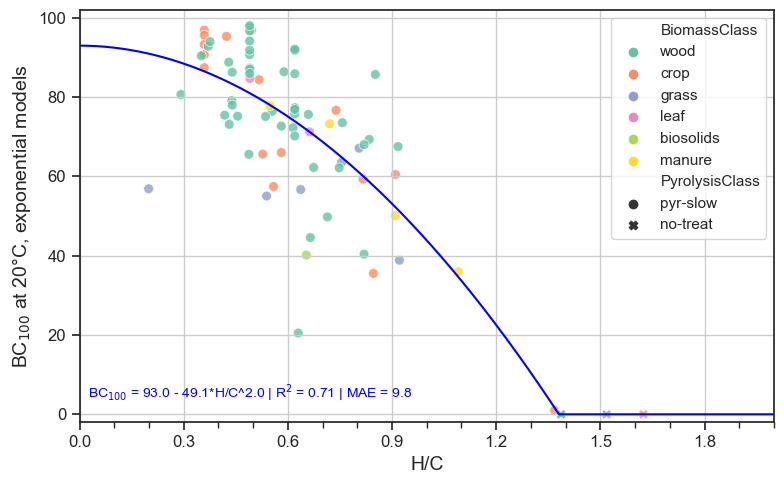

In [880]:
# PLOTING
%matplotlib inline
trendline=True
confidence=False
figsize = (8,5)
CF = 95
with sns.axes_style("ticks"):

    f, a = plt.subplots(nrows=1, ncols=1, figsize=figsize)
    i = 0
    # scatter data
    make_corr_scatter(df1_to_plot, y=yy, x=xx, an=False, fig=f, ax=a, saveFig=False, s=50) # an = list(df1_to_plot.index)
    # scatter outlier data
    #make_corr_scatter(df1_outliers, y=yy, x=xx, c=None, an=False, fig=f, ax=a, saveFig=False, zorder=-10, s=20)
    
    # lin reg on data
    if trendline:
        
        # LINEAR, EXP
        #ccc = 'black'
        #a[i].plot(xxx, r_exp_LIN, ls='solid', color=ccc)
        #lbl = "{} = {:.2f} x {} + {:.2f} | R2 = {:.2f}".format(yy, p_opt1[0], xx , p_opt1[1], eRl)
        #print("Linear regression, exp, subset: "+lbl)
        
        #txt = r"BC$_{100}$ = "+"{:.1f} - {:.1f}*H/C | R$^2$ = {:.2f} | MAE = {:.1f}".format(p_opt1[1], -1*p_opt1[0], eRl, eMl)
        #a[i].annotate(txt, xy=(.025, 12), xycoords="data", fontsize=10, color=ccc)
        
        #txt= r"-- r$^{2}$"+" = {:.2f}".format(eRl)
        #a[i].annotate(txt, xy=(1.2, 90), xycoords="data", fontsize=12, color=ccc)
 
        if confidence:
            a.plot(xxx, linear(xxx, *p_opt1) + CF_lvl(CF)* np.array([std_linear(xx, p_opt1, p_cov1) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)
            a.plot(xxx, linear(xxx, *p_opt1) - CF_lvl(CF)* np.array([std_linear(xx, p_opt1, p_cov1) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)

        # LINEAR CLIP, EXP
        #ccc = 'orange'
        #ynew = linear_clip(xxx, *popt1_linclim)
        #a[i].plot(xxx, ynew, ls='dashed', color=ccc)
        #lbl = "{} = {:.2f} x {} + {:.2f} | R2 = {:.2f}".format(yy, popt1_linclim[0], xx , popt1_linclim[1], eRlc)
        #print("Clipped linear regression, exp, subset: "+lbl)

        #txt= r"r$^{2}$"+" = {:.2f}".format(eRlc)
        #a[i].annotate(txt, xy=(1.2, 10), xycoords="data", fontsize=12, color=ccc)

        # POWER CLIP, EXP
        ccc = 'blue'
        ynew = power_clip(xxx, *popt1_powclim)
        a.plot(xxx, ynew, ls='solid', color=ccc)
        lbl = "{} = {:.2f} - {:.2f} * {} ^ ({:.2f}) | R2 = {:.2f}".format(yy, popt1_powclim[0], popt1_powclim[1], xx , popt1_powclim[2], eRpc)
        print("Clipped power regression, exp, subset: "+lbl)
        
        txt = r"BC$_{100}$ = "+"{:.1f} - {:.1f}*H/C^{:.1f} | R$^2$ = {:.2f} | MAE = {:.1f}".format(popt1_powclim[0], popt1_powclim[1], popt1_powclim[2], eRpc, eMpc)
        a.annotate(txt, xy=(.025, 4), xycoords="data", fontsize=10, color=ccc)
        
        #txt= r"-- r$^{2}$"+" = {:.2f}".format(eRpc)
        #a[i].annotate(txt, xy=(1.2, 70), xycoords="data", fontsize=12, color=ccc)

        if confidence:
            a.plot(xxx, power_func(xxx, *popt1_powclim) + CF_lvl(95)* np.array([std_power_clip(xx, popt1_powclim, pcov1_powclip) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)
            a.plot(xxx, power_func(xxx, *popt1_powclim) - CF_lvl(95)* np.array([std_power_clip(xx, popt1_powclim, pcov1_powclip) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)

        # Adding RF model:
        #a[i].plot(fit_exp['BC_TS_20_TH_100'].index, fit_exp['BC_TS_20_TH_100'].values, color="red", ls='solid', lw=0.7)
        
    a.set_xlabel('H/C')
    a.set_ylabel(r'BC$_{100}$ at '++'°C, exponential models')
    a.set_xlim(x_lim)

    for i in [0]:
        #a.text(0.02, 1.02, string.ascii_lowercase[i]+r'.', transform=a.transAxes, size=15, weight='bold')
        a.set_ylim([-2, 102])
        a.set_xlim(x_lim)
        a.xaxis.set_major_locator(MultipleLocator(0.3))
        a.xaxis.set_major_formatter('{x:.1f}')
        a.xaxis.set_minor_locator(MultipleLocator(0.1))
        a.grid(axis='both')   
  
    f.tight_layout()
    
    #f.savefig('../simulations/manuscript/Figure9_BC_TH100_TS_20_ExpPower_withRegressions_withHerathVentura.png', dpi=600)
    #f.savefig('../simulations/manuscript/Figure9_BC_TH100_TS_20_ExpPower_withRegressions_exclHerathVentura.png', dpi=600)

#### Fig. Scatter + Regression, Excl Singular only

In [74]:
## DATA
toDrop = sAllCriteria#.union(set(UnexplainedOutliers)) # Not excluding outliers
df1 = mS2_kExp
df2 = mS3_kExp
figsize = (8,10)
xx='H/C_all'
yy='BC_TH_100_TS_20'#'aBC_100'
x_lim = [0, 2]
trendline = True
trenderror = False

df1_to_plot = df1.drop(toDrop, errors='ignore')
df1_outliers = df1[df1.index.isin(toDrop)] 
df2_to_plot = df2.drop(toDrop, errors='ignore')
df2_outliers = df2[df2.index.isin(toDrop)] 

if len(toDrop)>0:
    print('Excluding {} observations.'.format(len(toDrop)))
    print('Remaining {} observations.'.format(len(df1_to_plot)))


Excluding 48 observations.
Remaining 86 observations.


In [75]:
## REGRESSIONS (without singular observations)
# 1 >> exp
# 2 >> pow

# taking care of potential NaNs in xx [e.g. Kuzyakov]
xxx = np.linspace(x_lim[0]+0.001, x_lim[1], 1000) # range of H/C
vXnan1 = list(df1_to_plot[df1_to_plot[xx].isna()].index)
vXnan2 = list(df2_to_plot[df2_to_plot[xx].isna()].index)
vX1 = df1_to_plot.drop(vXnan1, axis=0) # exp
vX2 = df2_to_plot.drop(vXnan2, axis=0) # pow
print('Nb of observations left, after removing NaNs: {} (exponential), {} (power)'.format(len(vX1), len(vX2)))

# select an error function for curve_fit
err_func = mean_absolute_error #mean_squared_error # explained_variance_score  

# LINEAR, EXP
p_opt1, p_cov1 = curve_fit(f=linear, xdata=vX1[xx], ydata=vX1[yy], p0=None, method='trf', sigma=None, absolute_sigma=False)
r2_1, _ =  bs.rsquare(linear, vX1[xx], vX1[yy], p_opt1) # R2
eVar1 = err_func(vX1[yy], linear(vX1[xx], *p_opt1))

r_exp_LIN = linear(xxx, *p_opt1)
r_exp_LIN[r_exp_LIN < 0 ]=0
r_exp_LIN[r_exp_LIN > 100 ]=100
r_exp_LIN 

# LINEAR, POW
p_opt2, p_cov2 = curve_fit(f=linear, xdata=vX2[xx], ydata=vX2[yy], p0=None, method='trf', sigma=None, absolute_sigma=False)
r2_2, _ =  bs.rsquare(linear, vX2[xx], vX2[yy], p_opt2) # R2
eVar2 = err_func(vX2[yy], linear(vX2[xx], *p_opt2))

r_pow_LIN = linear(xxx, *p_opt2)
r_pow_LIN[r_pow_LIN < 0 ]=0
r_pow_LIN[r_pow_LIN > 100 ]=100

# LINEAR CLIP, EXP + POW
popt1_linclim, pcov1_linclip = curve_fit(linear_clip, vX1[xx], vX1[yy], p0=None)
popt2_linclim, pcov2_linclip = curve_fit(linear_clip, vX2[xx], vX2[yy], p0=None)


# SIGMOID, EXP
ps_opt1, ps_cov1 = curve_fit(f=parametric_sigmoid, xdata=vX1[xx], ydata=vX1[yy], 
                             p0= [90, 0, 9, 0.8],
                             method='trf', sigma=None, absolute_sigma=False)
r2s_1, _ =  bs.rsquare(parametric_sigmoid, vX1[xx], vX1[yy], ps_opt1) # R2
eVars1 = err_func(vX1[yy], parametric_sigmoid(vX1[xx], *ps_opt1)) # mean_absolute error

r_exp_SIG = parametric_sigmoid(xxx, *ps_opt1)

ps_opt1, ps_cov1 = curve_fit(f=parametric_sigmoid_toZero, xdata=vX1[xx], ydata=vX1[yy], 
                             p0= [90, 9, 0.8],
                             method='trf', sigma=None, absolute_sigma=False)
r2s_1, _ =  bs.rsquare(parametric_sigmoid_toZero, vX1[xx], vX1[yy], ps_opt1) # R2
eVars1 = err_func(vX1[yy], parametric_sigmoid_toZero(vX1[xx], *ps_opt1)) # mean_absolute error

r_exp_SIG0 = parametric_sigmoid_toZero(xxx, *ps_opt1)

# SIGMOID, POW
p_opt2_sig, p_cov2_sig = curve_fit(f=parametric_sigmoid, xdata=vX2[xx], ydata=vX2[yy], 
                             p0= [90, 0, 9, 0.8],
                             method='trf', sigma=None, absolute_sigma=False)
r2_2_sig, _ =  bs.rsquare(parametric_sigmoid, vX2[xx], vX2[yy], p_opt2_sig) # R2

r_pow_SIG = parametric_sigmoid(xxx, *p_opt2_sig)

p_opt2_sig0, p_cov2_sig0 = curve_fit(f=parametric_sigmoid_toZero, xdata=vX2[xx], ydata=vX2[yy], 
                             p0= [90, 9, 0.8],
                             method='trf', sigma=None, absolute_sigma=False)
r2_2_sig0, _ =  bs.rsquare(parametric_sigmoid_toZero, vX2[xx], vX2[yy], p_opt2_sig0) # R2
r_pow_SIG0 = parametric_sigmoid_toZero(xxx, *p_opt2_sig0)


# POWER, EXP
p_opt1_pow, p_cov1_pow = curve_fit(f=power_func, xdata=vX1[xx], ydata=vX1[yy], 
                             p0=None, bounds=(0, np.Inf), # force shape of power function with bounds
                             method='trf', sigma=None, absolute_sigma=False)
r2_1_pow, _ =  bs.rsquare(power_func, vX1[xx], vX1[yy], p_opt1_pow) # R2
eVar1_pow = err_func(vX1[yy], power_func(vX1[xx], *p_opt1_pow)) # mean_absolute error

r_exp_POW = power_func(xxx, *p_opt1_pow)
r_exp_POW = apply_cap(r_exp_POW)

# POWER CLIP, EXP + POW
popt1_powclim, pcov1_powclip = curve_fit(power_clip, vX1[xx], vX1[yy], p0=None)
popt2_powclim, pcov2_powclip = curve_fit(power_clip, vX2[xx], vX2[yy], p0=[90.0, 20., 5.0])

# POWER, POW
p_opt2_pow, p_cov2_pow = curve_fit(f=power_func, xdata=vX2[xx], ydata=vX2[yy], 
                             p0=None, bounds=(0, np.Inf), # force shape of power function with bounds
                             method='trf', sigma=None, absolute_sigma=False)
r2_2_pow, _ =  bs.rsquare(power_func, vX2[xx], vX2[yy], p_opt2_pow) # R2
eVar2_pow = err_func(vX2[yy], power_func(vX2[xx], *p_opt2_pow)) # mean_absolute error

r_pow_POW = power_func(xxx, *p_opt2_pow)
r_pow_POW = apply_cap(r_pow_POW)

# REG ON DATA SPLIT: H/C below 1.0
split = 1.0 
vX1s = vX1[ vX1[xx] < split]
vX2s = vX2[ vX2[xx] < split]

# POWER, EXP, SPLIT
p_opt1_powS, p_cov1_pow = curve_fit(f=power_func, xdata=vX1s[xx], ydata=vX1s[yy], 
                             p0=[90, 45, 6], #bounds=(0, np.Inf), # force shape of power function with bounds
                             method='trf', sigma=None, absolute_sigma=False)
r2_1_pow, _ =  bs.rsquare(power_func, vX1s[xx], vX1s[yy], p_opt1_powS) # R2
eVar1_pow = err_func(vX1s[yy], power_func(vX1s[xx], *p_opt1_powS)) # mean_absolute error

r_exp_POWs = power_func(xxx, *p_opt1_powS)
r_exp_POWs = apply_cap(r_exp_POWs)

# POWER, POW, SPLIT
p_opt2_powS, p_cov2_pow = curve_fit(f=power_func, xdata=vX2s[xx], ydata=vX2s[yy], 
                             p0=None, #bounds=(0, np.Inf), # force shape of power function with bounds
                             method='trf', sigma=None, absolute_sigma=False)
r2_2_powS, _ =  bs.rsquare(power_func, vX2s[xx], vX2s[yy], p_opt2_powS) # R2
eVar2_pow = err_func(vX2s[yy], power_func(vX2s[xx], *p_opt2_powS)) # mean_absolute error

r_pow_POWs = power_func(xxx, *p_opt2_powS)
r_pow_POWs = apply_cap(r_pow_POWs)

Nb of observations left, after removing NaNs: 84 (exponential), 83 (power)


In [76]:
eRpc,eMpc = evaluateRegression(power_clip, popt1_powclim, vX1[xx], vX1[yy])
pRpc,pMpc = evaluateRegression(power_clip, popt2_powclim, vX2[xx], vX2[yy])

eRl,eMl = evaluateRegression(linear, p_opt1, vX1[xx], vX1[yy])
pRl,pMl = evaluateRegression(linear, p_opt2, vX2[xx], vX2[yy])

eRlc,_ = evaluateRegression(linear_clip, popt1_linclim, vX1[xx], vX1[yy])
pRlc,_ = evaluateRegression(linear_clip, popt2_linclim, vX2[xx], vX2[yy])

Model:  power_clip
Params:  [86.37770865 43.42201032  2.05512053]
Chisqr:  37131.991336347055 
AIC:  517.6790597819113 
BIC:  524.9715101784411
MAE: 13.878258338706448
R2:  0.4442283782059716
R2 Adjusted Obs:  0.3569198098412909 

Model:  power_clip
Params:  [87.39453515  8.20717535  7.0660877 ]
Chisqr:  32543.578147729968 
AIC:  501.6340624611081 
BIC:  508.8905842844979
MAE: 10.728124658460533
R2:  0.49769178560712957
R2 Adjusted Obs:  0.3635093832708517 

Model:  linear
Params:  [-69.36475427 110.66799726]
Chisqr:  38407.30268117187 
AIC:  518.5156320338083 
BIC:  523.3772656314949
MAE: 14.76452710752288
R2:  0.4251402057461281
R2 Adjusted Obs:  0.4251402057461281 

Model:  linear
Params:  [-62.67753817 121.71279068]
Chisqr:  41877.332000519506 
AIC:  520.5637259956192 
BIC:  525.4014072112124
MAE: 13.496571529342114
R2:  0.35362584393057417
R2 Adjusted Obs:  0.35362584393057417 

Model:  linear_clip
Params:  [-69.76669824 110.89511232]
Chisqr:  38402.55420120382 
AIC:  518.50524606

Linear regression, exp, subset: BC_TH_100_TS_20 = -69.36 x H/C_all + 110.67 | R2 = 0.43
Clipped power regression, exp, subset: BC_TH_100_TS_20 = 86.38 - 43.42 * H/C_all ^ (2.06) | R2 = 0.44


Linear regression, pow, subset: BC_TH_100_TS_20 = -62.68 x H/C_all + 121.71 | R2 = 0.35
Clipped power regression, pow, subset: BC_TH_100_TS_20 = 87.4 - 8.21 * H/C_all ^ (7.07) | R2 = 0.50


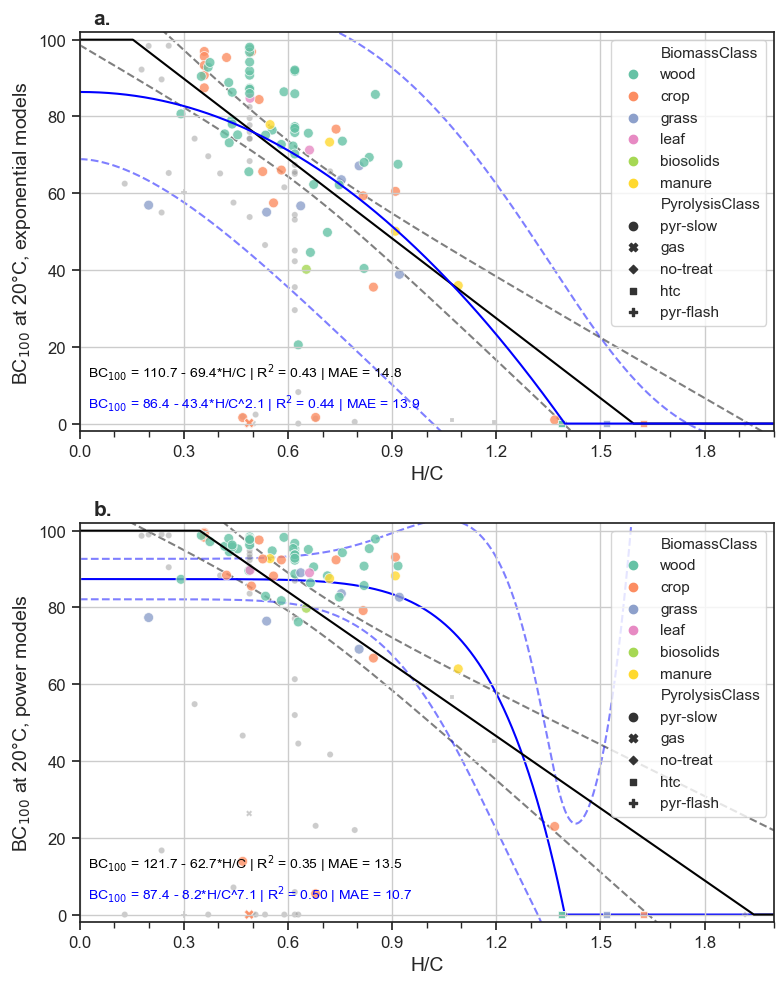

In [172]:
# PLOTING
%matplotlib inline
trendline=True
confidence=True
CF = 95
with sns.axes_style("ticks"):

    f, a = plt.subplots(nrows=2, ncols=1, figsize=figsize)
    i = 0
    # scatter data
    make_corr_scatter(df1_to_plot, y=yy, x=xx, an=False, fig=f, ax=a[i], saveFig=False, s=50) # an = list(df1_to_plot.index)
    # scatter outlier data
    make_corr_scatter(df1_outliers, y=yy, x=xx, c=None, an=False, fig=f, ax=a[i], saveFig=False, zorder=-10, s=20)
    
    # lin reg on data
    if trendline:
        
        # LINEAR, EXP
        ccc = 'black'
        a[i].plot(xxx, r_exp_LIN, ls='solid', color=ccc)
        lbl = "{} = {:.2f} x {} + {:.2f} | R2 = {:.2f}".format(yy, p_opt1[0], xx , p_opt1[1], eRl)
        print("Linear regression, exp, subset: "+lbl)
        
        txt = r"BC$_{100}$ = "+"{:.1f} - {:.1f}*H/C | R$^2$ = {:.2f} | MAE = {:.1f}".format(p_opt1[1], -1*p_opt1[0], eRl, eMl)
        a[i].annotate(txt, xy=(.025, 12), xycoords="data", fontsize=10, color=ccc)
        
        #txt= r"-- r$^{2}$"+" = {:.2f}".format(eRl)
        #a[i].annotate(txt, xy=(1.2, 90), xycoords="data", fontsize=12, color=ccc)
 
        if confidence:
            a[i].plot(xxx, linear(xxx, *p_opt1) + CF_lvl(CF)* np.array([std_linear(xx, p_opt1, p_cov1) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)
            a[i].plot(xxx, linear(xxx, *p_opt1) - CF_lvl(CF)* np.array([std_linear(xx, p_opt1, p_cov1) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)

        # LINEAR CLIP, EXP
        #ccc = 'orange'
        #ynew = linear_clip(xxx, *popt1_linclim)
        #a[i].plot(xxx, ynew, ls='dashed', color=ccc)
        #lbl = "{} = {:.2f} x {} + {:.2f} | R2 = {:.2f}".format(yy, popt1_linclim[0], xx , popt1_linclim[1], eRlc)
        #print("Clipped linear regression, exp, subset: "+lbl)

        #txt= r"r$^{2}$"+" = {:.2f}".format(eRlc)
        #a[i].annotate(txt, xy=(1.2, 10), xycoords="data", fontsize=12, color=ccc)

        # POWER CLIP, EXP
        ccc = 'blue'
        ynew = power_clip(xxx, *popt1_powclim)
        a[i].plot(xxx, ynew, ls='solid', color=ccc)
        lbl = "{} = {:.2f} - {:.2f} * {} ^ ({:.2f}) | R2 = {:.2f}".format(yy, popt1_powclim[0], popt1_powclim[1], xx , popt1_powclim[2], eRpc)
        print("Clipped power regression, exp, subset: "+lbl)
        
        txt = r"BC$_{100}$ = "+"{:.1f} - {:.1f}*H/C^{:.1f} | R$^2$ = {:.2f} | MAE = {:.1f}".format(popt1_powclim[0], popt1_powclim[1], popt1_powclim[2], eRpc, eMpc)
        a[i].annotate(txt, xy=(.025, 4), xycoords="data", fontsize=10, color=ccc)
        
        #txt= r"-- r$^{2}$"+" = {:.2f}".format(eRpc)
        #a[i].annotate(txt, xy=(1.2, 70), xycoords="data", fontsize=12, color=ccc)

        if confidence:
            a[i].plot(xxx, power_func(xxx, *popt1_powclim) + CF_lvl(95)* np.array([std_power_clip(xx, popt1_powclim, pcov1_powclip) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)
            a[i].plot(xxx, power_func(xxx, *popt1_powclim) - CF_lvl(95)* np.array([std_power_clip(xx, popt1_powclim, pcov1_powclip) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)

        # Adding RF model:
        #a[i].plot(fit_exp['BC_TS_20_TH_100'].index, fit_exp['BC_TS_20_TH_100'].values, color="red", ls='dotted')
        
    a[i].set_xlabel('H/C')
    a[i].set_ylabel(r'BC$_{100}$ at 20°C, exponential models')
    a[i].set_xlim(x_lim)
    
    
    i=1
    # scatter data
    make_corr_scatter(df2_to_plot, y=yy, x=xx, an=False, fig=f, ax=a[i], saveFig=False, s=50) # an = list(df2_to_plot.index)
    # scatter outlier data
    make_corr_scatter(df2_outliers, y=yy, x=xx, c=None, an=False, fig=f, ax=a[i], saveFig=False, zorder=-10, s=20)
    # lin reg on data
    if trendline:
        print("\n")
        
        # LINEAR, POW
        ccc = 'black'
        a[i].plot(xxx, r_pow_LIN, ls='solid', color=ccc)
        lbl = "{} = {:.2f} x {} + {:.2f} | R2 = {:.2f}".format(yy, p_opt2[0], xx , p_opt2[1], pRl)
        print("Linear regression, pow, subset: "+lbl)
        
        txt = r"BC$_{100}$ = "+"{:.1f} - {:.1f}*H/C | R$^2$ = {:.2f} | MAE = {:.1f}".format(p_opt2[1], -1*p_opt2[0], pRl, pMl)
        a[i].annotate(txt, xy=(.025, 12), xycoords="data", fontsize=10, color=ccc)
        
        #txt= r"-- r$^{2}$"+" = {:.2f}".format(pRl)
        #a[i].annotate(txt, xy=(1.2, 90), xycoords="data", fontsize=12, color=ccc)

        if confidence:
            a[i].plot(xxx, linear(xxx, *p_opt2) + CF_lvl(CF)* np.array([std_linear(xx, p_opt2, p_cov2) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)
            a[i].plot(xxx, linear(xxx, *p_opt2) - CF_lvl(CF)* np.array([std_linear(xx, p_opt2, p_cov2) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)

    
        # LINEAR CLIP, POW
        #ccc = 'orange'
        #ynew = linear_clip(xxx, *popt2_linclim)
        #a[i].plot(xxx, ynew, ls='dashed', color=ccc)
        #lbl = "{} = {:.2f} x {} + {:.2f} | R2 = {:.2f}".format(yy, popt2_linclim[0], xx , popt2_linclim[1], pRlc)
        #print("Clipped linear regression, pow, subset: "+lbl)

        #txt= r"r$^{2}$"+" = {:.2f}".format(pRlc)
        #a[i].annotate(txt, xy=(1.2, 10), xycoords="data", fontsize=12, color=ccc)

        # POWER CLIP, POW
        ccc = 'blue'
        ynew = power_clip(xxx, *popt2_powclim)
        a[i].plot(xxx, ynew, ls='solid', color=ccc, zorder=-100)
        lbl = "{} = {:.1f} - {:.2f} * {} ^ ({:.2f}) | R2 = {:.2f}".format(yy, popt2_powclim[0], popt2_powclim[1], xx , popt2_powclim[2], pRpc)
        print("Clipped power regression, pow, subset: "+lbl)

        txt = r"BC$_{100}$ = "+"{:.1f} - {:.1f}*H/C^{:.1f} | R$^2$ = {:.2f} | MAE = {:.1f}".format(popt2_powclim[0], popt2_powclim[1], popt2_powclim[2], pRpc, pMpc)
        a[i].annotate(txt, xy=(.025, 4), xycoords="data", fontsize=10, color=ccc)
        
        #txt= r"-- r$^{2}$"+" = {:.2f}".format(pRpc)
        #a[i].annotate(txt, xy=(1.2, 70), xycoords="data", fontsize=12, color=ccc)

        if confidence:
            a[i].plot(xxx, power_func(xxx, *popt2_powclim) + CF_lvl(95)* np.array([std_power_clip(xx, popt2_powclim, pcov2_powclip) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)
            a[i].plot(xxx, power_func(xxx, *popt2_powclim) - CF_lvl(95)* np.array([std_power_clip(xx, popt2_powclim, pcov2_powclip) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)

        # Adding RF model:
        #a[i].plot(fit_pow['BC_TS_20_TH_100'].index, fit_pow['BC_TS_20_TH_100'].values, color="red", ls='dotted')
        
    a[i].set_xlabel('H/C')
    a[i].set_ylabel(r'BC$_{100}$ at 20°C, power models')
    for i in [0,1]:
        a[i].text(0.02, 1.02, string.ascii_lowercase[i]+r'.', transform=a[i].transAxes, size=15, weight='bold')
        a[i].set_ylim([-2, 102])
        a[i].set_xlim(x_lim)
        a[i].xaxis.set_major_locator(MultipleLocator(0.3))
        a[i].xaxis.set_major_formatter('{x:.1f}')
        a[i].xaxis.set_minor_locator(MultipleLocator(0.1))
        a[i].grid(axis='both')

    f.tight_layout()
    
    f.savefig('../simulations/manuscript/Figure9_BC_TH100_TS_20_ExpPower_withRegressions_withHerathVentura.png', dpi=600)
    #f.savefig('../simulations/manuscript/Figure9_BC_TH100_TS_20_ExpPower_withRegressions_exclHerathVentura.png', dpi=600)

Other regressions lines - prior to 2023-09-09
```

p_opt1S, p_cov1S = curve_fit(f=linear, xdata=vX1[xx], ydata=vX1[yy], p0=None, method='trf', sigma=None, absolute_sigma=False)
r2_1S, _ =  bs.rsquare(linear, vX1[xx], vX1[yy], p_opt1S) # R2
eVar1S = err_func(vX1[yy], linear(vX1[xx], *p_opt1S))

p_opt2S, p_cov2S = curve_fit(f=linear, xdata=vX2[xx], ydata=vX2[yy], p0=None, method='trf', sigma=None, absolute_sigma=False)
r2_2S, _ =  bs.rsquare(linear, vX2[xx], vX2[yy], p_opt2S) # R2
eVar2S = err_func(vX2[yy], linear(vX2[xx], *p_opt2S))


# piece-wise linear, drawn by hand, for illustration purposes
breakpoints = np.array([0, 0.3, 1.4, 2.0])  # Breakpoints for the pieces
intercepts = np.array([90, 90, 0, 0])  # Intercepts for each piece
plin1 = piecewise_linear(xxx, breakpoints, intercepts)
r2_1P = r2_score(piecewise_linear(vX1[xx], breakpoints, intercepts), vX1[yy])
eVar1P = err_func(vX1[yy], piecewise_linear(vX1[xx], breakpoints, intercepts))

breakpoints = np.array([0, 0.4, 0.9, 1.4, 2.0])  # Breakpoints for the pieces
intercepts = np.array([95, 95, 80, 0, 0])  # Intercepts for each piece
plin2 = piecewise_linear(xxx, breakpoints, intercepts)
r2_2P = r2_score(piecewise_linear(vX2[xx], breakpoints, intercepts), vX2[yy])
eVar2P = err_func(vX2[yy], piecewise_linear(vX2[xx], breakpoints, intercepts))

# line, including singular obs
vXnan1 = list(df1[df1[xx].isna()].index)
vXnan2 = list(df2[df2[xx].isna()].index)
vX1 = df1.drop(vXnan1, axis=0)
vX2 = df2.drop(vXnan2, axis=0)

```

Linear regression, exp, subset: BC_TH_100_TS_20 = -75.23 x H/C_all + 118.08 | R2 = 0.68
Linear regression, pow, subset: BC_TH_100_TS_20 = -69.56 x H/C_all + 130.38 | R2 = 0.70


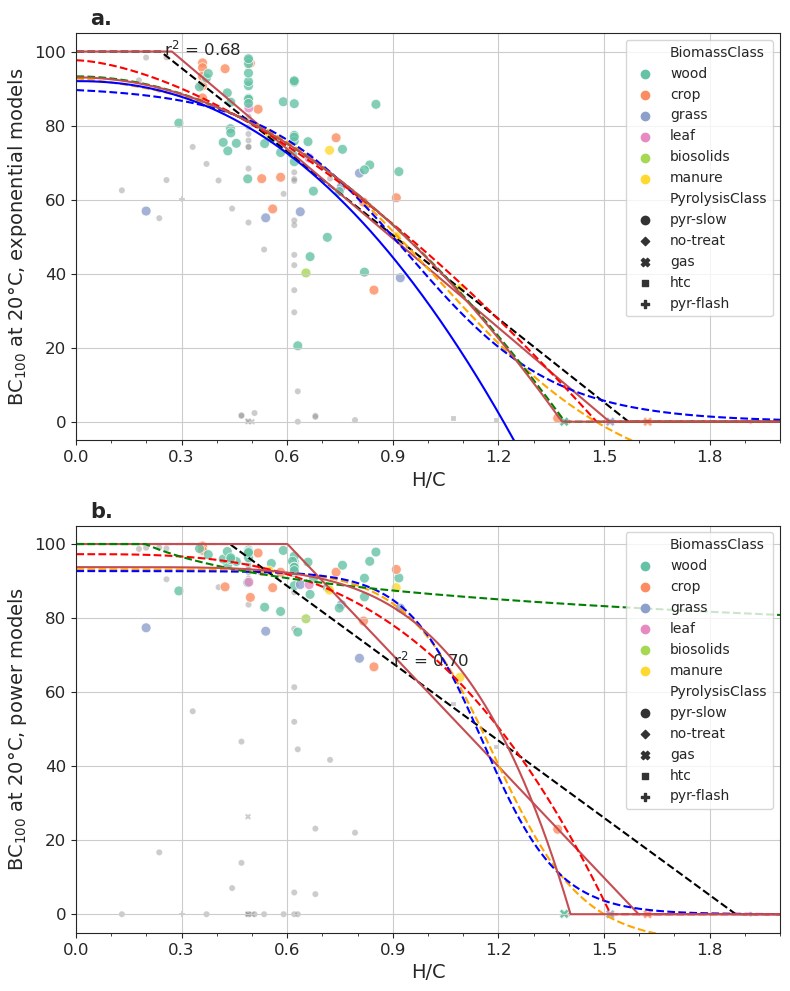

In [2365]:
# PLOTING
with sns.axes_style("ticks"):

    f, a = plt.subplots(nrows=2, ncols=1, figsize=figsize)
    i = 0
    # scatter data
    make_corr_scatter(df1_to_plot, y=yy, x=xx, an=False, fig=f, ax=a[i], saveFig=False, s=50) # an = list(df1_to_plot.index)
    # scatter outlier data
    make_corr_scatter(df1_outliers, y=yy, x=xx, c=None, an=False, fig=f, ax=a[i], saveFig=False, zorder=-10, s=20)
    # lin reg on data
    if trendline:
        
        # LINEAR, EXP
        lbl = "{} = {:.2f} x {} + {:.2f} | R2 = {:.2f}".format(yy, p_opt1[0], xx , p_opt1[1], r2_1)
        a[i].plot(xxx, r_exp_LIN, ls='dashed', color='black', label='LIN')
        print("Linear regression, exp, subset: "+lbl)
        
        txt= r"r$^{2}$"+" = {:.2f}".format(r2_1)
        a[i].annotate(txt, xy=(0.25, 99), xycoords="data", fontsize=12)
 
        # LINEAR CLIP, EXP
        ynew = linear_clip(xxx, *popt1_linclim)
        a[i].plot(xxx, ynew, 'r')
    
        
        # SIGMOID, EXP
        a[i].plot(xxx, r_exp_SIG, ls='dashed', color='orange', label='SIG')
        a[i].plot(xxx, r_exp_SIG0, ls='dashed', color='blue', label='SIG0')
        #if trenderror:
        #    a[i].plot(xxx, linear(xxx, *p_opt1) + 1.96* np.array([std_linear(xx, p_opt1, p_cov1) for xx in xxx]), 'k--', alpha=0.7)
        #    a[i].plot(xxx, linear(xxx, *p_opt1) - 1.96* np.array([std_linear(xx, p_opt1, p_cov1) for xx in xxx]), 'k--', alpha=0.7)
        
        # POWER, EXP
        a[i].plot(xxx, r_exp_POW, ls='dashed', color='red', label='POW')
        a[i].plot(xxx, r_exp_POWs, ls='dashed', color='green', label='POWs')

        # POWER CLIP, EXP
        ynew = power_clip(xxx, *popt1_powclim)
        a[i].plot(xxx, ynew, 'r', label='pow_clip: M=%4.2f, a=%4.2f, c=%4.2f' % tuple(popt1_powclim))
    
        # Power-relation, from Rodrigues
        #a[i].plot(xxx, 100*0.854 - 100*4.933*(xxx**5.998), label='Rodrigues2023', color='blue')
        #txt= r"BC = 85.4 - 49.33 * $ H/C ^{5.998}$"
        #a[i].annotate(txt, xy=(0.75, 10), xycoords="data", fontsize=12, color='blue')
        a[i].plot(xxx, 92 - 60*(xxx**2.2), label='Rodrigues2023', color='blue')
        
        
        # Sigmoid relation, manually fitted
        #a[i].plot(xxx, 
        #          parametric_sigmoid(xxx, max_value=90, min_value=0, a=9, b=.85),
        #          label='Rodrigues2023', color='orange')
        #txt = 'sigmoid'
        #a[i].annotate(txt, xy=(0.75, 10), xycoords="data", fontsize=12, color='orange')
        
        
    a[i].set_xlabel('H/C')
    a[i].set_ylabel(r'BC$_{100}$ at 20°C, exponential models')
    a[i].set_xlim(x_lim)
    
    
    i=1
    # scatter data
    make_corr_scatter(df2_to_plot, y=yy, x=xx, an=False, fig=f, ax=a[i], saveFig=False, s=50) # an = list(df2_to_plot.index)
    # scatter outlier data
    make_corr_scatter(df2_outliers, y=yy, x=xx, c=None, an=False, fig=f, ax=a[i], saveFig=False, zorder=-10, s=20)
    # lin reg on data
    if trendline:
        # LINEAR, POW
        lbl = "{} = {:.2f} x {} + {:.2f} | R2 = {:.2f}".format(yy, p_opt2[0], xx , p_opt2[1], r2_2)
        a[i].plot(xxx, r_pow_LIN, ls='dashed', color='black', label='L1')
        print("Linear regression, pow, subset: "+lbl)

        txt= r"r$^{2}$"+" = {:.2f}".format(r2_2)
        a[i].annotate(txt, xy=(0.9, 67), xycoords="data", fontsize=12)

        # LINEAR CLIP, EXP
        ynew = linear_clip(xxx, *popt2_linclim)
        a[i].plot(xxx, ynew, 'r')
        
        # SIGMOID, POW
        a[i].plot(xxx, r_pow_SIG, ls='dashed', color='orange', label='SIG')
        a[i].plot(xxx, r_pow_SIG0, ls='dashed', color='blue', label='SIG0')

        # POWER, POW
        a[i].plot(xxx, r_pow_POW, ls='dashed', color='red', label='POW')
        a[i].plot(xxx, r_pow_POWs, ls='dashed', color='green', label='POW')
 
        # POWER CLIP, EXP
        ynew = power_clip(xxx, *popt2_powclim)
        a[i].plot(xxx, ynew, 'r', label='pow_clip: M=%4.2f, a=%4.2f, c=%4.2f' % tuple(popt2_powclim))
 
    a[i].set_xlabel('H/C')
    a[i].set_ylabel(r'BC$_{100}$ at 20°C, power models')
    for i in [0,1]:
        a[i].text(0.02, 1.02, string.ascii_lowercase[i]+r'.', transform=a[i].transAxes, size=15, weight='bold')
        a[i].set_ylim([-5, 105])
        a[i].set_xlim(x_lim)
        a[i].xaxis.set_major_locator(MultipleLocator(0.3))
        a[i].xaxis.set_major_formatter('{x:.1f}')
        a[i].xaxis.set_minor_locator(MultipleLocator(0.1))
        a[i].grid(axis='both')

    f.tight_layout()
    
    #f.savefig('../simulations/manuscript/aBC100_ExpPower_withRegressions', dpi=600)

### At any soil temperature

In [2284]:
# CSV file name
import csv
csv_filename = '../simulations/manuscript/BC100_ExpPower_TS_RegressionCoefficients.csv'

# Open the CSV file in write mode
with open(csv_filename, mode='w', newline='') as file:
    # Create a CSV writer object
    writer = csv.writer(file)
    #writer.writerow([value])

    for targetTemperature in np.arange(0, 30+1, 1):
        #anyS2_bestfit_Q10, _, _ = bs.applyTempCorr(S2_bestfit, metadata, tTs=targetTemperature, TH=100, method=bs.fT_Woolf)
        #anyS2_bestfit_sQ10, _, _ = bs.applyTempCorr(S2_bestfit, metadata, tTs=targetTemperature, TH=100, method=bs.fT_WoolfStepwise)
        anyS2_bestfit_kExp, _, _ = bs.applyTempCorr(S2_bestfit, metadata, tTs=targetTemperature, TH=100, method=bs.fT_DataFit)

        #anyS3_bestfit_Q10, _, _ = bs.applyTempCorr(S3_bestfit, metadata, tTs=targetTemperature, TH=100, method=bs.fT_Woolf)
        #anyS3_bestfit_sQ10, _, _ = bs.applyTempCorr(S3_bestfit, metadata, tTs=targetTemperature, TH=100, method=bs.fT_WoolfStepwise)
        anyS3_bestfit_kExp, _, _ = bs.applyTempCorr(S3_bestfit, metadata, tTs=targetTemperature, TH=100, method=bs.fT_DataFit)

        #anyS2_Q10 = metadata_wSF(anyS2_bestfit_Q10, metadata_S2_EDA)
        #anyS2_sQ10 = metadata_wSF(anyS2_bestfit_sQ10, metadata_S2_EDA)
        anyS2_kExp = metadata_wSF(anyS2_bestfit_kExp, metadata_S2_EDA)

        #anyS3_Q10 = metadata_wSF(anyS3_bestfit_Q10, metadata_S3_EDA)
        #anyS3_sQ10 = metadata_wSF(anyS3_bestfit_sQ10, metadata_S3_EDA)
        anyS3_kExp = metadata_wSF(anyS3_bestfit_kExp, metadata_S3_EDA)

        toDrop = sAllCriteria.union(set(UnexplainedOutliers))
        df1 = anyS2_kExp
        df2 = anyS3_kExp
        figsize = (8,10)
        xx='H/C_all'
        yy='BC_TH_'+str(100)+'_TS_'+str(targetTemperature)
        x_lim = [0, 2]
        trendline = True
        confidence=False
        
        if len(toDrop)>0:
            print('Excluding {} observations.'.format(len(toDrop)))

        df1_to_plot = df1.drop(toDrop, errors='ignore')
        df1_outliers = df1[df1.index.isin(toDrop)] 
        df2_to_plot = df2.drop(toDrop, errors='ignore')
        df2_outliers = df2[df2.index.isin(toDrop)] 

        # calculate linear regressions,taking care of potential NaNs in xx [e.g. Kuzyakov]
        vXnan1 = list(df1_to_plot[df1_to_plot[xx].isna()].index)
        vXnan2 = list(df2_to_plot[df2_to_plot[xx].isna()].index)
        vX1 = df1_to_plot.drop(vXnan1, axis=0)
        vX2 = df2_to_plot.drop(vXnan2, axis=0)
        print('Nb of observations left: {} (exponential), {} (power)'.format(len(vX1), len(vX2)))
        xxx = np.linspace(x_lim[0], x_lim[1], 1000)

        # LINEAR
        p_opt1, p_cov1 = curve_fit(f=linear, xdata=vX1[xx], ydata=vX1[yy], p0=None, method='trf', sigma=None, absolute_sigma=False)
        eRl, _ = evaluateRegression(linear, p_opt1, vX1[xx], vX1[yy])
        
        p_opt2, p_cov2 = curve_fit(f=linear, xdata=vX2[xx], ydata=vX2[yy], p0=None, method='trf', sigma=None, absolute_sigma=False)
        pRl, _ = evaluateRegression(linear, p_opt2, vX2[xx], vX2[yy])
        # POWER CLIP
        popt1_powclip, pcov1_powclip = curve_fit(power_clip, vX1[xx], vX1[yy], method='trf', p0=[90.0, 20., 5.0], bounds=(0, np.Inf))
        eRpc,_ = evaluateRegression(power_clip, popt1_powclim, vX1[xx], vX1[yy])
        
        popt2_powclip, pcov2_powclip = curve_fit(power_clip, vX2[xx], vX2[yy], method='trf', p0=[90.0, 20., 5.0], bounds=(0, np.Inf))
        pRpc,_ = evaluateRegression(power_clip, popt2_powclim, vX2[xx], vX2[yy])

        with sns.axes_style("ticks"):

            f, a = plt.subplots(nrows=2, ncols=1, figsize=figsize)
            i = 0
            # scatter data
            make_corr_scatter(df1_to_plot, y=yy, x=xx, an=False, fig=f, ax=a[i], saveFig=False) # an = list(df1_to_plot.index)
            # scatter outlier data
            make_corr_scatter(df1_outliers, y=yy, x=xx, c=None, an=False, fig=f, ax=a[i], saveFig=False, zorder=-10)
            # lin reg on data
            if trendline:         
                # LINEAR, EXP
                ccc = 'black'
                a[i].plot(xxx, np.clip(linear(xxx, *p_opt1), 0, 100), ls='dashed', color=ccc)
                lbl = "{} = {:.2f} x {} + {:.2f} | R2 = {:.2f}".format(yy, p_opt1[0], xx , p_opt1[1], eRl)
                print("Linear regression, exp, subset: "+lbl)

                txt= r"-- r$^{2}$"+" = {:.2f}".format(eRl)
                a[i].annotate(txt, xy=(1.2, 95), xycoords="data", fontsize=12, color=ccc)

                if confidence:
                    a[i].plot(xxx, linear(xxx, *p_opt1) + CF_lvl(95)* np.array([std_linear(xx, p_opt1, p_cov1) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)
                    a[i].plot(xxx, linear(xxx, *p_opt1) - CF_lvl(95)* np.array([std_linear(xx, p_opt1, p_cov1) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)

                # POWER CLIP, EXP
                ccc = 'blue'
                ynew = power_clip(xxx, *popt1_powclip)
                a[i].plot(xxx, ynew, ls='dashed', color=ccc)
                lbl = "{} = {:.2f} - {:.2f} * {} ^ ({:.2f}) | R2 = {:.2f}".format(yy, popt1_powclip[0], popt1_powclip[1], xx , popt1_powclip[2], eRpc)
                print("Clipped power regression, exp, subset: "+lbl)

                txt= r"-- r$^{2}$"+" = {:.2f}".format(eRpc)
                a[i].annotate(txt, xy=(1.2, 85), xycoords="data", fontsize=12, color=ccc)

                if confidence:
                    a[i].plot(xxx, power_func(xxx, *popt1_powclip) + CF_lvl(95)* np.array([std_power_clip(xx, popt1_powclip, pcov1_powclip) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)
                    a[i].plot(xxx, power_func(xxx, *popt1_powclip) - CF_lvl(95)* np.array([std_power_clip(xx, popt1_powclip, pcov1_powclip) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)
 
            a[i].set_xlabel('H/C')
            a[i].set_ylabel(r'BC$_{100}$ at '+str(targetTemperature)+'°C, exponential models')

            i=1
            # scatter data
            make_corr_scatter(df2_to_plot, y=yy, x=xx, an=False, fig=f, ax=a[i], saveFig=False) # an = list(df2_to_plot.index)
            # scatter outlier data
            make_corr_scatter(df2_outliers, y=yy, x=xx, c=None, an=False, fig=f, ax=a[i], saveFig=False, zorder=-10)
            # lin reg on data
            if trendline:
                # LINEAR, POW
                ccc = 'black'
                a[i].plot(xxx, np.clip(linear(xxx, *p_opt2), 0, 100), ls='dashed', color=ccc)
                lbl = "{} = {:.2f} x {} + {:.2f} | R2 = {:.2f}".format(yy, p_opt2[0], xx , p_opt2[1], pRl)
                print("Linear regression, pow, subset: "+lbl)

                txt= r"-- r$^{2}$"+" = {:.2f}".format(pRl)
                a[i].annotate(txt, xy=(1.2, 95), xycoords="data", fontsize=12, color=ccc)

                if confidence:
                    a[i].plot(xxx, linear(xxx, *p_opt2) + CF_lvl(95)* np.array([std_linear(xx, p_opt2, p_cov2) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)
                    a[i].plot(xxx, linear(xxx, *p_opt2) - CF_lvl(95)* np.array([std_linear(xx, p_opt2, p_cov2) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)

                # POWER CLIP, POW
                ccc = 'blue'
                ynew = power_clip(xxx, *popt2_powclip)
                a[i].plot(xxx, ynew, ls='dashed', color=ccc, zorder=-100)
                lbl = "{} = {:.2f} - {:.2f} * {} ^ ({:.2f}) | R2 = {:.2f}".format(yy, popt2_powclip[0], popt2_powclip[1], xx , popt2_powclip[2], pRpc)
                print("Clipped power regression, pow, subset: "+lbl)

                txt= r"-- r$^{2}$"+" = {:.2f}".format(pRpc)
                a[i].annotate(txt, xy=(1.2, 85), xycoords="data", fontsize=12, color=ccc)

                if confidence:
                    a[i].plot(xxx, power_func(xxx, *popt2_powclip) + CF_lvl(95)* np.array([std_power_clip(xx, popt2_powclip, pcov2_powclip) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)
                    a[i].plot(xxx, power_func(xxx, *popt2_powclip) - CF_lvl(95)* np.array([std_power_clip(xx, popt2_powclip, pcov2_powclip) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)


            a[i].set_xlabel('H/C')
            a[i].set_ylabel(r'BC$_{100}$ at '+str(targetTemperature)+'°C, power models')

            for i in [0,1]:
                a[i].set_ylim([-2, 102])
                a[i].set_xlim(x_lim)
                a[i].xaxis.set_major_locator(MultipleLocator(0.3))
                a[i].xaxis.set_major_formatter('{x:.1f}')
                a[i].xaxis.set_minor_locator(MultipleLocator(0.1))
                a[i].grid(axis='both')

            f.tight_layout()
            #f.savefig('../simulations/manuscript/scatter/BC100_ExpPower_TS_'+str(targetTemperature)+'.png', dpi=600)
            f.savefig('../simulations/manuscript/scatter/BC100_ExpPower_TS_'+str(targetTemperature)+'_exclHerathVentura.png', dpi=600)
            writer.writerow([])
            plt.close()

Excluding 52 observations.
Nb of observations left: 80 (exponential), 79 (power)
Model:  linear
Params:  [-69.53693215 129.40021217]
Chisqr:  10198.740243272052 
AIC:  391.83942811275824 
BIC:  396.603481382106
MAE: 8.468903477963694
R2:  0.734270449295385 

Model:  linear
Params:  [-28.78331118 113.4303103 ]
Chisqr:  2706.8373709715584 
AIC:  283.1929802918611 
BIC:  287.93187599679516
MAE: 3.806413312099603
R2:  0.6378200078619525 

Model:  power_clip
Params:  [93.0089163  49.12107877  1.97891641]
Chisqr:  24464.276101780204 
AIC:  463.8354063580213 
BIC:  470.98148626204295
MAE: 15.473670319541776
R2:  0.36257999107995387 

Model:  power_clip
Params:  [93.75548255 18.0017584   4.85365316]
Chisqr:  19905.999537863616 
AIC:  442.81695917272117 
BIC:  449.9253027301222
MAE: 9.367331630207001
R2:  -1.6634606250968509 

Linear regression, exp, subset: BC_TH_100_TS_0 = -69.54 x H/C_all + 129.40 | R2 = 0.73
Clipped power regression, exp, subset: BC_TH_100_TS_0 = 93.74 - 21.13 * H/C_all ^ (

Excluding 52 observations.
Nb of observations left: 80 (exponential), 79 (power)
Model:  linear
Params:  [-73.11126351 126.44625244]
Chisqr:  10963.016311099227 
AIC:  397.6204879065024 
BIC:  402.38454117585013
MAE: 8.934437112896992
R2:  0.7396950090627626 

Model:  linear
Params:  [-49.06260894 122.96757352]
Chisqr:  7971.274765735492 
AIC:  368.5179963111543 
BIC:  373.2568920160884
MAE: 6.527038652818924
R2:  0.6347048135724047 

Model:  power_clip
Params:  [93.0089163  49.12107877  1.97891641]
Chisqr:  15321.556304238979 
AIC:  426.39915119197786 
BIC:  433.5452310959995
MAE: 11.55480998295754
R2:  0.6362061806948632 

Model:  power_clip
Params:  [93.75548255 18.0017584   4.85365316]
Chisqr:  8204.022774252682 
AIC:  372.7916313744962 
BIC:  379.89997493189725
MAE: 6.516682969132394
R2:  0.6240387997087997 

Linear regression, exp, subset: BC_TH_100_TS_7 = -73.11 x H/C_all + 126.45 | R2 = 0.74
Clipped power regression, exp, subset: BC_TH_100_TS_7 = 92.51 - 31.97 * H/C_all ^ (3.15

Excluding 52 observations.
Nb of observations left: 80 (exponential), 79 (power)
Model:  linear
Params:  [-74.68872543 122.23344381]
Chisqr:  13018.351873525924 
AIC:  411.3670951089298 
BIC:  416.13114837827754
MAE: 9.602230148834643
R2:  0.7140722128097147 

Model:  linear
Params:  [-62.45856312 128.42323683]
Chisqr:  10362.49818421119 
AIC:  389.2435609682191 
BIC:  393.98245667315314
MAE: 8.10564136080458
R2:  0.6841516938621819 

Model:  power_clip
Params:  [93.0089163  49.12107877  1.97891641]
Chisqr:  12319.236486838317 
AIC:  408.95125016178224 
BIC:  416.0973300658039
MAE: 9.891612911090004
R2:  0.7294271914927519 

Model:  power_clip
Params:  [93.75548255 18.0017584   4.85365316]
Chisqr:  3631.6144213866655 
AIC:  308.41079288838574 
BIC:  315.5191364457868
MAE: 5.206479635398858
R2:  0.8893086162091361 

Linear regression, exp, subset: BC_TH_100_TS_14 = -74.69 x H/C_all + 122.23 | R2 = 0.71
Clipped power regression, exp, subset: BC_TH_100_TS_14 = 92.39 - 41.48 * H/C_all ^ (2

Excluding 52 observations.
Nb of observations left: 80 (exponential), 79 (power)
Model:  linear
Params:  [-75.25941222 117.34387826]
Chisqr:  16209.268220989296 
AIC:  428.9049468287544 
BIC:  433.6690000981022
MAE: 10.698852799665847
R2:  0.6706762665654443 

Model:  linear
Params:  [-70.05675492 130.30352785]
Chisqr:  12136.908481581788 
AIC:  401.7301234088645 
BIC:  406.46901911379854
MAE: 9.176275579950364
R2:  0.6994046718357457 

Model:  power_clip
Params:  [93.0089163  49.12107877  1.97891641]
Chisqr:  14925.77412458825 
AIC:  424.3054535908757 
BIC:  431.4515334948973
MAE: 9.939346329385378
R2:  0.6967530185757955 

Model:  power_clip
Params:  [93.75548255 18.0017584   4.85365316]
Chisqr:  3691.751634438644 
AIC:  309.7082690995139 
BIC:  316.81661265691497
MAE: 5.21895698525158
R2:  0.9085662303757952 

Linear regression, exp, subset: BC_TH_100_TS_21 = -75.26 x H/C_all + 117.34 | R2 = 0.67
Clipped power regression, exp, subset: BC_TH_100_TS_21 = 93.10 - 50.36 * H/C_all ^ (1.9

Excluding 52 observations.
Nb of observations left: 80 (exponential), 79 (power)
Model:  linear
Params:  [-75.08435456 111.96600668]
Chisqr:  20174.24028227684 
AIC:  446.4108161090021 
BIC:  451.17486937834985
MAE: 12.168427321277
R2:  0.6195796392383328 

Model:  linear
Params:  [-73.12216169 129.32974234]
Chisqr:  13610.922590481741 
AIC:  410.78522225723066 
BIC:  415.5241179621647
MAE: 9.688007276252641
R2:  0.6932791422561018 

Model:  power_clip
Params:  [93.0089163  49.12107877  1.97891641]
Chisqr:  22729.46680408654 
AIC:  457.95126592738507 
BIC:  465.0973458314067
MAE: 11.956419479285262
R2:  0.5713964025139945 

Model:  power_clip
Params:  [93.75548255 18.0017584   4.85365316]
Chisqr:  7176.700676341006 
AIC:  362.22262786270863 
BIC:  369.3309714201097
MAE: 6.635397145639542
R2:  0.838273726664357 

Linear regression, exp, subset: BC_TH_100_TS_28 = -75.08 x H/C_all + 111.97 | R2 = 0.62
Clipped power regression, exp, subset: BC_TH_100_TS_28 = 91.36 - 58.45 * H/C_all ^ (1.85

In [886]:
# CSV file name
import csv
csv_filename = '../simulations/manuscript/BC100_ExpPower_TS_RegressionCoefficients.csv'

# Open the CSV file in write mode
with open(csv_filename, mode='w', newline='') as file:
    # Create a CSV writer object
    writer = csv.writer(file)
    #writer.writerow([value])

    for targetTemperature in np.arange(0, 30+1, 1):
        #anyS2_bestfit_Q10, _, _ = bs.applyTempCorr(S2_bestfit, metadata, tTs=targetTemperature, TH=100, method=bs.fT_Woolf)
        #anyS2_bestfit_sQ10, _, _ = bs.applyTempCorr(S2_bestfit, metadata, tTs=targetTemperature, TH=100, method=bs.fT_WoolfStepwise)
        anyS2_bestfit_kExp, _, _ = bs.applyTempCorr(S2_bestfit, metadata, tTs=targetTemperature, TH=100, method=bs.fT_DataFit)

        #anyS3_bestfit_Q10, _, _ = bs.applyTempCorr(S3_bestfit, metadata, tTs=targetTemperature, TH=100, method=bs.fT_Woolf)
        #anyS3_bestfit_sQ10, _, _ = bs.applyTempCorr(S3_bestfit, metadata, tTs=targetTemperature, TH=100, method=bs.fT_WoolfStepwise)
        anyS3_bestfit_kExp, _, _ = bs.applyTempCorr(S3_bestfit, metadata, tTs=targetTemperature, TH=100, method=bs.fT_DataFit)

        #anyS2_Q10 = metadata_wSF(anyS2_bestfit_Q10, metadata_S2_EDA)
        #anyS2_sQ10 = metadata_wSF(anyS2_bestfit_sQ10, metadata_S2_EDA)
        anyS2_kExp = metadata_wSF(anyS2_bestfit_kExp, metadata_S2_EDA)

        #anyS3_Q10 = metadata_wSF(anyS3_bestfit_Q10, metadata_S3_EDA)
        #anyS3_sQ10 = metadata_wSF(anyS3_bestfit_sQ10, metadata_S3_EDA)
        anyS3_kExp = metadata_wSF(anyS3_bestfit_kExp, metadata_S3_EDA)

        toDrop = sAllCriteria.union(set(UnexplainedOutliers))
        df1 = anyS2_kExp
        df2 = anyS3_kExp
        figsize = (8,10)
        xx='H/C_all'
        yy='BC_TH_'+str(100)+'_TS_'+str(targetTemperature)
        x_lim = [0, 2]
        trendline = True
        confidence= False
        
        if len(toDrop)>0:
            print('Excluding {} observations.'.format(len(toDrop)))

        df1_to_plot = df1.drop(toDrop, errors='ignore')
        df1_outliers = df1[df1.index.isin(toDrop)] 
        df2_to_plot = df2.drop(toDrop, errors='ignore')
        df2_outliers = df2[df2.index.isin(toDrop)] 

        # calculate linear regressions,taking care of potential NaNs in xx [e.g. Kuzyakov]
        vXnan1 = list(df1_to_plot[df1_to_plot[xx].isna()].index)
        vXnan2 = list(df2_to_plot[df2_to_plot[xx].isna()].index)
        vX1 = df1_to_plot.drop(vXnan1, axis=0)
        vX2 = df2_to_plot.drop(vXnan2, axis=0)
        print('Nb of observations left: {} (exponential), {} (power)'.format(len(vX1), len(vX2)))
        xxx = np.linspace(x_lim[0], x_lim[1], 1000)

        # POWER CLIP
        popt1_powclip, pcov1_powclip = curve_fit(power_clip, vX1[xx], vX1[yy], method='trf', p0=[90.0, 20., 5.0], bounds=(0, np.Inf))
        eRpc,_ = evaluateRegression(power_clip, popt1_powclip, vX1[xx], vX1[yy])
        
        popt2_powclip, pcov2_powclip = curve_fit(power_clip, vX2[xx], vX2[yy], method='trf', p0=[90.0, 20., 5.0], bounds=(0, np.Inf))
        pRpc,_ = evaluateRegression(power_clip, popt1_powclip, vX2[xx], vX2[yy])

        with sns.axes_style("ticks"):
            trendline=True
            confidence=False
            figsize = (8,5)
            CF = 95
            with sns.axes_style("ticks"):

                f, a = plt.subplots(nrows=1, ncols=1, figsize=figsize)
                i = 0
                # scatter data
                make_corr_scatter(df1_to_plot, y=yy, x=xx, an=False, fig=f, ax=a, saveFig=False, s=50) # an = list(df1_to_plot.index)
                # scatter outlier data
                #make_corr_scatter(df1_outliers, y=yy, x=xx, c=None, an=False, fig=f, ax=a, saveFig=False, zorder=-10, s=20)

                # lin reg on data
                if trendline:
                    # POWER CLIP, EXP
                    ccc = 'blue'
                    ynew = power_clip(xxx, *popt1_powclip)
                    a.plot(xxx, ynew, ls='solid', color=ccc)
                    lbl = "{} = {:.2f} - {:.2f} * {} ^ ({:.2f}) | R2 = {:.2f}".format(yy, popt1_powclip[0], popt1_powclip[1], xx , popt1_powclim[2], eRpc)
                    print("Clipped power regression, exp, subset: "+lbl)

                    txt = r"BC$_{100}$ = "+"{:.1f} - {:.1f}*H/C^{:.1f} | R$^2$ = {:.2f} | MAE = {:.1f}".format(popt1_powclim[0], popt1_powclim[1], popt1_powclim[2], eRpc, eMpc)
                    a.annotate(txt, xy=(.025, 4), xycoords="data", fontsize=10, color=ccc)

                    if confidence:
                        a.plot(xxx, power_func(xxx, *popt1_powclip) + CF_lvl(95)* np.array([std_power_clip(xx, popt1_powclip, pcov1_powclip) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)
                        a.plot(xxx, power_func(xxx, *popt1_powclip) - CF_lvl(95)* np.array([std_power_clip(xx, popt1_powclip, pcov1_powclip) for xx in xxx]), '--', color=ccc, alpha=0.5, zorder=-100)

                a.set_xlabel('H/C')
                a.set_ylabel(r'BC$_{100}$ at '+str(targetTemperature)+'°C, exponential models')
                a.set_xlim(x_lim)

                for i in [0]:
                    #a.text(0.02, 1.02, string.ascii_lowercase[i]+r'.', transform=a.transAxes, size=15, weight='bold')
                    a.set_ylim([-2, 102])
                    a.set_xlim(x_lim)
                    a.xaxis.set_major_locator(MultipleLocator(0.3))
                    a.xaxis.set_major_formatter('{x:.1f}')
                    a.xaxis.set_minor_locator(MultipleLocator(0.1))
                    a.grid(axis='both')   


                f.tight_layout()
                #f.savefig('../simulations/manuscript/scatter/SLURapport_BC100_ExpPower_TS_'+str(targetTemperature)+'_exclHerathVentura.png', dpi=600)
                writer.writerow([targetTemperature, *popt1_powclip, eRpc])
                plt.close()

Excluding 52 observations.
Nb of observations left: 80 (exponential), 79 (power)
Model:  power_clip
Params:  [93.73741511 21.12999677  4.29065676]
Chisqr:  3272.2449478808803 
AIC:  302.8963937654828 
BIC:  310.04247366950443
MAE: 4.620523329860954
R2:  0.9147412171449852
R2 Adjusted Obs:  0.8628591496520683 

Model:  power_clip
Params:  [93.73741511 21.12999677  4.29065676]
Chisqr:  20620.77741208004 
AIC:  445.60392189295885 
BIC:  452.7122654503599
MAE: 10.21545834795919
R2:  -1.7590992650980546
R2 Adjusted Obs:  -2.5982845220659883 

Clipped power regression, exp, subset: BC_TH_100_TS_0 = 93.74 - 21.13 * H/C_all ^ (1.98) | R2 = 0.91
Excluding 52 observations.
Nb of observations left: 80 (exponential), 79 (power)
Model:  power_clip
Params:  [93.4942812  22.80052336  4.08633124]
Chisqr:  3646.3862362562886 
AIC:  311.5572199359057 
BIC:  318.70329983992735
MAE: 4.877294417823359
R2:  0.9065587771755482
R2 Adjusted Obs:  0.8522746491855879 

Model:  power_clip
Params:  [93.4942812  22

Excluding 52 observations.
Nb of observations left: 80 (exponential), 79 (power)
Model:  power_clip
Params:  [92.34256179 40.17296781  2.50013474]
Chisqr:  9829.374750048184 
AIC:  390.88831761136345 
BIC:  398.0343975153851
MAE: 8.017009424204733
R2:  0.7816978302584442
R2 Adjusted Obs:  0.7062803075260871 

Model:  power_clip
Params:  [92.34256179 40.17296781  2.50013474]
Chisqr:  20572.716944838343 
AIC:  445.4195831426741 
BIC:  452.52792670007517
MAE: 13.958317375336138
R2:  0.34421954974772706
R2 Adjusted Obs:  -0.17771795645465338 

Clipped power regression, exp, subset: BC_TH_100_TS_13 = 92.34 - 40.17 * H/C_all ^ (1.98) | R2 = 0.78
Excluding 52 observations.
Nb of observations left: 80 (exponential), 79 (power)
Model:  power_clip
Params:  [92.39227161 41.48152632  2.41161673]
Chisqr:  10435.429086599663 
AIC:  395.67482431475895 
BIC:  402.8209042187806
MAE: 8.277950202445293
R2:  0.7708020818533577
R2 Adjusted Obs:  0.6948531863565006 

Model:  power_clip
Params:  [92.39227161

Clipped power regression, exp, subset: BC_TH_100_TS_25 = 92.17 - 55.12 * H/C_all ^ (1.98) | R2 = 0.66
Excluding 52 observations.
Nb of observations left: 80 (exponential), 79 (power)
Model:  power_clip
Params:  [91.89669917 56.24574865  1.86921097]
Chisqr:  18113.737581831836 
AIC:  439.7919421696145 
BIC:  446.93802207363615
MAE: 11.217522160217683
R2:  0.6513125979527119
R2 Adjusted Obs:  0.38049486628604556 

Model:  power_clip
Params:  [91.89669917 56.24574865  1.86921097]
Chisqr:  36098.736986335454 
AIC:  489.8406590723905 
BIC:  496.94900262979155
MAE: 18.551102937461433
R2:  0.17116679371071564
R2 Adjusted Obs:  -4.014150487445355 

Clipped power regression, exp, subset: BC_TH_100_TS_26 = 91.90 - 56.25 * H/C_all ^ (1.98) | R2 = 0.65
Excluding 52 observations.
Nb of observations left: 80 (exponential), 79 (power)
Model:  power_clip
Params:  [91.63033749 57.35702744  1.85923752]
Chisqr:  18753.653623071357 
AIC:  442.56937901112724 
BIC:  449.7154589151489
MAE: 11.445227258870258

In [ ]:
# PLOTING
%matplotlib inline

    
    #f.savefig('../simulations/manuscript/Figure9_BC_TH100_TS_20_ExpPower_withRegressions_withHerathVentura.png', dpi=600)
    #f.savefig('../simulations/manuscript/Figure9_BC_TH100_TS_20_ExpPower_withRegressions_exclHerathVentura.png', dpi=600)

### Demo sigmoid / piece-wise linear

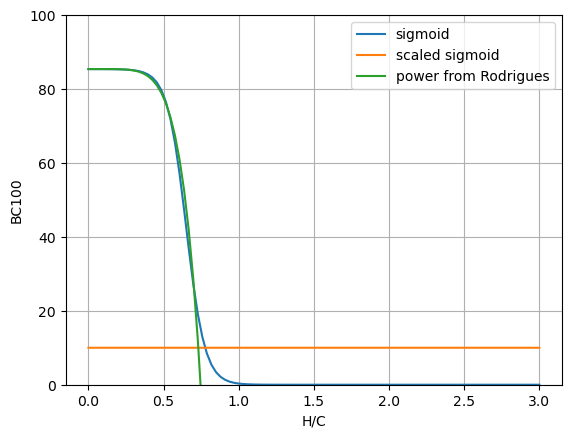

In [957]:
%matplotlib inline
def parametric_sigmoid(x, max_value, min_value, a, b):
    return (max_value - min_value) / (1 + np.exp(a * (x - b))) + min_value

def scaled_sigmoid(x, upper, lower, a, b):
    return (lower + (upper-lower)/(1+np.exp(a+b*x)))
            
# Generate x-values
x = np.linspace(0, 3, 100)

# Compute y-values using the parametric sigmoid function 
# a, Controls the steepness of the curve
# b, Shifts the sigmoid horizontally (mid-height point)
y = parametric_sigmoid(x, max_value=85.4, min_value=0, a=16, b=.65)
# Plot the parametric sigmoid function
plt.plot(x, y, label='sigmoid')

y2 = scaled_sigmoid(x, upper=85.4, lower=10, a=0.5*20, b=20)
plt.plot(x, y2, label='scaled sigmoid')

plt.xlabel('H/C')
plt.ylim([0,100])

plt.plot(x, 100*0.854 - 100*4.933*(x**5.998), label='power from Rodrigues')

plt.ylabel('BC100')
plt.title('')
plt.legend()
plt.grid(True)
plt.show()

Model:  power_function
Params:  [92, 60, 2.4]
Chisqr:  38924.6574653866 
AIC:  490.5886008687572 
BIC:  497.658727348826
MAE: 14.307236283057303
R2:  0.07724715728275267 

Model:  power_function
Params:  [85, 75, 2.0]
Chisqr:  54022.90209200115 
AIC:  516.1554526973764 
BIC:  523.2255791774452
MAE: 21.959678257946095
R2:  -0.2806737354479758 

Model:  power_function
Params:  [98, 40, 3.5]
Chisqr:  65418.11199199699 
AIC:  531.0839579066686 
BIC:  538.1540843867374
MAE: 19.510034578047
R2:  -0.5508100195740782 

Model:  power_function
Params:  [90.69368842, 46.86111545, 1.65304213]
Chisqr:  37590.63279410943 
AIC:  518.7102432211993 
BIC:  526.0026936177293
MAE: 14.448084617751869
R2:  0.4373636802022032 



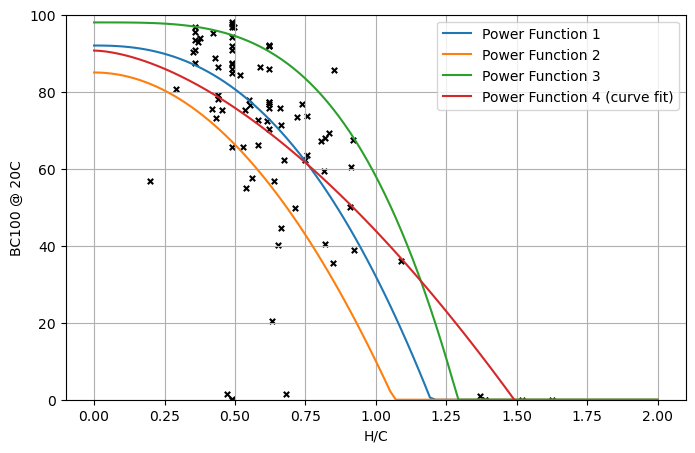

In [1390]:
import numpy as np

def power_function(x, M, a, c):
    """
    Calculate the values of a power function y = a * (x^b) with y-intercept at y = 0.
    
    Parameters:
        x (array-like): Input values.
        a (float): Scaling factor.
        b (float): Exponent.
    
    Returns:
        y (array-like): Output values.
    """
    return M - a * ( (x) ** c)

# Generate x values
x = np.linspace(0, 2, 100)

# Parameters for the power function
M = 92
a =50
c = 2.0
x0 = 0
# Calculate y values for the power function
y1 = power_function(x, M=92, a=60, c=2.4)
evaluateRegression(power_function, [92, 60, 2.4], vX1s[xx], vX1s[yy])

y2 = power_function(x, M=85, a=75, c=2,)
evaluateRegression(power_function, [85, 75, 2.], vX1s[xx], vX1s[yy])

y3 = power_function(x, M=98, a=40, c=3.5,)
evaluateRegression(power_function, [98, 40, 3.5], vX1s[xx], vX1s[yy])

y4 = power_function(x, M=90.69, a=46.86, c=1.653)
evaluateRegression(power_function, [90.69368842, 46.86111545,  1.65304213], vX1[xx], vX1[yy])


y1 = apply_cap(y1)
y2 = apply_cap(y2)
y3 = apply_cap(y3)
# Plot the power function
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
plt.plot(x, y1, label=f'Power Function 1')
plt.plot(x, y2, label=f'Power Function 2')
plt.plot(x, y3, label=f'Power Function 3')
plt.plot(x, y4, label=f'Power Function 4 (curve fit)')

plt.scatter(vX1[xx], vX1[yy], s=15, c='black', marker='x')
plt.xlabel('H/C')
plt.ylabel('BC100 @ 20C')
plt.ylim([0,100])
plt.legend()
plt.grid(True)
plt.show()


Model:  power_function
Params:  [90, 20, 5.5]
Chisqr:  32832.81733792372 
AIC:  472.2641368707371 
BIC:  479.29555313629817
MAE: 10.658078309842704
R2:  -0.016917783448687995 

Model:  power_function
Params:  [80, 30, 5]
Chisqr:  42347.31019063126 
AIC:  491.8588167056375 
BIC:  498.89023297119854
MAE: 18.42510585315092
R2:  -0.3116063836632681 

Model:  power_function
Params:  [98, 9, 7]
Chisqr:  40740.24667413593 
AIC:  488.8798068515699 
BIC:  495.911223117131
MAE: 10.71168499423204
R2:  -0.2618314450024899 

Model:  power_function
Params:  [90.65596582, 20.86158317, 3.49651224]
Chisqr:  34764.00000799578 
AIC:  507.11225431923265 
BIC:  514.3687761426224
MAE: 11.447895657072985
R2:  0.4634197048062415 



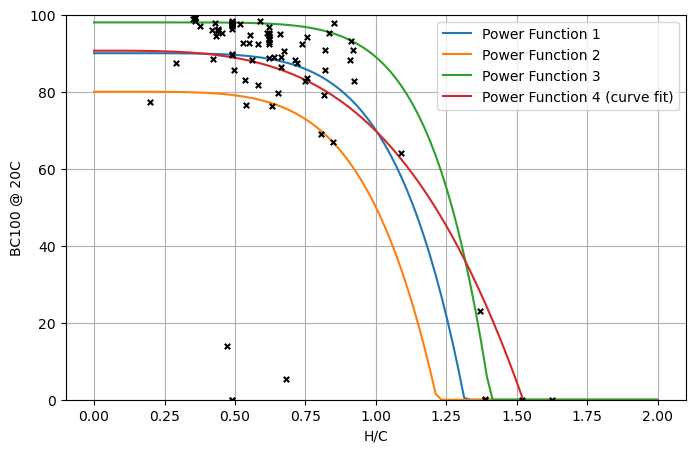

In [1398]:
import numpy as np

def power_function(x, M, a, c):
    """
    Calculate the values of a power function y = a * (x^b) with y-intercept at y = 0.
    
    Parameters:
        x (array-like): Input values.
        a (float): Scaling factor.
        b (float): Exponent.
    
    Returns:
        y (array-like): Output values.
    """
    return M - a * ( (x) ** c)

# Generate x values
x = np.linspace(0, 2, 100)

# Parameters for the power function
M = 92
a =50
c = 2.0
x0 = 0
# Calculate y values for the power function
y1 = power_function(x, M=90, a=20, c=5.5,)
evaluateRegression(power_function, [90, 20, 5.5], vX2s[xx], vX2s[yy])

y2 = power_function(x, M=80, a=30, c=5, )
evaluateRegression(power_function, [80, 30, 5], vX2s[xx], vX2s[yy])

y3 = power_function(x, M=98, a=9, c=7,)
evaluateRegression(power_function, [98, 9, 7], vX2s[xx], vX2s[yy])

y4 = power_function(x, M=90.6559, a=20.86, c=3.4965)
evaluateRegression(power_function, [90.65596582, 20.86158317,  3.49651224], vX2[xx], vX2[yy])


y1 = apply_cap(y1)
y2 = apply_cap(y2)
y3 = apply_cap(y3)
# Plot the power function
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
plt.plot(x, y1, label=f'Power Function 1')
plt.plot(x, y2, label=f'Power Function 2')
plt.plot(x, y3, label=f'Power Function 3')
plt.plot(x, y4, label=f'Power Function 4 (curve fit)')

plt.scatter(vX2[xx], vX2[yy], s=15, c='black', marker='x', zorder=100)
plt.xlabel('H/C')
plt.ylabel('BC100 @ 20C')
plt.ylim([0,100])
plt.legend()
plt.grid(True)
plt.show()


Model:  power_clip
Params:  [86.37774198 43.42204739  2.0551156 ]
Chisqr:  37131.99133635588 
AIC:  517.6790597819312 
BIC:  524.9715101784611
MAE: 13.87826553878076
R2:  0.4442283782058395 



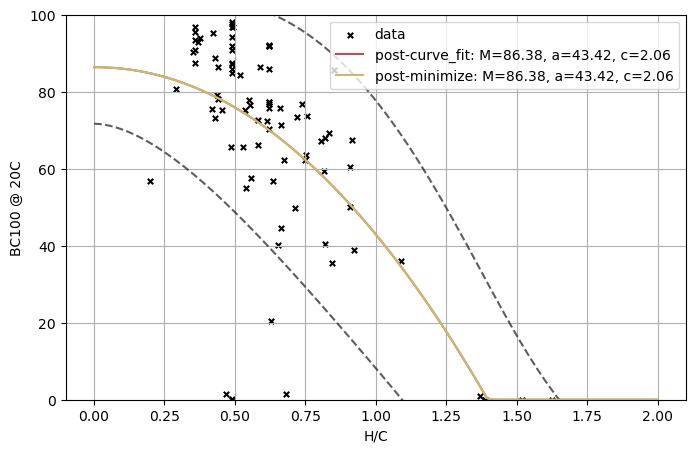

In [2237]:
def power_clip(x, M, a, c):
    y = M - a * ( (x) ** c)
    y = np.clip(y, 0.00, 100.0)
    return y

def std_power_clip(t, p_opt, p_cov):
    '''
    Given optimal parameters of a fit (p_opt), the covariance matrix of the fitted parameters (p_cov),
    calculate the propagated error through a power function, based on Talor series expansion of 1st order
    https://en.wikipedia.org/wiki/Propagation_of_uncertainty

    See definition of `power_clip` for order of parameters (the clip is not defined as an explicit parameter)
    '''
    M = p_opt[0]
    a = p_opt[1]
    c = p_opt[2]
    gX = np.array([1 , t**c , a*np.log(t)*(t**c) ]) # gradient of power_clip, for vector X
    std_f2 = gX.T @ p_cov @ gX
    return np.sqrt(std_f2)

def CF_lvl(lvl=90):
    CF = {95:1.96, 90:1.645, 85:1.440, 80:1.282}
    return CF[lvl]

def driver_func(x, xobs, yobs):
    # Evaluate the fit function with the current parameter estimates
    ynew = power_clip(xobs, *x)
    yerr = np.sum((ynew - yobs) ** 2)
    return yerr

plt.figure(figsize=(8, 5))
plt.scatter(vX1[xx], vX1[yy], s=15, c='black', marker='x', label="data")
xxx = np.linspace(0.001, 2, 100)
# Initial guess
p0 = [90.0, 20., 5.0]

# Fit curve using SCIPY CURVE_FIT
try:
    popt, pcov = scipy.optimize.curve_fit(power_clip, vX1[xx], vX1[yy], p0=p0)
except:
    print("Could not fit data using SCIPY curve_fit")
else:
    ynew = power_clip(xxx, *popt)
    plt.plot(xxx, ynew, 'r', label='post-curve_fit: M=%4.2f, a=%4.2f, c=%4.2f' % tuple(popt))
    plt.plot(xxx, power_func(xxx, *popt) + CF_lvl(90)* np.array([std_power_clip(xx, popt, pcov) for xx in xxx]), 'k--', alpha=0.7)
    plt.plot(xxx, power_func(xxx, *popt) - CF_lvl(90)* np.array([std_power_clip(xx, popt, pcov) for xx in xxx]), 'k--', alpha=0.7)
    # 95% confidence interval -> 1.96
    # 90% confidence interval -> 1.645
    # 85% -> 1.440
    # 80% -> 1.282
# Fit curve using SCIPY MINIMIZE
res = scipy.optimize.minimize(driver_func, p0, args=(vX1[xx], vX1[yy]), method='Nelder-Mead') # https://en.wikipedia.org/wiki/Nelder%E2%80%93Mead_method
ynw2 = power_clip(xxx, *res.x)
plt.plot(xxx, ynw2, 'y', label='post-minimize: M=%4.2f, a=%4.2f, c=%4.2f' % tuple(res.x))

evaluateRegression(power_clip, res.x, vX1[xx], vX1[yy])

plt.xlabel('H/C')
plt.ylabel('BC100 @ 20C')
plt.ylim([0,100])
plt.legend()
plt.grid(True)
plt.show()


Model:  power_clip
Params:  [87.39444652  8.20666237  7.06627617]
Chisqr:  32543.578147050433 
AIC:  501.63406245937506 
BIC:  508.89058428276485
MAE: 10.728150099508465
R2:  0.4976917856176182 



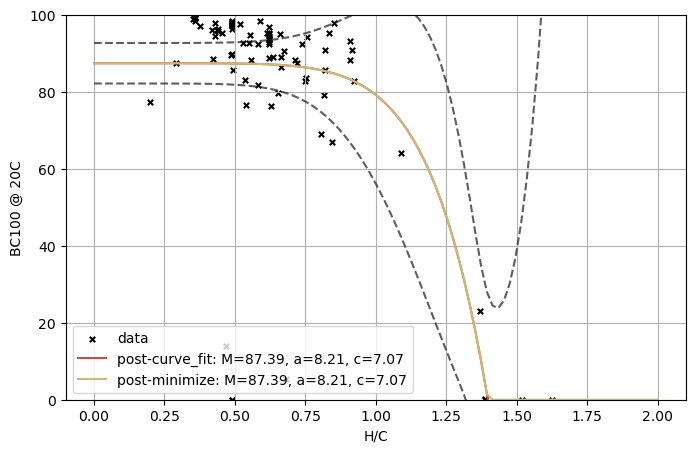

In [2239]:
def power_clip(x, M, a, c):
    y = M - a * ( (x) ** c)
    y = np.clip(y, 0.00, 100.0)
    return y

def driver_func(x, xobs, yobs):
    # Evaluate the fit function with the current parameter estimates
    ynew = power_clip(xobs, *x)
    yerr = np.sum((ynew - yobs) ** 2)
    return yerr

plt.figure(figsize=(8, 5))
plt.scatter(vX2[xx], vX2[yy], s=15, c='black', marker='x', label="data")
xxx = np.linspace(0.001, 2, 100)
# Initial guess
p0 = [90.0, 20., 5.0]

# Fit curve using SCIPY CURVE_FIT
try:
    popt, pcov = scipy.optimize.curve_fit(power_clip, vX2[xx], vX2[yy], p0=p0)
except:
    print("Could not fit data using SCIPY curve_fit")
else:
    ynew = power_func(xxx, *popt)
    plt.plot(xxx, ynew, 'r', label='post-curve_fit: M=%4.2f, a=%4.2f, c=%4.2f' % tuple(popt))
    plt.plot(xxx, power_func(xxx, *popt) + CF_lvl(95)* np.array([std_power_clip(xx, popt, pcov) for xx in xxx]), 'k--', alpha=0.7)
    plt.plot(xxx, power_func(xxx, *popt) - CF_lvl(95)* np.array([std_power_clip(xx, popt, pcov) for xx in xxx]), 'k--', alpha=0.7)

# Fit curve using SCIPY MINIMIZE
res = scipy.optimize.minimize(driver_func, p0, args=(vX2[xx], vX2[yy]), method='Nelder-Mead') # https://en.wikipedia.org/wiki/Nelder%E2%80%93Mead_method
ynw2 = power_clip(xxx, *res.x)
plt.plot(xxx, ynw2, 'y', label='post-minimize: M=%4.2f, a=%4.2f, c=%4.2f' % tuple(res.x))

evaluateRegression(power_clip, res.x, vX2[xx], vX2[yy])

plt.xlabel('H/C')
plt.ylabel('BC100 @ 20C')
plt.ylim([0,100])
plt.legend()
plt.grid(True)
plt.show()


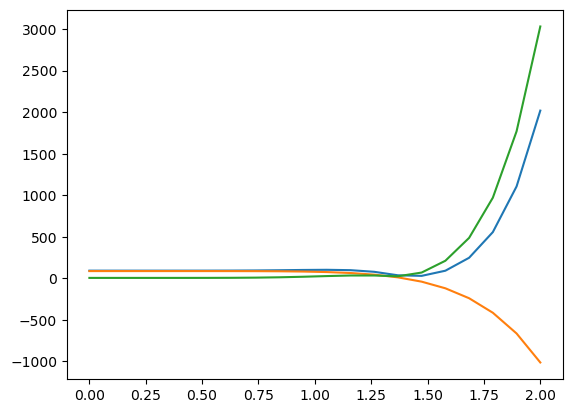

In [2255]:
xxxx = np.linspace(0.001, 2, 20)
A1 = power_func(xxxx, *popt2_powclim) + CF_lvl(95)* np.array([std_power_clip(xx, popt2_powclim, pcov2_powclip) for xx in xxxx])
A2 = power_func(xxxx, *popt2_powclim)
A3 = CF_lvl(95)* np.array([std_power_clip(xx, popt2_powclim, pcov2_powclip) for xx in xxxx])
plt.plot(xxxx, A1)
plt.plot(xxxx, A2)
plt.plot(xxxx, A3)

In [2259]:
def std_power_clip_breakdown(t, p_opt, p_cov):
    '''
    Given optimal parameters of a fit (p_opt), the covariance matrix of the fitted parameters (p_cov),
    calculate the propagated error through a power function, based on Talor series expansion of 1st order
    https://en.wikipedia.org/wiki/Propagation_of_uncertainty

    See definition of `power_clip` for order of parameters (the clip is not defined as an explicit parameter)
    '''
    M = p_opt[0]
    a = p_opt[1]
    c = p_opt[2]
    gX = np.array([1 , t**c , a*np.log(t)*(t**c) ]) # gradient of power_clip, for vector X
    std_f2 = gX.T @ p_cov @ gX
    return np.sqrt(std_f2), gX

std_power_clip_breakdown(2, popt2_powclim, pcov2_powclip)

(1546.2229479660912, array([  1.        , 133.99986167, 762.29579429]))

### Using scipy.curve_fit or scipy.minimize

See. https://stackoverflow.com/questions/60954193/can-fit-curve-with-scipy-minimize-but-not-with-scipy-curve-fit



Could not fit data using SCIPY curve_fit


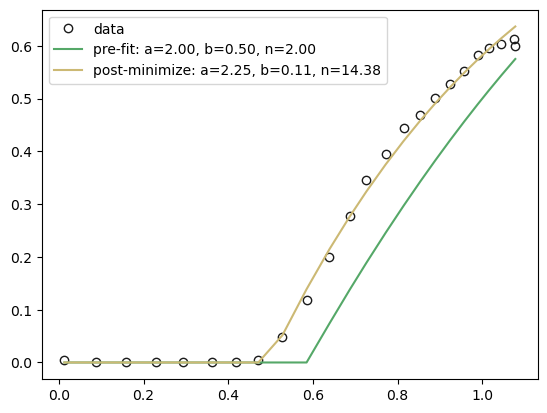

In [1430]:
import numpy as np
import scipy.optimize
import matplotlib.pyplot as plt

# Driver function for scipy.minimize

def driver_func(x, xobs, yobs):
    # Evaluate the fit function with the current parameter estimates
    ynew = myfunc(xobs, *x)
    yerr = np.sum((ynew - yobs) ** 2)
    return yerr

# Define function
def myfunc(x, a, b, n):
    y = 1.0 - a * np.power(1.0 - b * x, n) 
    y = np.clip(y, 0.00, None )
    return y

if __name__ == "__main__":

    # Initialise data
    yobs = np.array([0.005, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.004, 
                    0.048, 0.119, 0.199, 0.277, 0.346, 0.395, 0.444, 0.469, 
                    0.502, 0.527, 0.553, 0.582, 0.595, 0.603, 0.612, 0.599])
    xobs = np.array([0.013, 0.088, 0.159, 0.230, 0.292, 0.362, 0.419, 0.471,
                    0.528, 0.585, 0.639, 0.687, 0.726, 0.772, 0.814, 0.854,
                    0.889, 0.924, 0.958, 0.989, 1.015, 1.045, 1.076, 1.078])

    # Initial guess
    p0 = [2.0, 0.5, 2.0]

    # Check fit pre-regression
    yold = myfunc(xobs, *p0)
    plt.plot(xobs, yobs, 'ko', label='data', fillstyle='none')
    plt.plot(xobs, yold, 'g-', label='pre-fit: a=%4.2f, b=%4.2f, n=%4.2f' % tuple(p0))

    # Fit curve using SCIPY CURVE_FIT
    try:
        popt, pcov = scipy.optimize.curve_fit(myfunc, xobs, yobs, p0=p0)
    except:
        print("Could not fit data using SCIPY curve_fit")
    else:
        ynew = myfunc(xobs, *popt)
        plt.plot(xobs, ynew, 'r-', label='post-curve_fit: a=%4.2f, b=%4.2f, n=%4.2f' % tuple(popt))

    # Fit curve using SCIPY MINIMIZE
    res = scipy.optimize.minimize(driver_func, p0, args=(xobs, yobs), method='Nelder-Mead')
    ynw2 = myfunc(xobs, *res.x)
    plt.plot(xobs, ynw2, 'y-', label='post-minimize: a=%4.2f, b=%4.2f, n=%4.2f' % tuple(res.x))

    plt.legend()
    plt.show()

C:\Users\Elias S. Azzi\AppData\Local\Temp\ipykernel_5104\3946927046.py:19: RuntimeWarning: overflow encountered in power
  y = 1.0 - a * np.power( 1.0 - b * x, n )


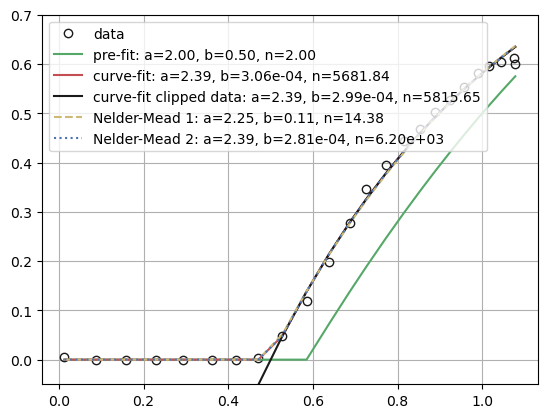

In [1431]:
import numpy as np
import scipy.optimize
import matplotlib.pyplot as plt

# Driver function for scipy.minimize
def driver_func( x, xobs, yobs ):
    # Evaluate the fit function with the current parameter estimates
    ynew = myfunc( xobs, *x)
    yerr = np.sum( ( ynew - yobs ) ** 2 )
    return yerr

# Define functions
def myfunc( x, a, b, n ):
    y = 1.0 - a * np.power( 1.0 - b * x, n ) 
    y = np.clip( y, 0.00, None )
    return y

def myfunc_noclip( x, a, b, n ):
    y = 1.0 - a * np.power( 1.0 - b * x, n ) 
    return y

if __name__ == "__main__":

    # Initialise data
    yobs = np.array([
        0.005, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.004, 
        0.048, 0.119, 0.199, 0.277, 0.346, 0.395, 0.444, 0.469, 
        0.502, 0.527, 0.553, 0.582, 0.595, 0.603, 0.612, 0.599
    ])
    xobs = np.array([
        0.013, 0.088, 0.159, 0.230, 0.292, 0.362, 0.419, 0.471,
        0.528, 0.585, 0.639, 0.687, 0.726, 0.772, 0.814, 0.854,
        0.889, 0.924, 0.958, 0.989, 1.015, 1.045, 1.076, 1.078
    ])

    # Clipped data
    ymin = 0.01
    xclp = xobs[ np.where( yobs >= ymin ) ]
    yclp = yobs[ np.where( yobs >= ymin ) ]

    # Initial guess
    p0 = [ 2.0, 0.5, 2.0 ]

    # Check fit pre-regression
    yold = myfunc( xobs, *p0 )
    plt.plot( xobs, yobs, 'ko', label='data', fillstyle='none' )
    plt.plot( xobs, yold, 'g-', label='pre-fit: a=%4.2f, b=%4.2f, n=%4.2f' % tuple( p0 ) )

    # Fit curve using SCIPY CURVE_FIT
    try:
        popt, pcov = scipy.optimize.curve_fit( myfunc, xobs, yobs, p0=p0, maxfev=5000 )
    except:
        print("Could not fit data using SCIPY curve_fit")
    else:
        ynew = myfunc( xobs, *popt )
        plt.plot( xobs, ynew, 'r-', label="curve-fit: a=%4.2f, b=%4.2e, n=%4.2f" % tuple( popt ) )

    # Fit curve using SCIPY CURVE_FIT on clipped data
    p0 = [ 1.75, 1e-4, 1e3 ]
    try:
        popt, pcov = scipy.optimize.curve_fit( myfunc_noclip, xclp, yclp, p0=p0 )
    except:
        print("Could not fit data using SCIPY curve_fit")
    else:
        ynew = myfunc_noclip( xobs, *popt )
        plt.plot( xobs, ynew, 'k-', label="curve-fit clipped data: a=%4.2f, b=%4.2e, n=%4.2f" % tuple( popt ) )

    # Fit curve using SCIPY MINIMIZE
    p0 = [ 2.0, 0.5, 2.0 ]
    res = scipy.optimize.minimize( driver_func, p0, args=( xobs, yobs ), method='Nelder-Mead' )
    # ~res = scipy.optimize.minimize(driver_func, p0, args=(xobs, yobs), method='CG')
    ynw2 = myfunc( xobs, *res.x )
    plt.plot( xobs, ynw2, 'y--', label='Nelder-Mead 1: a=%4.2f, b=%4.2f, n=%4.2f' % tuple( res.x ) )
    p0 = [ 2.4, 3.6e-4, 5.6e3 ]
    res = scipy.optimize.minimize( driver_func, p0, args=( xobs, yobs ), method='Nelder-Mead' )
    # ~res = scipy.optimize.minimize(driver_func, p0, args=(xobs, yobs), method='CG')
    ynw2 = myfunc( xobs, *res.x )
    plt.plot( xobs, ynw2, 'b:', label='Nelder-Mead 2: a=%4.2f, b=%4.2e, n=%4.2e' % tuple( res.x ) )

    plt.legend( loc=2 )
    plt.ylim( -0.05, 0.7 )
    plt.grid()
    plt.show()

### Rodgriues2023 - reproducing with Woolf data

In [1429]:
# Make an attempt to reproduce curve fit from Rodrigues2023, with Woolf data + Aubertin2021, using scipy.curve_fit or scipy.minimize

## Other models (multi-variate, non-linear, multi-target)

Simply do:
- subset of data Exp / Power, with/without exclusions
- one shallow decision tree attempting to classify the dataset by classes of BC10/50/100/200 (with a multi-target?)
- one shallow random forest attempting to classify the dataset by classes of BC10/50/100/200 (with a multi-target?)
- name the important features; are they as we expect?

In [294]:
# used
from sklearn.compose import make_column_selector as selector
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import make_pipeline

from sklearn.preprocessing import StandardScaler, RobustScaler, LabelEncoder, OneHotEncoder
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, roc_curve, explained_variance_score

from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeClassifier, plot_tree, export_text
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV, train_test_split

def r2a(r2, n, p):
    ''' R2 adjusted, cf. https://en.wikipedia.org/wiki/Coefficient_of_determination#Adjusted_R2 
    Calculates the adjusted R2 score, 
        - where n is the number of observations, and 
        - p is the number of features
    Compared to R2, R2a adds a penalty for model complexity / number of features
    '''
    return 1 - (1-r2)*(n-1)/(n-p-1)

In [295]:
# Calculation of various BC_TH_TS and append columns to metadata dfs
ML_S2 = metadata_S2_EDA.copy() # still contains NaNs and txt
ML_S3 = metadata_S3_EDA.copy() # still contains NaNs

ML_S2 = ML_S2.replace(['na', 'nan', ''], np.nan)
ML_S3 = ML_S3.replace(['na', 'nan', ''], np.nan)

In [296]:
# Calculation of various BC_TH_TS and append columns to metadata dfs
ML_S2 = metadata_S2_EDA.copy() # still contains NaNs and txt
ML_S3 = metadata_S3_EDA.copy() # still contains NaNs

ML_S2 = ML_S2.replace(['na', 'nan', ''], np.nan)
ML_S3 = ML_S3.replace(['na', 'nan', ''], np.nan)

TS = np.arange(0, 30, 5)
TH = [1, 2, 5, 10, 20, 30, 40, 50, 75, 100, 200, 500]
MT_S2 = pd.DataFrame(index=ML_S2.index)
MT_S3 = pd.DataFrame(index=ML_S3.index)

for targetTemperature, timeHorizon in itertools.product(TS, TH):
    #anyS2_bestfit_Q10, _, _ = bs.applyTempCorr(S2_bestfit, metadata, tTs=targetTemperature, TH=100, method=bs.fT_Woolf)
    #anyS2_bestfit_sQ10, _, _ = bs.applyTempCorr(S2_bestfit, metadata, tTs=targetTemperature, TH=100, method=bs.fT_WoolfStepwise)
    _, _, newBC_TH_TS = bs.applyTempCorr(S2_bestfit, metadata, tTs=targetTemperature, TH=timeHorizon, method=bs.fT_DataFit)
    MT_S2['BC_TS_'+str(targetTemperature)+'_TH_'+str(timeHorizon)] = newBC_TH_TS
    
    #anyS3_bestfit_Q10, _, _ = bs.applyTempCorr(S3_bestfit, metadata, tTs=targetTemperature, TH=100, method=bs.fT_Woolf)
    #anyS3_bestfit_sQ10, _, _ = bs.applyTempCorr(S3_bestfit, metadata, tTs=targetTemperature, TH=100, method=bs.fT_WoolfStepwise)
    _, _, newBC_TH_TS = bs.applyTempCorr(S3_bestfit, metadata, tTs=targetTemperature, TH=timeHorizon, method=bs.fT_DataFit)
    MT_S3['BC_TS_'+str(targetTemperature)+'_TH_'+str(timeHorizon)] = newBC_TH_TS
    

In [297]:
# metadata, remove redundant columns and bridge gaps
def reprocess_metadata_forMLEDA(X): 
    info_cols = ['ID_art', 'NameObs', 'Replicates','Biomass', 'Pyrolysis', 'BiomassLignin', 'Soil type',
             'SoilMoisture_Absolute', 'SoilOrigin', 'SoilGeolocation', 'TotalFluxMeasurement', 'BiocharFluxDetermination', 'OtherIncubationDescription', 'AssociatedControl',
             'Cultivated', 'ID_Lehmann2019', 'ID_Woolf2021', 'ID_Lehmann2021',
             ]
    
    col_to_drop = ['pH_bc-soil', 'Magnesium', 'Potassium', 'Phosphorous', 'ParticleSize', 'BulkDensity',
                  'TrueDensity', 'OxidationH2O2', 'BiocharYield', 'δ ¹³C biochar',
                  'δ ¹³C soil', 'FixedCarbon', 'VolatileMatter', 'pH_CaCl2', 'CEC', 'SA_N2', 'SA_CO2', 'Sulphur', 'ApplicationRate',]

    col_categorical = ['BiomassClass', 'PyrolysisClass', 'LabField', 'AuthorDate']

    col_numerical = ['HHT', 'RT', 'HR', 'Soil clay content', 'Soil sand content', 'Soil silt content', 'Soil organic matter content',
                    'SoilMoisture_WHC', 'pH_soil', 'IncubationTemperature', 'IncubationDuration', 
                    'Ash550', 'Ash700', 'Carbon', 'Carbon, organic', 'Hydrogen', 'Nitrogen',
                    'Oxygen', 'H/C_org', 'H/C_tot', 'O/C_org', 'C/N', 'pH_H2O',
                    ]

    # drop irrelevant columns
    X.drop(info_cols, axis=1, inplace=True, errors='ignore')
    opf, opf_x, opf_y = bs.obs_per_feat(X)
    print(X.isna().sum().sum(), "remaining nans, in various columns")
    
    X.drop(col_to_drop, axis=1, inplace=True, errors='ignore') # too many gaps
    
    # count gaps remaining, per columns, for this model set 
    print(X.isna().sum().sum(), "remaining nans, in various columns")

    # 'SoilMoisture_WHC' : bridge gap, with mode; rationale: most lab experiment used 60%, if different, it is usually reported
    c = 'SoilMoisture_WHC'
    print("Strategy for:", c)
    print("\tMode:", X[c].mode()[0], "will be replaced in", X[c].isna().sum(), "rows")
    X[c].fillna(X[c].mode()[0], inplace=True)
    X[c].replace(['788.4 mm/yr', '1109.4 mm/yr'], X[c].mode()[0], inplace=True)

    # 'pH_soil' : bridge gap, with mode; rationale: for Zimmerman (sand), 1 of Kuzyakov (loess), 
    c = 'pH_soil'
    print("Strategy for:", c)
    print("\tMode:", X[c].mode()[0], "will be replaced in", X[c].isna().sum(), "rows")
    X[c].fillna(X[c].mode()[0], inplace=True)

    # 'pH_H2O' :  biochar pH in water, bridge gap, with mode; rationale: for Zimmerman  
    c = 'pH_H2O'
    print("Strategy for:", c)
    print("\tMode:", X[c].mode()[0], "will be replaced in", X[c].isna().sum(), "rows")
    X[c].fillna(X[c].mode()[0], inplace=True)

    # drop redundant columns, where mergers have already been added
    merged = ['Ash550', 'Ash700', 'Carbon', 'Carbon, organic', 'Hydrogen', 'Oxygen']
    X.drop(merged, axis=1, inplace=True, errors='ignore') 
    X.drop(['H/C_org', 'H/C_tot'], axis=1, inplace=True, errors='ignore')

    # fill all the rest with mode; slightly brutal
    print(X.isna().sum().sum(), "remaining nans, in various columns, filled with mode")
    X.fillna(X.mode().loc[0,:], inplace=True)

    X.drop(['Total C lost', 'Last measured decay rate', 'HO/C', 'AuthorDate'], axis=1, inplace=True, errors='ignore')
    
    opf, opf_x, opf_y = bs.obs_per_feat(X)
    
    return X

# count gaps remaining, per columns, for this model set 
#print(X.isna().sum(axis=0).sum())


2110 remaining nans, in various columns
475 remaining nans, in various columns
Strategy for: SoilMoisture_WHC
	Mode: 0.6 will be replaced in 8 rows
Strategy for: pH_soil
	Mode: 6.8 will be replaced in 41 rows
Strategy for: pH_H2O
	Mode: 9.96 will be replaced in 38 rows
207 remaining nans, in various columns, filled with mode
2174 remaining nans, in various columns
477 remaining nans, in various columns
Strategy for: SoilMoisture_WHC
	Mode: 0.6 will be replaced in 8 rows
Strategy for: pH_soil
	Mode: 6.8 will be replaced in 41 rows
Strategy for: pH_H2O
	Mode: 8.64 will be replaced in 38 rows
209 remaining nans, in various columns, filled with mode


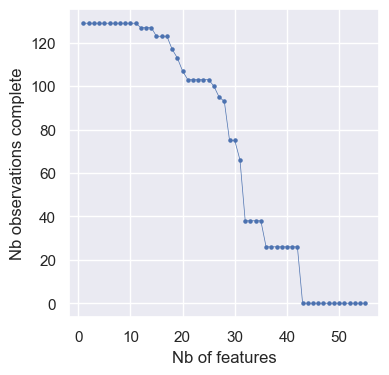

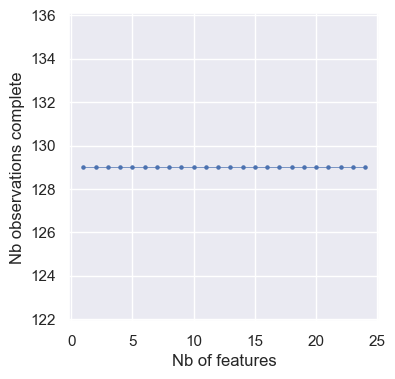

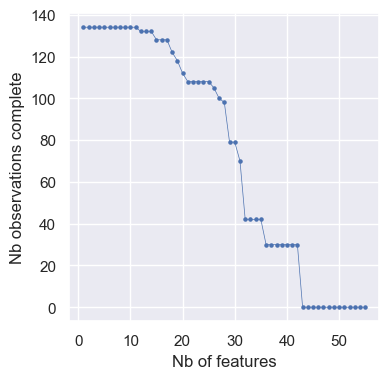

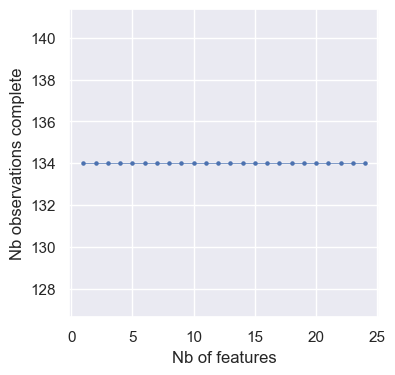

In [298]:
MX_S3 = reprocess_metadata_forMLEDA(ML_S3)
MX_S2 = reprocess_metadata_forMLEDA(ML_S2)

In [301]:
print(list(MX_S3.columns), list(MT_S3.columns))

['BiomassClass', 'PyrolysisClass', 'HHT', 'RT', 'HR', 'Soil clay content', 'Soil sand content', 'Soil silt content', 'Soil organic matter content', 'SoilMoisture_WHC', 'pH_soil', 'LabField', 'IncubationTemperature', 'IncubationDuration', 'Nitrogen', 'O/C_org', 'C/N', 'pH_H2O', 'Ash', 'Carbon_daf', 'Carbon, organic_daf', 'Hydrogen_daf', 'Oxygen_daf', 'H/C_all'] ['BC_TS_0_TH_1', 'BC_TS_0_TH_2', 'BC_TS_0_TH_5', 'BC_TS_0_TH_10', 'BC_TS_0_TH_20', 'BC_TS_0_TH_30', 'BC_TS_0_TH_40', 'BC_TS_0_TH_50', 'BC_TS_0_TH_75', 'BC_TS_0_TH_100', 'BC_TS_0_TH_200', 'BC_TS_0_TH_500', 'BC_TS_5_TH_1', 'BC_TS_5_TH_2', 'BC_TS_5_TH_5', 'BC_TS_5_TH_10', 'BC_TS_5_TH_20', 'BC_TS_5_TH_30', 'BC_TS_5_TH_40', 'BC_TS_5_TH_50', 'BC_TS_5_TH_75', 'BC_TS_5_TH_100', 'BC_TS_5_TH_200', 'BC_TS_5_TH_500', 'BC_TS_10_TH_1', 'BC_TS_10_TH_2', 'BC_TS_10_TH_5', 'BC_TS_10_TH_10', 'BC_TS_10_TH_20', 'BC_TS_10_TH_30', 'BC_TS_10_TH_40', 'BC_TS_10_TH_50', 'BC_TS_10_TH_75', 'BC_TS_10_TH_100', 'BC_TS_10_TH_200', 'BC_TS_10_TH_500', 'BC_TS_15_TH

In [302]:
print(len(MX_S3), len(MT_S3))

129 129


### Random forest and feature importance

In [299]:
def pick_model(k, df, fX, fY, sets):
    
    mp = { lol.removeprefix("randomforestregressor__"):v for lol,v in df.loc[k,:]['model_params'].items()}

    numerical_columns_selector = selector(dtype_exclude=object)
    categorical_columns_selector = selector(dtype_include=object)
    numerical_columns = numerical_columns_selector(fX)
    categorical_columns = categorical_columns_selector(fX)
    categorical_preprocessor = OneHotEncoder(handle_unknown="ignore") # Here, could do a LabelEncoder() as well
    numerical_preprocessor = RobustScaler() #StandardScaler() # RobustScaler() can also do robustscaler, dealing with outliers differently
    preprocessor = ColumnTransformer([
        ('one-hot-encoder', categorical_preprocessor, categorical_columns),
        ('standard_scaler', numerical_preprocessor, numerical_columns)])

    pipeRF = make_pipeline(preprocessor, RandomForestRegressor(**mp, random_state=None))
    pipeRF.fit(fX, fY)
    return pipeRF

def plot_RF_model(rf, xs, ycols=0, ylabel='', fig=None, ax=None, figsize=(10,3), fX=None, fY=None, sliceOn=1):
    '''
    Plots the outcome of a trained random forest regressor (rf) over a given feature space (xs), selecting which target variable to plot with (ys)
    If xs has 1 dimension (1 feature), then it's a simple 2D plot.
    If xs has 2 dimensions, and both are continuous variables; then it's a 2D plot with permanence as color
    If xs has 3 dimensions, and 1 of them is a discrete variable; then, we can plot as a 2D plot, for each value of the discrete variable
    ...
    
    Input:
    - rf: a sklearn regressor, with the rf.predict() method
    - xs: order of variables, must be same as in rf.features_names_in_ , a list of np.arrays
    - ys: which target variables to select, if several ones; default, first one.
    '''
    feature_names_in = rf.feature_names_in_ #list of feature names input
    print('feature_names_in', feature_names_in)
    if not isinstance(ycols, list):
        ycols = [ycols]
        ylabel = [ylabel]
    
    if isinstance(xs, pd.DataFrame):        
        if ax is None:
            fig, ax = plt.subplots(1,1, figsize=figsize)    
        ys = rf.predict(xs)
        
        
        [ax.plot(xs, ys[:,y], label=yl) for y, yl  in zip(ycols, ylabel)]
        
        ax.set_xlabel('feature: '+feature_names_in[0])
        ax.set_ylabel('prediction')
        plt.legend();
        if fX is not None:
            ax.scatter(fX, fY, alpha=0.5)
        
    if isinstance(xs, list) and len(xs) == 2:
        if ax is None:
            fig, ax = plt.subplots(1, len(ycols), figsize=figsize) # one plot for each target variable
        for i, (y, yl) in enumerate(zip(ycols, ylabel)):
            # heatmap and contours
            X,Y = np.meshgrid(xs[0], xs[1])
            Z = np.zeros(shape=X.shape)
            for j in range(X.shape[0]):
                mesh = pd.DataFrame({feature_names_in[0]:X[j], feature_names_in[1]:Y[j]})
                Z[j,:] = rf.predict(mesh)[:,y] # get only one column # shape 1-dim array, of length same as mesh.shape[0]
            
            im = ax[i].pcolormesh(X,Y,Z, cmap= plt.cm.get_cmap('jet', 10), alpha=0.7, vmin=0, vmax=100) #PiYG_r seismic_r
            cbar = fig.colorbar(mappable=im, ax=ax[i])
            cbar.set_label('prediction: '+yl, rotation=270, labelpad=20)
            ax[i].set_xlabel('feature: '+feature_names_in[0])
            ax[i].set_ylabel('feature: '+feature_names_in[1])

            if fX is not None:
                ax[i].scatter(fX.iloc[:,0] , fX.iloc[:,1], c=fY[i], alpha=0.9, cmap=plt.cm.get_cmap('jet', 10), vmin=0, vmax=100, 
                             edgecolors="white")
            #contour
            #class nf(float):
            #    def __repr__(self):
            #        s = f'{self:.1f}'
            #        return f'{self:.0f}' if s[-1] == '0' else s
            #CS = ax[i].contour(Y, X, Z, [0, 50, 80], colors=['red','red', 'red']) # Y, X, Z 
            #CS.levels = [nf(val) for val in CS.levels]

            # Label levels with specially formatted floats
            #if plt.rcParams["text.usetex"]:
            #    fmt = r'%r '
            #else:
            #    fmt = '%r'
            #ax[i].clabel(CS, CS.levels, inline=True, fmt=fmt, fontsize=14)
        fig.tight_layout(pad=1.4)
    
    if isinstance(xs, list) and len(xs) == 3:
        # if 1 is not a float...
        oneCat = False
        for c, x in enumerate(xs):
            if isinstance(x[0], str):
                oneCat = True
                cx = c
        if oneCat:
            if ax is None:
                fig, ax = plt.subplots(len(set(xs[cx])), len(ycols), figsize=figsize) # rows: each category, column: each target variable
            for u, c in enumerate(set(xs[cx])):
                for i, (y, yl) in enumerate(zip(ycols, ylabel)):
                    # heatmap and contours
                    xs.pop(cx)
                    X,Y = np.meshgrid(xs[0], xs[1])
                    Z = np.zeros(shape=X.shape)
                    for j in range(X.shape[0]):
                        mesh = pd.DataFrame({feature_names_in[0]:X[j], feature_names_in[1]:Y[j], feature_names_in[2]: np.repeat(c, X.shape[1])})
                        Z[j,:] = rf.predict(mesh)[:,y] # get only one column # shape 1-dim array, of length same as mesh.shape[0]
                    
                    im = ax[u, i].pcolormesh(X,Y,Z, cmap= plt.cm.get_cmap('jet', 10), alpha=0.7, vmin=0, vmax=100) #PiYG_r seismic_r
                    cbar = fig.colorbar(mappable=im, ax=ax[i])
                    cbar.set_label('prediction: '+yl, rotation=270, labelpad=20)
                    ax[u, i].set_xlabel('feature: '+feature_names_in[0])
                    ax[u, i].set_ylabel('feature: '+feature_names_in[1])

                    if fX is not None:
                        ax[u, i].scatter(fX.iloc[:,0] , fX.iloc[:,1], c=fY[i], alpha=0.9, cmap=plt.cm.get_cmap('jet', 10), vmin=0, vmax=100, 
                                     edgecolors="white")

        else: 
            # 3 continuous variables, plot slices of the 3rd dimension.
            # the slices are made on the 3 dimension: thus limit nb of slices to reasonable number
            if ax is None:
                fig, ax = plt.subplots(min(5, len(xs[sliceOn])), len(ycols), figsize=figsize) # rows: each category, column: each target variable
            
            for u, c in enumerate(xs[sliceOn]):
                # u: row to plot to
                # c: value of 3rd dimension
                for i, (y, yl) in enumerate(zip(ycols, ylabel)):
                    X,Y = np.meshgrid(xs[0], xs[2])
                    Z = np.zeros(shape=X.shape)
                    for j in range(X.shape[0]):
                        mesh = pd.DataFrame({feature_names_in[0]:X[j], feature_names_in[2]:Y[j], feature_names_in[1]: np.repeat(c, X.shape[1]) })
                        Z[j,:] = rf.predict(mesh)[:,y]
                    
                    im = ax[u, i].pcolormesh(X,Y,Z, cmap= plt.cm.get_cmap('jet', 10), alpha=0.7, vmin=0, vmax=100) #PiYG_r seismic_r
                    #cbar = fig.colorbar(mappable=im, ax=ax[i])
                    #cbar.set_label('prediction: '+yl, rotation=270, labelpad=20)
                    ax[u, i].set_xlabel('feature: '+feature_names_in[0])
                    ax[u, i].set_ylabel('feature: '+feature_names_in[2])
                    ax[u, i].annotate('Ash: '+str(c[0]), xy=(0.5, 1))
            
            fig.tight_layout(pad=1.4)

        print("Not yet developped")
    # for 3D - slices through 3rd dimension - volume plot
    # https://matplotlib.org/stable/gallery/event_handling/image_slices_viewer.html

In [304]:
hyper_param_grid_RF = {
    'randomforestregressor__n_estimators': [50, 100, 300], # nb of trees in RF
    'randomforestregressor__max_features': ['log2'], # nb of features to consider at each split
    'randomforestregressor__max_depth': [2, 3, 4, 5], # None = default value
    'randomforestregressor__min_samples_split': [2, 5, 10],# min number of data points placed in a node before the node is split
    'randomforestregressor__min_samples_leaf': [1, 2, 4, 10], # min number of data points allowed in a leaf node
    'randomforestregressor__bootstrap': [True, False], # method for sampling data points (with or without replacement)
}

# cross-validation parameters
cross_validation_folds = 2

In [300]:
featuresets_manual = [
    ('H/C_all',),('HHT',),('Nitrogen',),('pH_H2O',), ('Ash',), ('Carbon_daf',), ('Carbon, organic_daf',), ('Hydrogen_daf',),('Oxygen_daf',),('O/C_org',), ('BiomassClass', 'HHT'), ('BiomassClass', 'Carbon_daf'), ('BiomassClass', 'H/C_all'),('HHT', 'Nitrogen'), ('HHT', 'O/C_org'), ('HHT', 'pH_H2O'), ('HHT', 'Ash'), ('HHT', 'Carbon_daf'), ('HHT', 'Carbon, organic_daf'),('HHT', 'Hydrogen_daf'), ('HHT', 'Oxygen_daf'), ('pH_H2O', 'H/C_all'), ('Ash', 'H/C_all'),('Carbon_daf', 'H/C_all'),('Carbon, organic_daf', 'H/C_all'),('Hydrogen_daf', 'H/C_all'),('Oxygen_daf', 'H/C_all'),('Soil clay content', 'Carbon, organic_daf'), ('Soil clay content', 'Hydrogen_daf'), ('Soil clay content', 'H/C_all'),('Soil organic matter content', 'Carbon, organic_daf'), ('Soil organic matter content', 'Hydrogen_daf'),('Soil organic matter content', 'H/C_all'), ('SoilMoisture_WHC', 'Carbon, organic_daf'),('SoilMoisture_WHC', 'Hydrogen_daf'),('SoilMoisture_WHC', 'H/C_all'),
    ('H/C_all', 'PyrolysisClass'), ('Carbon, organic_daf', 'Hydrogen_daf', 'Oxygen_daf',),
    ('BiomassClass', 'PyrolysisClass', 'HHT', 'RT', 'HR',
       'Soil clay content', 'Soil sand content', 'Soil silt content',
       'Soil organic matter content', 'SoilMoisture_WHC', 'pH_soil',
       'LabField', 'IncubationTemperature', 'IncubationDuration', 'Nitrogen',
       'O/C_org', 'C/N', 'pH_H2O', 'Ash', 'Carbon_daf', 'Carbon, organic_daf',
       'Hydrogen_daf', 'Oxygen_daf', 'H/C_all'),
]
featuresets_manual = {i:k for i,k in enumerate(featuresets_manual)}

featuresets_manual

{0: ('H/C_all',),
 1: ('HHT',),
 2: ('Nitrogen',),
 3: ('pH_H2O',),
 4: ('Ash',),
 5: ('Carbon_daf',),
 6: ('Carbon, organic_daf',),
 7: ('Hydrogen_daf',),
 8: ('Oxygen_daf',),
 9: ('O/C_org',),
 10: ('BiomassClass', 'HHT'),
 11: ('BiomassClass', 'Carbon_daf'),
 12: ('BiomassClass', 'H/C_all'),
 13: ('HHT', 'Nitrogen'),
 14: ('HHT', 'O/C_org'),
 15: ('HHT', 'pH_H2O'),
 16: ('HHT', 'Ash'),
 17: ('HHT', 'Carbon_daf'),
 18: ('HHT', 'Carbon, organic_daf'),
 19: ('HHT', 'Hydrogen_daf'),
 20: ('HHT', 'Oxygen_daf'),
 21: ('pH_H2O', 'H/C_all'),
 22: ('Ash', 'H/C_all'),
 23: ('Carbon_daf', 'H/C_all'),
 24: ('Carbon, organic_daf', 'H/C_all'),
 25: ('Hydrogen_daf', 'H/C_all'),
 26: ('Oxygen_daf', 'H/C_all'),
 27: ('Soil clay content', 'Carbon, organic_daf'),
 28: ('Soil clay content', 'Hydrogen_daf'),
 29: ('Soil clay content', 'H/C_all'),
 30: ('Soil organic matter content', 'Carbon, organic_daf'),
 31: ('Soil organic matter content', 'Hydrogen_daf'),
 32: ('Soil organic matter content', 'H/C_al

In [307]:
trained_models = {'RFs':{
                        'feature_set':[],
                        'model_params':[],
                        'RMSE': [],
                        'expvar':[],
                        'r2':[],
                        'r2a':[],
                        },
                  'BRTs':{
                        'feature_set':[],
                        'model_params':[],
                        'RMSE': [],
                        'expvar':[],
                        'r2':[],
                        'r2a':[],
                        }
                 }
N_SEED = 42
train_RF = True
for k, feature_set in featuresets_manual.items(): #feature_sets.items():
    #if k > 0:
    #     break
    toDrop = sAllCriteria | {42, 46, 47, 48} # adding extra 3 outliers, cf linear models
    drop = True # droping outliers from model
    
    # feature selection, normalisation, one-hot encoding
    fX = MX_S3[list(featuresets_manual[k])].copy()
    fY = MT_S3.copy()
    
    if drop:
        fX.drop(toDrop, errors='ignore', inplace=True)
        fY.drop(toDrop, errors='ignore', inplace=True)

    numerical_columns_selector = selector(dtype_exclude=object)
    categorical_columns_selector = selector(dtype_include=object)

    numerical_columns = numerical_columns_selector(fX)
    categorical_columns = categorical_columns_selector(fX)

    categorical_preprocessor = OneHotEncoder(handle_unknown="ignore") # Here, could do a LabelEncoder() as well
    numerical_preprocessor = RobustScaler() #StandardScaler() # RobustScaler() can also do robustscaler, dealing with outliers differently

    preprocessor = ColumnTransformer([
        ('one-hot-encoder', categorical_preprocessor, categorical_columns),
        ('standard_scaler', numerical_preprocessor, numerical_columns)]
    , remainder='passthrough')

    # Random Forest - grid search with CV
    if train_RF:
        
        pipeRF = make_pipeline(preprocessor, RandomForestRegressor(random_state=N_SEED))
        
        rf_rd = GridSearchCV(estimator=pipeRF,
                            param_grid=hyper_param_grid_RF,
                            cv=cross_validation_folds, # k-fold cross validation, 3, 5, 10
                            scoring='neg_mean_squared_error',
                            refit=True,# so that best estimator is retrained on the whole dataset
                            verbose=1,
                            n_jobs=4,
                            )

        rf_rd.fit(fX, fY)
        Y_test_predicted = rf_rd.predict(fX)

        ## calculate & save performance metrics
        trained_models['RFs']['feature_set'].append(k)
        trained_models['RFs']['model_params'].append(rf_rd.best_params_)
        trained_models['RFs']['RMSE'].append( np.sqrt(mean_squared_error(fY, Y_test_predicted)) )
        trained_models['RFs']['expvar'].append( explained_variance_score(fY, Y_test_predicted) )
        trained_models['RFs']['r2'].append( r2_score(fY, Y_test_predicted) )
        trained_models['RFs']['r2a'].append( r2a(r2_score(fY, Y_test_predicted), len(fX), fX.shape[1])  )  
        print("---> RF - feature set: ", k, "r2: ", trained_models['RFs']['r2'][k] )
        
        # save best estimators to disk, as pickle
        # save_model_pickle(rf_rd.best_estimator_, 'model_RF_featureSet_'+str(k)+'foldCV_'+str(cross_validation_folds))

print("\n End of model training")

Fitting 2 folds for each of 288 candidates, totalling 576 fits
---> RF - feature set:  0 r2:  0.8455527387443024
Fitting 2 folds for each of 288 candidates, totalling 576 fits
---> RF - feature set:  1 r2:  0.848223917970343
Fitting 2 folds for each of 288 candidates, totalling 576 fits
---> RF - feature set:  2 r2:  0.10340587832746488
Fitting 2 folds for each of 288 candidates, totalling 576 fits
---> RF - feature set:  3 r2:  0.7830682934086103
Fitting 2 folds for each of 288 candidates, totalling 576 fits
---> RF - feature set:  4 r2:  0.28291182795584446
Fitting 2 folds for each of 288 candidates, totalling 576 fits
---> RF - feature set:  5 r2:  0.37170225404848367
Fitting 2 folds for each of 288 candidates, totalling 576 fits
---> RF - feature set:  6 r2:  0.1406251915541208
Fitting 2 folds for each of 288 candidates, totalling 576 fits
---> RF - feature set:  7 r2:  0.47541969131703965
Fitting 2 folds for each of 288 candidates, totalling 576 fits
---> RF - feature set:  8 r2: 

In [312]:
# save params
import pickle
fp = '../simulations/manuscript/RF_models_2023-07_featuresets_manual.pickle'
fp = '../simulations/manuscript/RF_models_2023-07_featuresets_manual_ExlVenturaHerath.pickle'
fp = '../simulations/manuscript/RF_models_2023-09_featuresets_manual_ExlSingularAndOutliers.pickle'
s = pickle.dump(trained_models,  open(fp, 'wb'))

In [313]:
# load params
fp = '../simulations/manuscript/RF_models_2023-07_featuresets_manual_ExlVenturaHerath.pickle'
fp = '../simulations/manuscript/RF_models_2023-09_featuresets_manual_ExlSingularAndOutliers.pickle'
#fp = '../simulations/manuscript/RF_models_2023-07_featuresets_manual.pickle'

trained_models = pickle.load(open(fp, 'rb'))
len(trained_models['RFs']['feature_set'])

39

In [314]:
df = pd.DataFrame(trained_models['RFs'])
df = df.set_index('feature_set')
df['features'] = [featuresets_manual[x] for x in df.index]
df = df.sort_values('r2', ascending=False)
df.to_clipboard()

In [478]:
from sklearn.inspection import permutation_importance

k = 38
RF = pick_model(k, df, featuresets_manual)
# Get the feature importances

# feature selection, normalisation, one-hot encoding
fX = MX_S3[list(featuresets_manual[k])].copy()
fY = MT_S3.copy()

drop = True
toDrop = sAllCriteria
if drop:
    fX.drop(toDrop, errors='ignore', inplace=True)
    fY.drop(toDrop, errors='ignore', inplace=True)


result = permutation_importance(RF, fX, fY, n_repeats=10, random_state=42)

# Print the feature importances
for feature, importance in sorted(zip(fX.columns, result.importances_mean), key=lambda x: x[1], reverse=True):
    print(f"{feature}: {importance}")

# very variable, from one run to another

PyrolysisClass: 0.16740577862042452
H/C_all: 0.050191886698952
RT: 0.04623124149979736
Soil silt content: 0.045666612648077747
IncubationTemperature: 0.044329236256289005
HHT: 0.04114075303339055
Carbon_daf: 0.032292801391302896
pH_H2O: 0.03111929515700849
Soil sand content: 0.0309518374288807
HR: 0.024421093087983306
Hydrogen_daf: 0.0243622341588737
BiomassClass: 0.017787053135453708
Soil clay content: 0.016086955053141706
O/C_org: 0.01118500774612641
Oxygen_daf: 0.011149838032544789
IncubationDuration: 0.009335898487138155
pH_soil: 0.008677757819905029
C/N: 0.007976122573284436
Soil organic matter content: 0.007817657689810055
LabField: 0.007696930297932252
Nitrogen: 0.0068634647398684145
Ash: 0.006235267302689258
SoilMoisture_WHC: 0.0037781002235091734
Carbon, organic_daf: 0.0015225086242005215


In [481]:
for feature, importance in sorted(zip(RF.named_steps['columntransformer'].get_feature_names_out(),
                                      RF.named_steps['randomforestregressor'].feature_importances_),
                                  key=lambda x: x[1], reverse=True):
    print(f"{feature}: {importance}")

one-hot-encoder__PyrolysisClass_pyr-slow: 0.11969674778189483
standard_scaler__RT: 0.11304250120299664
standard_scaler__Carbon_daf: 0.07563129661607565
standard_scaler__Soil silt content: 0.06786236573603027
standard_scaler__IncubationTemperature: 0.06745247270019913
standard_scaler__HHT: 0.06607634103864975
standard_scaler__Soil sand content: 0.06023358215870684
standard_scaler__H/C_all: 0.05567431777151086
standard_scaler__Hydrogen_daf: 0.043266161158964776
standard_scaler__pH_H2O: 0.03876500117627963
standard_scaler__Oxygen_daf: 0.03791814721697362
standard_scaler__Soil clay content: 0.03455839336515182
standard_scaler__HR: 0.033979825458250616
standard_scaler__O/C_org: 0.03229569705694421
standard_scaler__IncubationDuration: 0.02242710164565209
one-hot-encoder__PyrolysisClass_gas: 0.01672792603584327
one-hot-encoder__BiomassClass_crop: 0.015939031814751838
standard_scaler__Nitrogen: 0.014448456588134682
standard_scaler__Soil organic matter content: 0.012384210652964472
standard_sca

In [301]:
xHHT = np.arange(metadata['HHT'].min(),metadata['HHT'].max()+20, 20) #.reshape(-1, 1)
xHC = np.arange(0.05, 2.0, 0.05)

feature_names_in ['H/C_all']


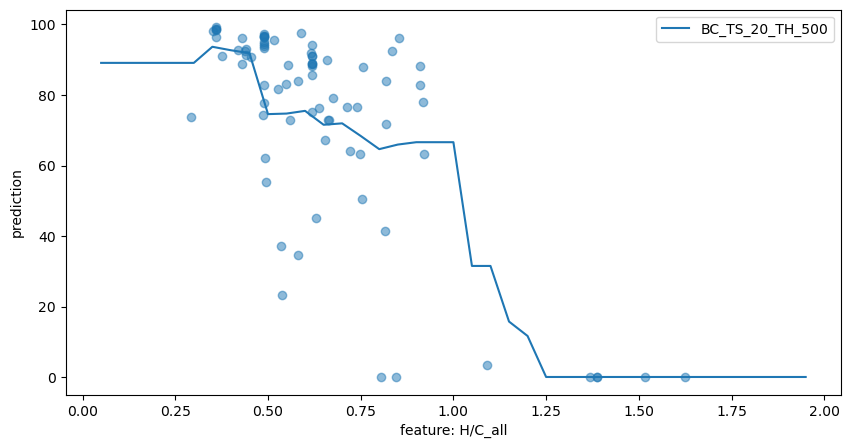

In [76]:
%matplotlib inline
k=0
y_col = 'BC_TS_20_TH_500'

fX = MX_S3[list(featuresets_manual[k])].copy()
fY = MT_S3.copy()

drop = True
toDrop = sAllCriteria | {42, 46, 47, 48}
if drop:
    fX.drop(toDrop, errors='ignore', inplace=True)
    fY.drop(toDrop, errors='ignore', inplace=True)

RF = pick_model(k, df, fX, fY, featuresets_manual) # reload and retrain the estimator, with its best fit. MUST pass the same data!

input_data = pd.DataFrame({'H/C_all': xHC })
plot_RF_model(RF, input_data, ycols=[fY.columns.get_loc(y_col)], ylabel=[y_col], figsize=(10,5), #
              fX=fX, 
              fY=fY[y_col])

feature_names_in ['HHT']


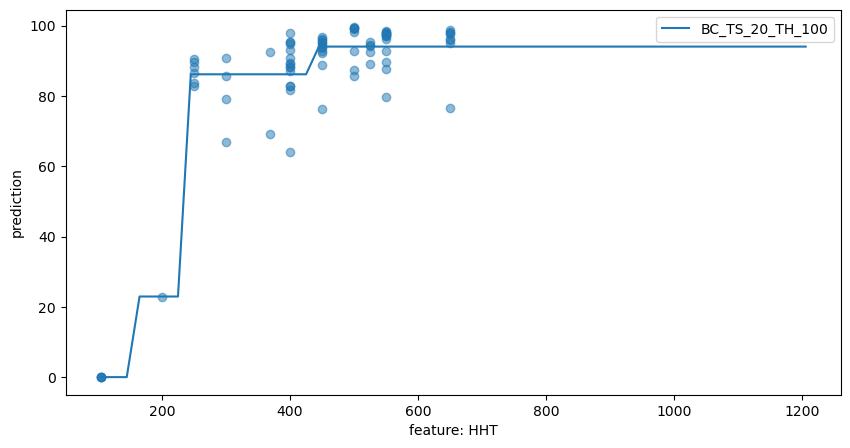

In [724]:
%matplotlib inline
xHHT = np.arange(metadata['HHT'].min(),metadata['HHT'].max()+20, 20) #.reshape(-1, 1)
k=1
y_col = 'BC_TS_20_TH_100'

fX = MX_S3[list(featuresets_manual[k])].copy()
fY = MT_S3.copy()

drop = True
toDrop = sAllCriteria | {42, 46, 47, 48}
if drop:
    fX.drop(toDrop, errors='ignore', inplace=True)
    fY.drop(toDrop, errors='ignore', inplace=True)

RF = pick_model(k, df, fX, fY, featuresets_manual) # reload and retrain the estimator, with its best fit. MUST pass the same data!

input_data = pd.DataFrame({'HHT': xHHT })
plot_RF_model(RF, input_data, ycols=[fY.columns.get_loc(y_col)], ylabel=[y_col], figsize=(10,5), #
              fX=fX, 
              fY=fY[y_col])

In [ ]:
plot_RF_model(rf, xs, ycols=0, ylabel='', fig=None, ax=None, figsize=(10,3), fX=None, fY=None):

#### OM / HC / BC100

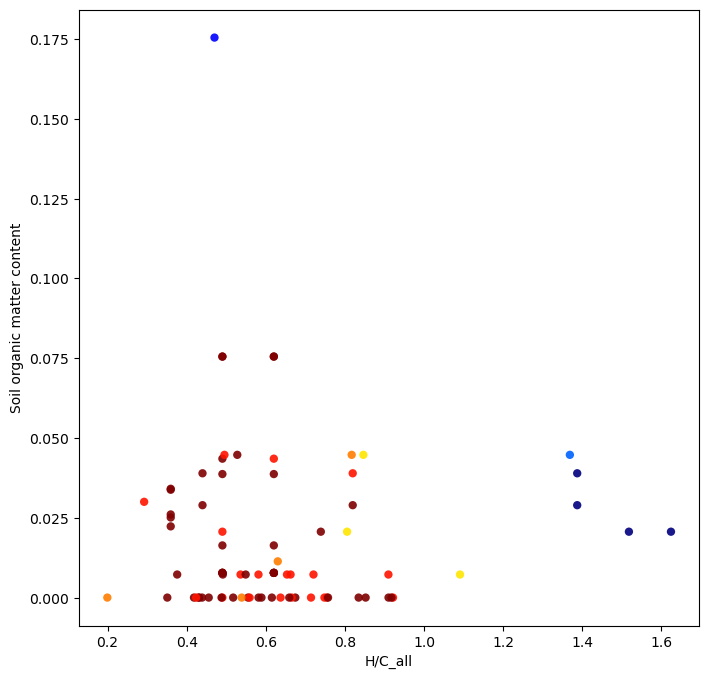

In [311]:
%matplotlib inline
one = 'H/C_all'
three = 'Soil organic matter content'
y_col = 'BC_TS_20_TH_100'
fig, ax = plt.subplots(figsize=(8,8),)# facecolor='white')

ax.scatter(fX[one],fX[three],
            c=fY[y_col], edgecolor='none', alpha=0.9,
            cmap=plt.cm.get_cmap('jet', 10))
ax.set_xlabel(one);
ax.set_ylabel(three);

### Training a single RF...

In [190]:
hyper_param_grid_RF = {
    'randomforestregressor__n_estimators': [50, 100, 300], # nb of trees in RF
    'randomforestregressor__max_features': ['log2'], # nb of features to consider at each split
    'randomforestregressor__max_depth': [2, 3, 4, 5], # None = default value
    'randomforestregressor__min_samples_split': [2, 5, 10],# min number of data points placed in a node before the node is split
    'randomforestregressor__min_samples_leaf': [1, 2, 4, 10], # min number of data points allowed in a leaf node
    'randomforestregressor__bootstrap': [True, False], # method for sampling data points (with or without replacement)
}
# cross-validation parameters
cross_validation_folds = 2

In [191]:
# POWER MODEL
N_SEED = 42

toDrop = sAllCriteria | {42, 46, 47, 48} # adding extra 3 outliers, cf linear models
drop = True # droping outliers from model

k=0 # pick feature set 
# feature selection, normalisation, one-hot encoding
fX = MX_S3[list(featuresets_manual[k])].copy()
fY = MT_S3.copy()

if drop:
    fX.drop(toDrop, errors='ignore', inplace=True)
    fY.drop(toDrop, errors='ignore', inplace=True)

numerical_columns_selector = selector(dtype_exclude=object)
categorical_columns_selector = selector(dtype_include=object)

numerical_columns = numerical_columns_selector(fX)
categorical_columns = categorical_columns_selector(fX)

categorical_preprocessor = OneHotEncoder(handle_unknown="ignore") # Here, could do a LabelEncoder() as well
numerical_preprocessor = RobustScaler() #StandardScaler() # RobustScaler() can also do robustscaler, dealing with outliers differently

preprocessor = ColumnTransformer([
    ('one-hot-encoder', categorical_preprocessor, categorical_columns),
    ('standard_scaler', numerical_preprocessor, numerical_columns)]
    , remainder='passthrough')

# Random Forest - grid search with CV
pipeRF = make_pipeline(preprocessor, RandomForestRegressor(random_state=N_SEED))
rf_rd = GridSearchCV(estimator=pipeRF,
                    param_grid=hyper_param_grid_RF,
                    cv=cross_validation_folds, # k-fold cross validation, 3, 5, 10
                    scoring='neg_mean_squared_error',
                    refit=True,# so that best estimator is retrained on the whole dataset
                    verbose=1,
                    n_jobs=4,
                    )
rf_rd.fit(fX, fY)
Y_test_predicted = rf_rd.predict(fX)
## calculate performance metrics
print('RMSE', np.sqrt(mean_squared_error(fY, Y_test_predicted)) )
print('expvar', explained_variance_score(fY, Y_test_predicted) )
print('r2', r2_score(fY, Y_test_predicted))
print('r2a',  r2a(r2_score(fY, Y_test_predicted), len(fX), fX.shape[1]) )

# save best estimators to disk, as pickle
with open('../simulations/manuscript/single_model_TreeDepth5.sav', 'wb') as f:
    pickle.dump(rf_rd, f)

Fitting 2 folds for each of 288 candidates, totalling 576 fits
RMSE 7.941939518076674
expvar 0.8455542400561102
r2 0.8455527387443024
r2a 0.8436221479786061


In [192]:
# EXP MODEL
hyper_param_grid_RF = {
    'randomforestregressor__n_estimators': [50, 100, 300], # nb of trees in RF
    'randomforestregressor__max_features': ['log2'], # nb of features to consider at each split
    'randomforestregressor__max_depth': [2, 3, 4, 5, 10, 20], # None = default value
    'randomforestregressor__min_samples_split': [2, 5, 10],# min number of data points placed in a node before the node is split
    'randomforestregressor__min_samples_leaf': [1, 2, 4, 10], # min number of data points allowed in a leaf node
    'randomforestregressor__bootstrap': [True, False], # method for sampling data points (with or without replacement)
}

# cross-validation parameters
cross_validation_folds = 2

N_SEED = 42

toDrop = sAllCriteria | {42, 46, 47, 48} # adding extra 3 outliers, cf linear models
drop = True # droping outliers from model

k=0 # pick feature set 
# feature selection, normalisation, one-hot encoding
fX = MX_S2[list(featuresets_manual[k])].copy()
fY = MT_S2.copy()

if drop:
    fX.drop(toDrop, errors='ignore', inplace=True)
    fY.drop(toDrop, errors='ignore', inplace=True)

numerical_columns_selector = selector(dtype_exclude=object)
categorical_columns_selector = selector(dtype_include=object)

numerical_columns = numerical_columns_selector(fX)
categorical_columns = categorical_columns_selector(fX)

categorical_preprocessor = OneHotEncoder(handle_unknown="ignore") # Here, could do a LabelEncoder() as well
numerical_preprocessor = RobustScaler() #StandardScaler() # RobustScaler() can also do robustscaler, dealing with outliers differently

preprocessor = ColumnTransformer([
    ('one-hot-encoder', categorical_preprocessor, categorical_columns),
    ('standard_scaler', numerical_preprocessor, numerical_columns)]
    , remainder='passthrough')

# Random Forest - grid search with CV
pipeRF = make_pipeline(preprocessor, RandomForestRegressor(random_state=N_SEED))
rf_rd = GridSearchCV(estimator=pipeRF,
                    param_grid=hyper_param_grid_RF,
                    cv=cross_validation_folds, # k-fold cross validation, 3, 5, 10
                    scoring='neg_mean_squared_error',
                    refit=True,# so that best estimator is retrained on the whole dataset
                    verbose=1,
                    n_jobs=4,
                    )
rf_rd.fit(fX, fY)
Y_test_predicted = rf_rd.predict(fX)
## calculate performance metrics
print('RMSE', np.sqrt(mean_squared_error(fY, Y_test_predicted)) )
print('expvar', explained_variance_score(fY, Y_test_predicted) )
print('r2', r2_score(fY, Y_test_predicted))
print('r2a',  r2a(r2_score(fY, Y_test_predicted), len(fX), fX.shape[1]) )

# save best estimators to disk, as pickle
with open('../simulations/manuscript/single_model_Exp_TreeDepth5.sav', 'wb') as f:
    pickle.dump(rf_rd, f)

Fitting 2 folds for each of 432 candidates, totalling 864 fits
RMSE 10.410835723083087
expvar 0.8090410118307594
r2 0.8090174447125219
r2a 0.8066596353879851


In [302]:
# Reload from file
#with open('../simulations/manuscript/single_model.sav', 'rb') as f:
with open('../simulations/manuscript/single_model_TreeDepth5.sav', 'rb') as f:
    loaded_model = pickle.load(f)

#prediction = loaded_model.predict(fX)''

#### Training single Linear RF

In [285]:
hyper_param_grid_RF = {
    'linearforestregressor__n_estimators': [50, 100, 300], # nb of trees in RF
    'linearforestregressor__max_features': ['log2'], # nb of features to consider at each split
    'linearforestregressor__max_depth': [2, 3, 4, 5], # None = default value
    'linearforestregressor__min_samples_split': [2, 5, 10],# min number of data points placed in a node before the node is split
    'linearforestregressor__min_samples_leaf': [1, 2, 4, 10], # min number of data points allowed in a leaf node
    'linearforestregressor__bootstrap': [True, False], # method for sampling data points (with or without replacement)
}
# cross-validation parameters
cross_validation_folds = 2

In [287]:
# POWER MODEL
N_SEED = 42
from lineartree import LinearTreeRegressor, LinearForestRegressor
toDrop = sAllCriteria | {42, 46, 47, 48} # adding extra 3 outliers, cf linear models
drop = True # droping outliers from model

k=0 # pick feature set 
# feature selection, normalisation, one-hot encoding
fX = MX_S3[list(featuresets_manual[k])].copy()
fY = MT_S3.copy()

if drop:
    fX.drop(toDrop, errors='ignore', inplace=True)
    fY.drop(toDrop, errors='ignore', inplace=True)

numerical_columns_selector = selector(dtype_exclude=object)
categorical_columns_selector = selector(dtype_include=object)

numerical_columns = numerical_columns_selector(fX)
categorical_columns = categorical_columns_selector(fX)

categorical_preprocessor = OneHotEncoder(handle_unknown="ignore") # Here, could do a LabelEncoder() as well
numerical_preprocessor = RobustScaler() #StandardScaler() # RobustScaler() can also do robustscaler, dealing with outliers differently

preprocessor = ColumnTransformer([
    ('one-hot-encoder', categorical_preprocessor, categorical_columns),
    ('standard_scaler', numerical_preprocessor, numerical_columns)]
    , remainder='passthrough')

# Random Forest - grid search with CV
LINRF = LinearForestRegressor(base_estimator=LinearRegression(), random_state=N_SEED)

pipeRF = make_pipeline(preprocessor, LINRF)
rf_rd = GridSearchCV(estimator=pipeRF,
                    param_grid=hyper_param_grid_RF,
                    cv=cross_validation_folds, # k-fold cross validation, 3, 5, 10
                    scoring='neg_mean_squared_error',
                    refit=True,# so that best estimator is retrained on the whole dataset
                    verbose=1,
                    n_jobs=4,
                    )
rf_rd.fit(fX, fY)
Y_test_predicted = rf_rd.predict(fX)
## calculate performance metrics
print('RMSE', np.sqrt(mean_squared_error(fY, Y_test_predicted)) )
print('expvar', explained_variance_score(fY, Y_test_predicted) )
print('r2', r2_score(fY, Y_test_predicted))
print('r2a',  r2a(r2_score(fY, Y_test_predicted), len(fX), fX.shape[1]) )

# save best estimators to disk, as pickle
with open('../simulations/manuscript/single_model_LinearRandomForest_GridSearchCV.sav', 'wb') as f:
    pickle.dump(rf_rd, f)

Fitting 2 folds for each of 288 candidates, totalling 576 fits
RMSE 7.297654320935866
expvar 0.8659281849729185
r2 0.8659281849729185
r2a 0.86425228728508


In [303]:
with open('../simulations/manuscript/single_model_LinearRandomForest_GridSearchCV.sav', 'rb') as f:
    loaded_model_pow_linRF = pickle.load(f)

In [304]:
with open('../simulations/manuscript/single_model_Exp_TreeDepth5.sav', 'rb') as f:
    loaded_model_exp = pickle.load(f)

### 3D viz of multi-target RF with H/C as predictor

Visualize in 3D the predictions from the RF with H/C as predictor, for any TH and TS, as surfaces.

In [37]:
# using save RF models, that need to be re-trained
k=0

fX = MX_S3[list(featuresets_manual[k])].copy()
fY = MT_S3.copy()

drop = True
toDrop = sAllCriteria | {42, 46, 47, 48}
if drop:
    fX.drop(toDrop, errors='ignore', inplace=True)
    fY.drop(toDrop, errors='ignore', inplace=True)

RF = pick_model(k, df, fX, fY, featuresets_manual)

xHC = np.arange(0.01, 0.7, 0.03)

input_data = pd.DataFrame({'H/C_all': xHC })
output_data = RF.predict(input_data) # RF is multi-target, and its targets are the ones in MT_S3.columns
output_data.shape

NameError: name 'df' is not defined

In [45]:
# using fully saved model, no re-training needed, and random state seeded, for reproducibility
k=0
xHC = np.arange(0.01, 2.0, 0.03)

input_data = pd.DataFrame({'H/C_all': xHC })
output_data = loaded_model.predict(input_data) # RF is multi-target, and its targets are the ones in MT_S3.columns
output_data.shape

NameError: name 'loaded_model' is not defined

In [305]:
# The RF will return an array of BC100 values, for n HC values, m x p columns
# so in total we have n x m x p values of BC100, which we must put in a 3D np.array shape.

# dim 1 > TS
# dim 2 > Time
# dim 3 > HC
TS = np.arange(0, 30, 5)
TH = [1, 2, 5, 10, 20, 30, 40, 50, 75, 100, 200, 500]
col_names = ['BC_TS_'+str(targetTemperature)+'_TH_'+str(timeHorizon) for targetTemperature, timeHorizon in itertools.product(TS, TH)]

n = len(TS) 
m = len (TH)
p = len(xHC)
arrayBC_exp = np.zeros((n, m, p))
arrayBC_pow = np.zeros((n, m, p))
arrayBC_pow_linRF = np.zeros((n, m, p))

fit_exp = pd.DataFrame(loaded_model_exp.predict(pd.DataFrame({'H/C_all': xHC })) , index=xHC, columns=col_names)
fit_pow = pd.DataFrame(loaded_model.predict(pd.DataFrame({'H/C_all': xHC })) , index=xHC, columns=col_names)
fit_pow_linRF = pd.DataFrame(loaded_model_pow_linRF.predict(pd.DataFrame({'H/C_all': xHC })) , index=xHC, columns=col_names)

for nn, targetTemperature in enumerate(TS):
    print("temperature ", targetTemperature, " is at nn=", nn)
    for mm, timeHorizon in enumerate(TH):

        col = 'BC_TS_'+str(targetTemperature)+'_TH_'+str(timeHorizon)
        val_exp = fit_exp[col].values
        val_pow = fit_pow[col].values
        arrayBC_exp[nn,mm,:] = val_exp #nn*mm*mm*np.linspace(0, 10, num=len(xHC), endpoint=True)
        arrayBC_pow[nn,mm,:] = val_pow
        arrayBC_pow_linRF[nn,mm,:] = fit_pow_linRF[col].values
        
        
X, Y = np.meshgrid(TH, xHC)
Z1_exp = arrayBC_exp[2,:,:].T # correspond to 10C
Z2_exp = arrayBC_exp[4,:,:].T # corresponds to 20C
Z1_pow = arrayBC_pow[2,:,:].T # correspond to 10C
Z2_pow = arrayBC_pow[4,:,:].T # corresponds to 20C

Z2_pow_linRF = arrayBC_pow_linRF[4,:,:].T

temperature  0  is at nn= 0
temperature  5  is at nn= 1
temperature  10  is at nn= 2
temperature  15  is at nn= 3
temperature  20  is at nn= 4
temperature  25  is at nn= 5


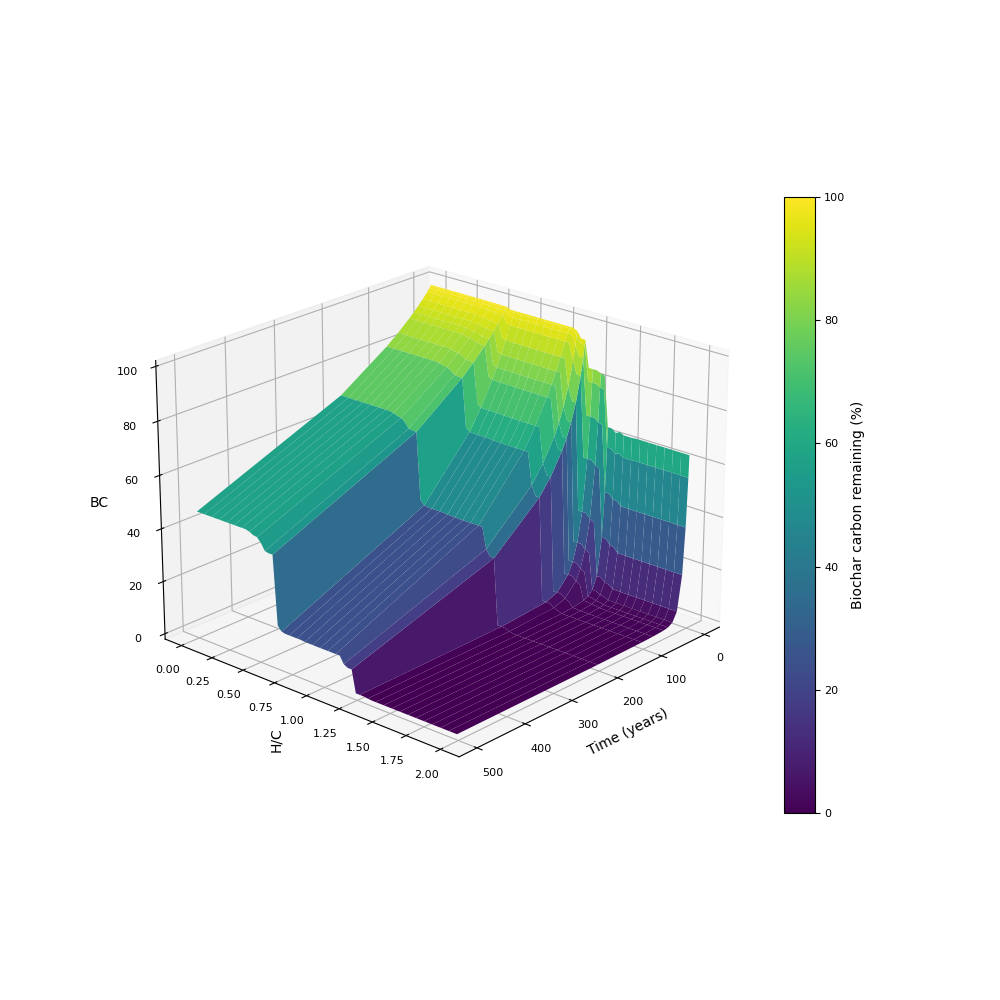

In [217]:
# EXPONENTIAL
%matplotlib widget
sns.reset_defaults()
# Create a 3D plot
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')

# Plot the surface
#ax.plot_surface(X, Y, Z1, cmap='viridis')

# Apply 2D moving average smoothing
window_size = 5
kernel = np.ones((window_size, window_size)) / window_size ** 2
#Z_smooth = np.convolve(Z2, kernel, mode='valid',)

surf=ax.plot_surface(X, Y, Z2_exp, cmap='viridis')

# Add a colorbar as a vertical legend
cbar = fig.colorbar(surf, ax=ax, shrink=0.8, orientation='vertical')
surf.set_clim(0, 100)
ax.set_zlim([0,100])
# Set font size of labels and tick labels
label_font_size = 10
tick_label_font_size = 8

ax.set_xlabel('Time (years)', fontsize=label_font_size)
ax.set_ylabel('H/C', fontsize=label_font_size, rotation=90)
ax.set_zlabel('BC', fontsize=label_font_size)

ax.tick_params(axis='x', labelsize=tick_label_font_size)
ax.tick_params(axis='y', labelsize=tick_label_font_size)
ax.tick_params(axis='z', labelsize=tick_label_font_size)

#ax.set_title('Random forest regression', fontsize=10)

# Set colorbar label and font size
cbar.set_label('Biochar carbon remaining (%)', fontsize=label_font_size)
cbar.ax.tick_params(labelsize=tick_label_font_size)

ax.view_init(elev=22, azim=42)  # Adjust elevation (elev) and azimuth (azim) angles as desired

# Save the figure with specific rotation
#fig.tight_layout()
fig.savefig('../simulations/manuscript/Figure9a_MultiTargetRandomForest_HC_surface_Exp.png', dpi=600)

# Show the plot
plt.show()


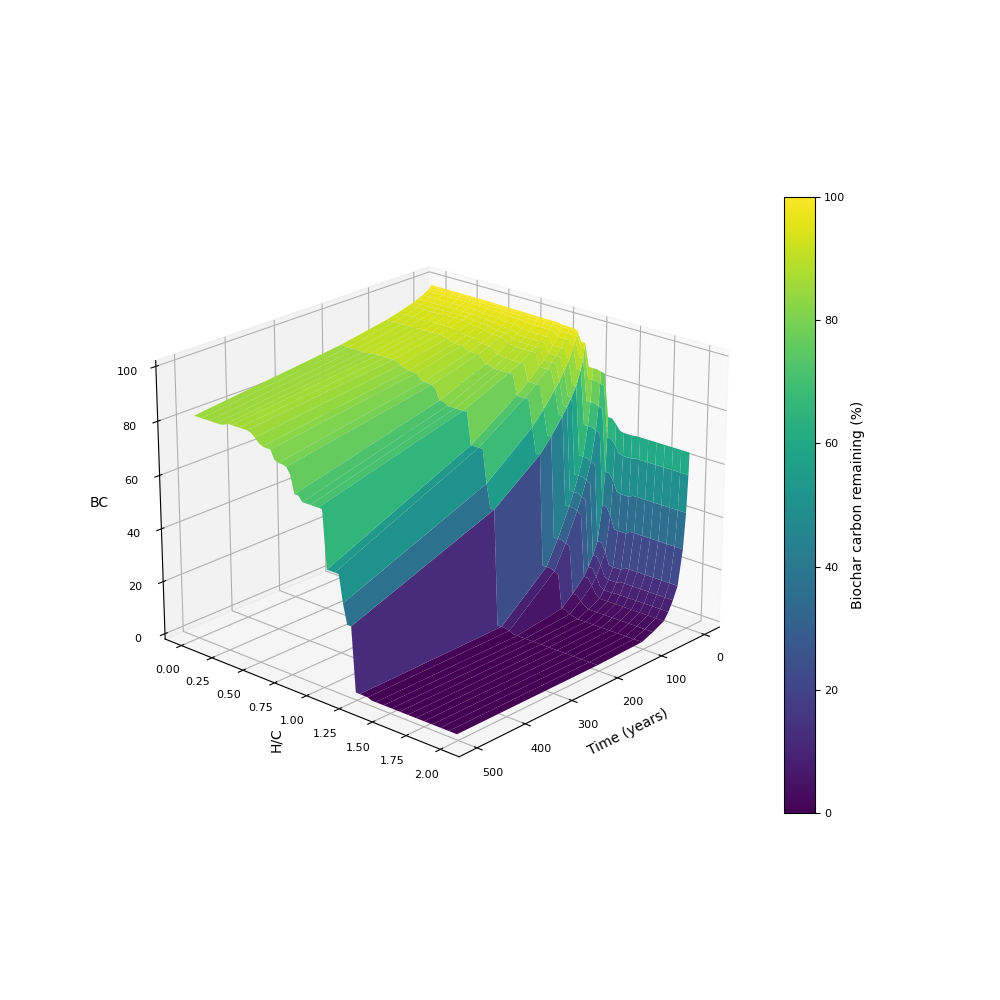

In [218]:
# POWER
%matplotlib widget
sns.reset_defaults()
# Create a 3D plot
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')

# Plot the surface
#ax.plot_surface(X, Y, Z1, cmap='viridis')

# Apply 2D moving average smoothing
window_size = 5
kernel = np.ones((window_size, window_size)) / window_size ** 2
#Z_smooth = np.convolve(Z2, kernel, mode='valid',)

surf=ax.plot_surface(X, Y, Z2_pow, cmap='viridis')

# Add a colorbar as a vertical legend
cbar = fig.colorbar(surf, ax=ax, shrink=0.8, orientation='vertical')
surf.set_clim(0, 100)
ax.set_zlim([0,100])
# Set font size of labels and tick labels
label_font_size = 10
tick_label_font_size = 8

ax.set_xlabel('Time (years)', fontsize=label_font_size)
ax.set_ylabel('H/C', fontsize=label_font_size, rotation=90)
ax.set_zlabel('BC', fontsize=label_font_size)

ax.tick_params(axis='x', labelsize=tick_label_font_size)
ax.tick_params(axis='y', labelsize=tick_label_font_size)
ax.tick_params(axis='z', labelsize=tick_label_font_size)

#ax.set_title('Random forest regression', fontsize=10)

# Set colorbar label and font size
cbar.set_label('Biochar carbon remaining (%)', fontsize=label_font_size)
cbar.ax.tick_params(labelsize=tick_label_font_size)

ax.view_init(elev=22, azim=42)  # Adjust elevation (elev) and azimuth (azim) angles as desired

# Save the figure with specific rotation
#fig.tight_layout()
fig.savefig('../simulations/manuscript/Figure9b_MultiTargetRandomForest_HC_surface_Pow.png', dpi=600)

# Show the plot
plt.show()


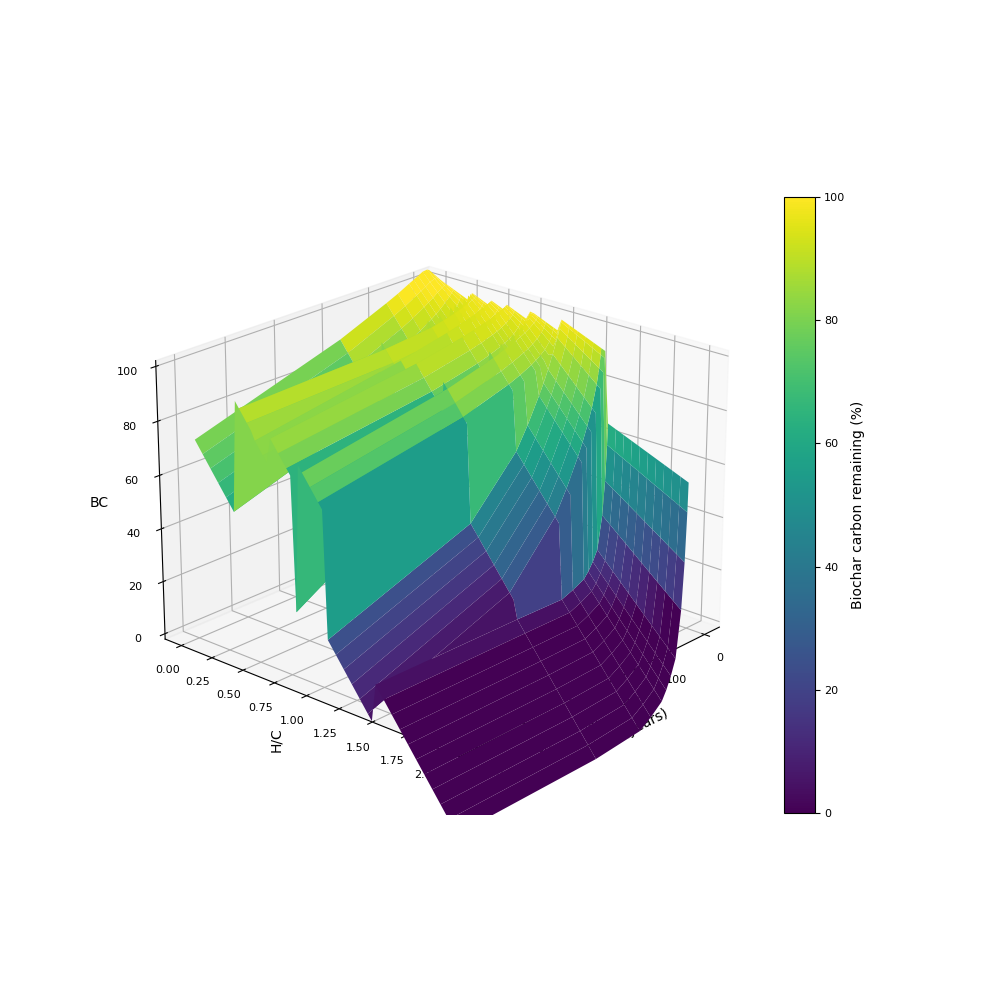

In [295]:
# LIN RF 
# POWER
%matplotlib widget
sns.reset_defaults()
# Create a 3D plot
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')

# Plot the surface
#ax.plot_surface(X, Y, Z1, cmap='viridis')

# Apply 2D moving average smoothing
window_size = 5
kernel = np.ones((window_size, window_size)) / window_size ** 2
#Z_smooth = np.convolve(Z2, kernel, mode='valid',)

surf=ax.plot_surface(X, Y, Z2_pow_linRF, cmap='viridis')

# Add a colorbar as a vertical legend
cbar = fig.colorbar(surf, ax=ax, shrink=0.8, orientation='vertical')
surf.set_clim(0, 100)
ax.set_zlim([0,100])
# Set font size of labels and tick labels
label_font_size = 10
tick_label_font_size = 8

ax.set_xlabel('Time (years)', fontsize=label_font_size)
ax.set_ylabel('H/C', fontsize=label_font_size, rotation=90)
ax.set_zlabel('BC', fontsize=label_font_size)

ax.tick_params(axis='x', labelsize=tick_label_font_size)
ax.tick_params(axis='y', labelsize=tick_label_font_size)
ax.tick_params(axis='z', labelsize=tick_label_font_size)

#ax.set_title('Random forest regression', fontsize=10)

# Set colorbar label and font size
cbar.set_label('Biochar carbon remaining (%)', fontsize=label_font_size)
cbar.ax.tick_params(labelsize=tick_label_font_size)

ax.view_init(elev=22, azim=42)  # Adjust elevation (elev) and azimuth (azim) angles as desired

# Save the figure with specific rotation
#fig.tight_layout()
#fig.savefig('../simulations/manuscript/Figure9b_MultiTargetRandomForest_HC_surface_Pow.png', dpi=600)

# Show the plot
plt.show()



#### Fig. RF surfaces, 2in1

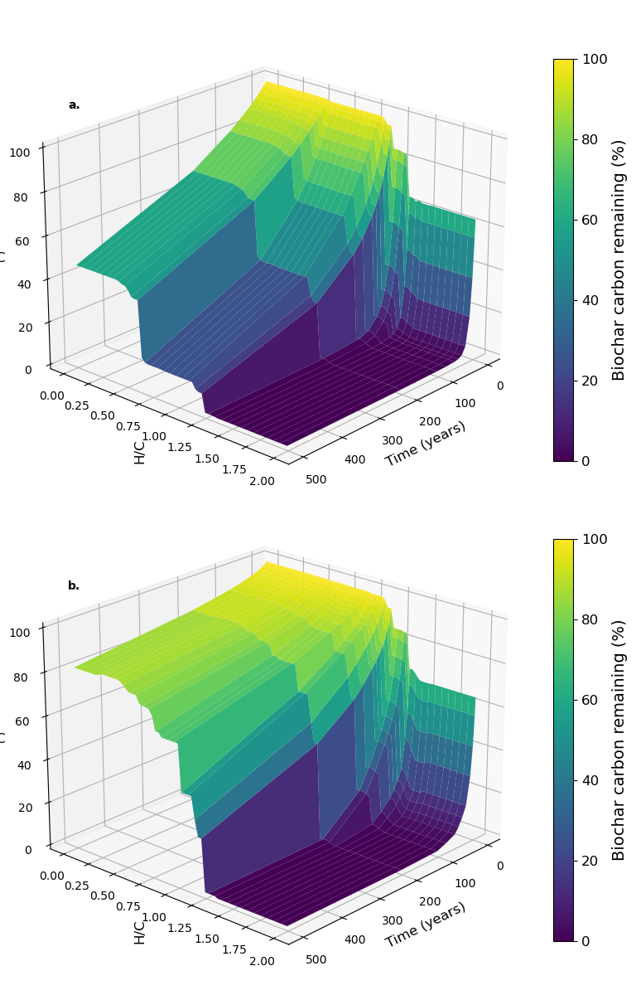

In [267]:
# EXPONENTIAL + POW
%matplotlib inline
sns.reset_defaults()
# Create a 3D plot
fig = plt.figure(figsize=(8, 12))
axEXP = fig.add_subplot(211, projection='3d')
axPOW = fig.add_subplot(212, projection='3d')

surf1=axEXP.plot_surface(X, Y, Z2_exp, cmap='viridis')
surf2=axPOW.plot_surface(X, Y, Z2_pow, cmap='viridis')

axEXP.view_init(elev=22, azim=42)  # Adjust elevation (elev) and azimuth (azim) angles as desired
axPOW.view_init(elev=22, azim=42)  # Adjust elevation (elev) and azimuth (azim) angles as desired

axEXP.annotate('a.', xy=(0.1,0.8), xycoords="axes fraction", fontsize=10, weight='bold')
axPOW.annotate('b.', xy=(0.1,0.8), xycoords="axes fraction", fontsize=10, weight='bold')

for ax in [axEXP, axPOW]:
    # Add a colorbar as a vertical legend
    cbar = fig.colorbar(surf, ax=ax, shrink=0.8, orientation='vertical')
    surf.set_clim(0, 100)
    ax.set_zlim([0,100])
    # Set font size of labels and tick labels
    label_font_size = 12
    tick_label_font_size = 10

    ax.set_xlabel('Time (years)', fontsize=label_font_size)
    ax.set_ylabel('H/C', fontsize=label_font_size, rotation=90)
    ax.set_zlabel('BC', fontsize=label_font_size)

    ax.tick_params(axis='x', labelsize=tick_label_font_size)
    ax.tick_params(axis='y', labelsize=tick_label_font_size)
    ax.tick_params(axis='z', labelsize=tick_label_font_size)
    # Set colorbar label and font size
    cbar.set_label('Biochar carbon remaining (%)', fontsize=label_font_size+2)
    cbar.ax.tick_params(labelsize=tick_label_font_size+2)

# Save the figure with specific rotation
fig.tight_layout(pad=0.5, h_pad=-2, w_pad=0)
fig.savefig('../simulations/manuscript/Figure9_MultiTargetRandomForest_HC_surface_Exp.png', dpi=600, 
            bbox_inches='tight', pad_inches=0.5)


# Show the plot
plt.show()


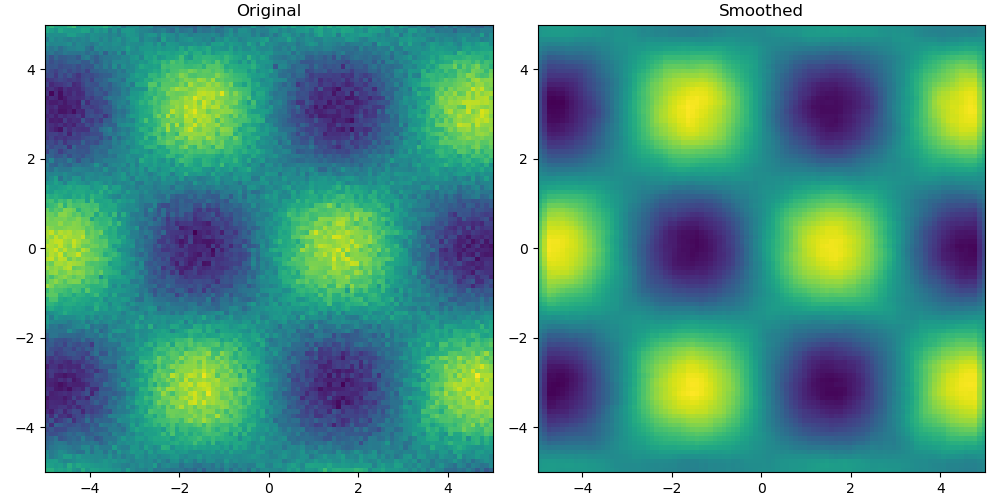

In [211]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import convolve

# Generate sample data
x = np.linspace(-5, 5, 100)
y = np.linspace(-5, 5, 100)
X, Y = np.meshgrid(x, y)
Z = np.sin(X) * np.cos(Y) + np.random.normal(0, 0.1, X.shape)

# Apply 2D moving average smoothing
window_size = 5
kernel = np.ones((window_size, window_size)) / window_size ** 2
Z_smooth = convolve(Z, kernel, mode='constant',)

# Plot original and smoothed data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
ax1.imshow(Z, cmap='viridis', origin='lower', extent=[x.min(), x.max(), y.min(), y.max()])
ax1.set_title('Original')
ax2.imshow(Z_smooth, cmap='viridis', origin='lower', extent=[x.min(), x.max(), y.min(), y.max()])
ax2.set_title('Smoothed')
plt.tight_layout()
plt.show()


### Decision tree classifier and rules

Score:  0.9024390243902439


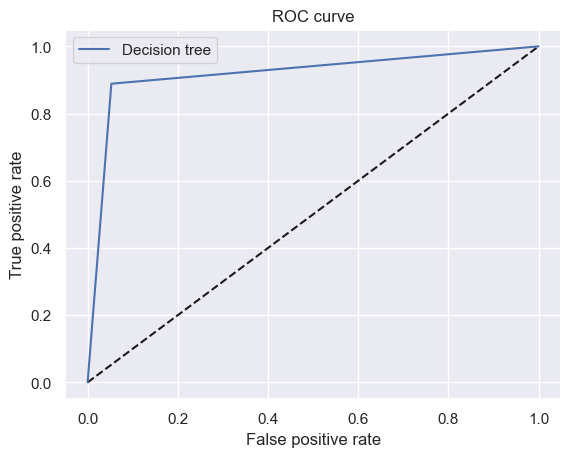

In [224]:
from sklearn.metrics import mean_squared_error, r2_score, roc_curve, explained_variance_score

toDrop = sAllCriteria
drop = True # droping outliers from model

MT_X = MX_S3.copy()
MT_Y = MT_S3['BC_TS_20_TH_100'] > 100*0.8 # more than 80% remaining

if drop:
    MT_X.drop(toDrop, errors='ignore', inplace=True)
    MT_Y.drop(toDrop, errors='ignore', inplace=True)

numerical_columns_selector = selector(dtype_exclude=object)
categorical_columns_selector = selector(dtype_include=object)

numerical_columns = numerical_columns_selector(MT_X)
categorical_columns = categorical_columns_selector(MT_X)

categorical_preprocessor = OneHotEncoder(handle_unknown="ignore") # Here, could do a LabelEncoder() as well
numerical_preprocessor = StandardScaler() #StandardScaler() # RobustScaler() can also do robustscaler, dealing with outliers differently

preprocessor = ColumnTransformer([
    ('one-hot-encoder', categorical_preprocessor, categorical_columns),
    #('standardscaler', numerical_preprocessor, numerical_columns),
   ], remainder='passthrough')

clf = DecisionTreeClassifier(
    criterion='gini', # entropy, gini
    splitter='best', # best, random
    max_depth=3, # int or None (until leaves are expanded) >> lead to perfect score > set a limit, shallow, to get simple rules min(2, X_dfr.shape[1]-1)
    min_samples_split=2, # int or float
    min_samples_leaf=1, #
    min_weight_fraction_leaf=0.0, # optional
    max_features=None, # None = n_features, int, float, sqrt, log2
    random_state=None, # None or int
    max_leaf_nodes=None, # max number of leaves
    min_impurity_decrease=0.0, # float force impurity to decrease at each node
    class_weight=None,
) # default parameters - TO DO : learning ...

clf_CV = GridSearchCV(clf, {'criterion':['gini', 'entropy']},
                      cv=3)

cls_pipe = make_pipeline(preprocessor, clf_CV)

cls_pipe.fit(MT_X, MT_Y)
Y_dfr_predict = cls_pipe.predict(MT_X)
print("Score: ", cls_pipe.score(MT_X,MT_Y))

# saving & re-loading a model
#s = pickle.dump(clf,  open('models/decisionTree.pickle', 'wb'))
#clf = pickle.load(open('models/decisionTree.pickle', 'rb'))

# ROC & AUC
fpr, tpr, thres = roc_curve(MT_Y, Y_dfr_predict)
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr, label='Decision tree')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best')
plt.show()


In [225]:
rules = export_text(cls_pipe[1].best_estimator_, feature_names=list(cls_pipe[:-1].get_feature_names_out()), show_weights=True)
print("\n Rules")
print(rules)


 Rules
|--- remainder__H/C_all <= 0.62
|   |--- remainder__HHT <= 925.00
|   |   |--- one-hot-encoder__BiomassClass_grass <= 0.50
|   |   |   |--- weights: [0.00, 46.00] class: True
|   |   |--- one-hot-encoder__BiomassClass_grass >  0.50
|   |   |   |--- weights: [1.00, 2.00] class: True
|   |--- remainder__HHT >  925.00
|   |   |--- weights: [2.00, 0.00] class: False
|--- remainder__H/C_all >  0.62
|   |--- remainder__O/C_org <= 0.44
|   |   |--- remainder__Ash <= 0.03
|   |   |   |--- weights: [0.00, 8.00] class: True
|   |   |--- remainder__Ash >  0.03
|   |   |   |--- weights: [9.00, 7.00] class: False
|   |--- remainder__O/C_org >  0.44
|   |   |--- weights: [7.00, 0.00] class: False



In [191]:
export_text?

The parameter x=`H/C_all` contains 2 NaN values, from observations: [40, 41]
Remaining number of observations in the graph:108
Linear regression: BC_Th_Ts = -66.34 x H/C_all + 100.94 | R2 = 0.30


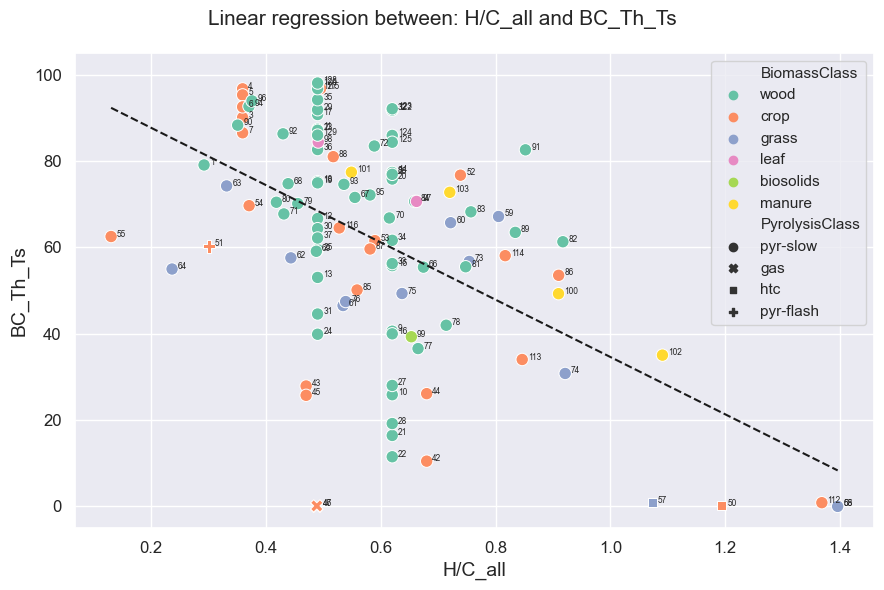

In [9]:
# previous correlation, with fitdata from 2022 (smaller dataset, other fit)
fig, ax = bs.correlation_linear(fitdata, metadata, x='H/C_all', y='BC_Th_Ts', plot=True,
                                Ts=20, Th=100,
                                outliers=None,
                                trendline=True,
                                trenderror=False,
                                an = metadata.index)

The parameter x=`H/C_all` contains 2 NaN values, from observations: [40, 41]
Remaining number of observations in the graph:123
Linear regression: BC_Th_Ts = -67.49 x H/C_all + 100.36 | R2 = 0.37


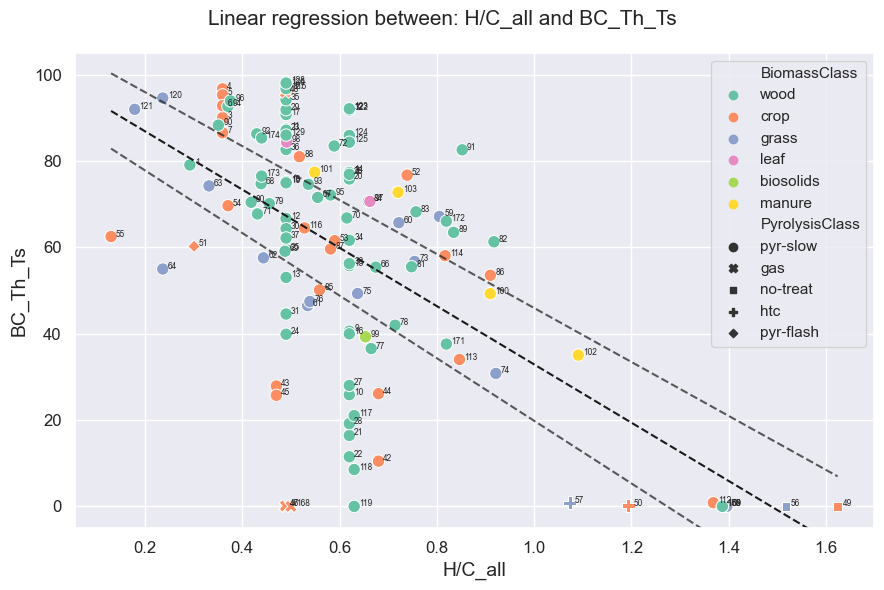

In [13]:
fig, ax = bs.correlation_linear(S2_bestfit, metadata, x='H/C_all', y='BC_Th_Ts', plot=True,
                                Ts=20, Th=100,
                                outliers=None,
                                trendline=True,
                                trenderror=True,
                                an = metadata.index)

The parameter x=`H/C_all` contains 2 NaN values, from observations: [40, 41]
Specified outliers (10) were removed from regression: {34, 37, 10, 13, 16, 19, 22, 25, 28, 31}
Remaining number of observations in the graph:113
Linear regression: BC_Th_Ts = -68.28 x H/C_all + 102.43 | R2 = 0.40


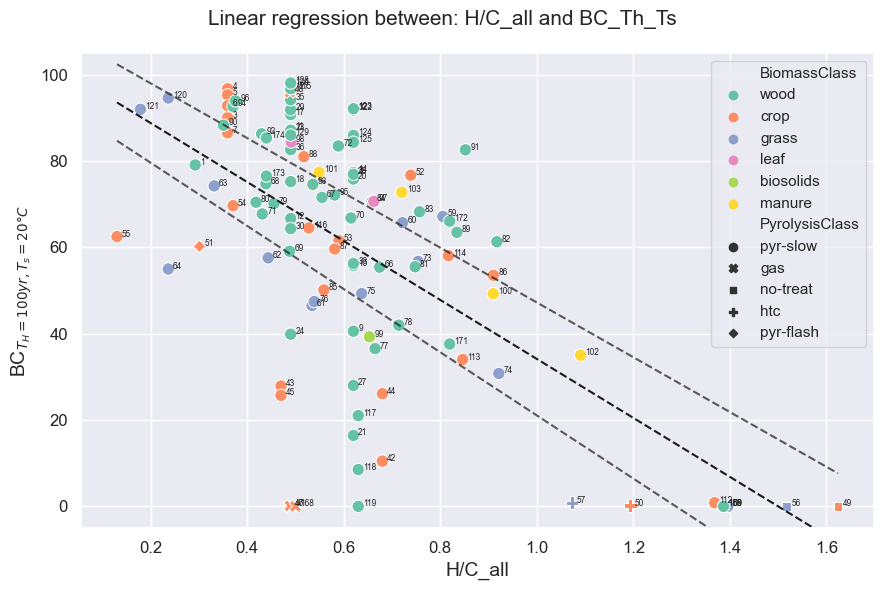

In [21]:
Ts=20
Th=100
fig, ax = bs.correlation_linear(S2_bestfit, metadata, x='H/C_all', y='BC_Th_Ts', plot=True,
                                Ts=Ts, Th=Th,
                                trendline=True,
                                trenderror=True,
                                outliers=set(tooHighTemp), 
                                an = metadata.index)

ax[0].set_ylabel(r"BC$_{T_H=100 yr, T_s=20°C}$")
fig.tight_layout()
plt.savefig('simulations/manuscript/reproducingWoolf_100yr_20C_113obs_exclFang60.png', dpi=600)

C:\github\biocharStability\biocharStability\analyse.py:941: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(std_f2)
C:\github\biocharStability\biocharStability\analyse.py:941: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(std_f2)
C:\github\biocharStability\biocharStability\analyse.py:941: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(std_f2)


The parameter x=`H/C_all` contains 2 NaN values, from observations: [40, 41]
Specified outliers (10) were removed from regression: {34, 37, 10, 13, 16, 19, 22, 25, 28, 31}
Remaining number of observations in the graph:113
Linear regression: BC_Th_Ts = -52.19 x H/C_all + 119.63 | R2 = 0.44


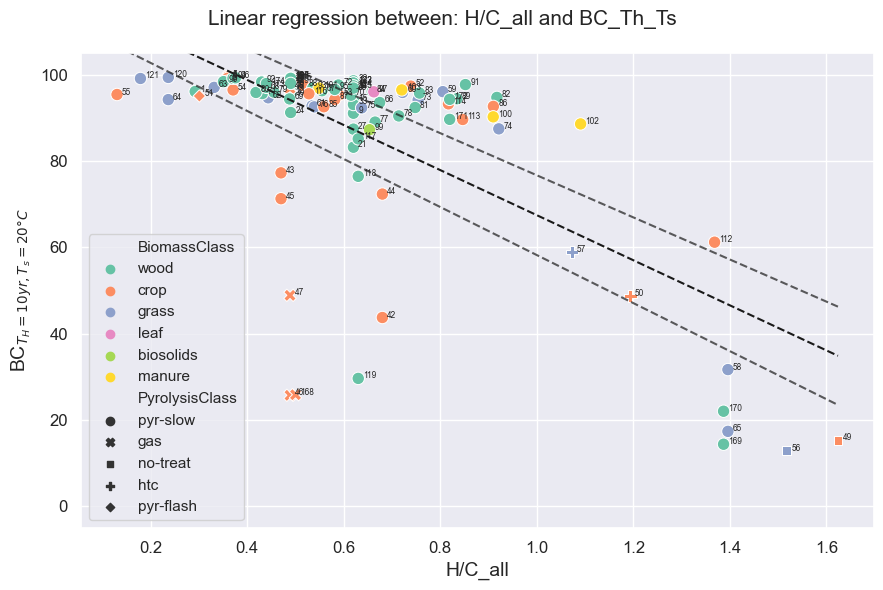

In [22]:
Ts=20
Th=10
fig, ax = bs.correlation_linear(S2_bestfit, metadata, x='H/C_all', y='BC_Th_Ts', plot=True,
                                Ts=Ts, Th=Th,
                                trendline=True,
                                trenderror=True,
                                outliers=set(tooHighTemp), 
                                an = metadata.index)

ax[0].set_ylabel(r"BC$_{T_H=10 yr, T_s=20°C}$")
fig.tight_layout()
plt.savefig('simulations/manuscript/reproducingWoolf_10yr_20C_113obs_exclFang60.png', dpi=600)

The parameter x=`H/C_all` contains 2 NaN values, from observations: [40, 41]
Specified outliers (29) were removed from regression: {10, 13, 16, 19, 21, 22, 25, 27, 28, 31, 34, 37, 169, 170, 43, 44, 45, 46, 175, 47, 49, 50, 42, 56, 57, 58, 65, 102, 112}
Linear regression: BC_Th_Ts = -45.14 x H/C_all + 96.57 | R2 = 0.18


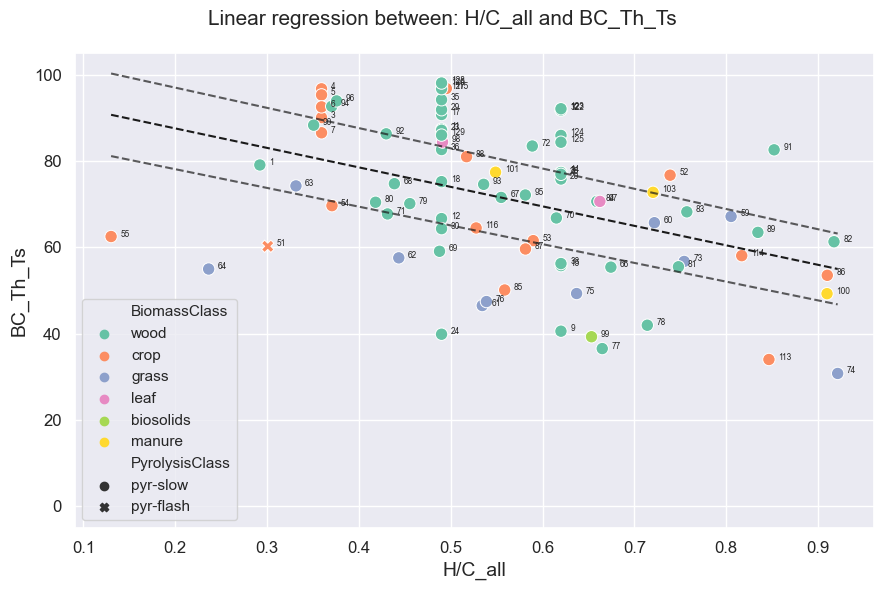

In [20]:
fig, ax = bs.correlation_linear(fitdata, metadata, x='H/C_all', y='BC_Th_Ts', plot=True,
                                Ts=20, Th=100,
                                outliers=set(tooHighHC+tooHighTemp+VenturaHerath_Fang), 
                                an = metadata.index)

C:\github\biocharStability\biocharStability\analyse.py:941: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(std_f2)
C:\github\biocharStability\biocharStability\analyse.py:941: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(std_f2)
C:\github\biocharStability\biocharStability\analyse.py:941: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(std_f2)
C:\github\biocharStability\biocharStability\analyse.py:941: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(std_f2)


The parameter x=`H/C_all` contains 2 NaN values, from observations: [40, 41]
Specified outliers (30) were removed from regression: {10, 13, 16, 19, 21, 22, 25, 27, 28, 31, 34, 37, 168, 169, 170, 43, 44, 45, 46, 175, 47, 49, 50, 42, 56, 57, 58, 65, 102, 112}
Linear regression: BC_Th_Ts = -5.27 x H/C_all + 100.09 | R2 = 0.05


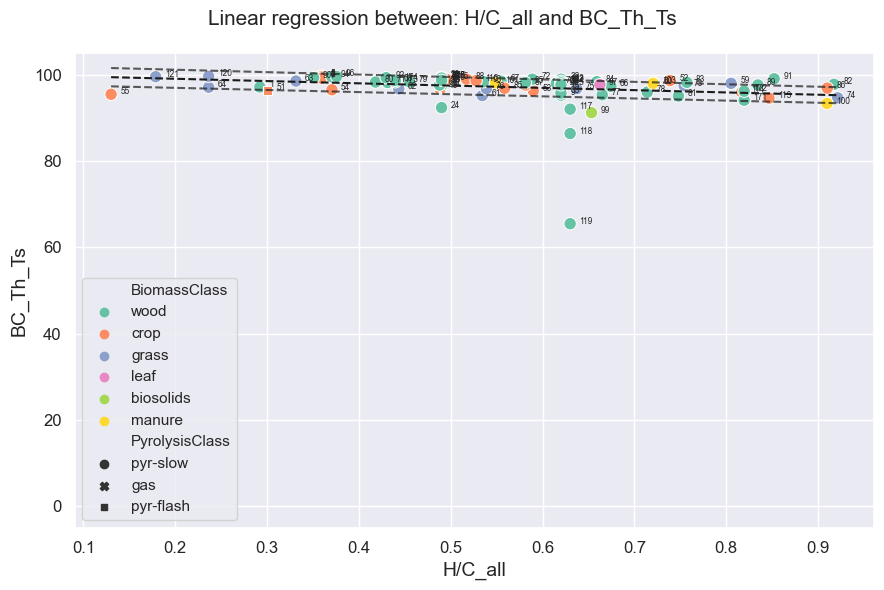

In [24]:
fig, ax = bs.correlation_linear(fitdata=S4_bestfit, metadata=metadata, x='H/C_all', y='BC_Th_Ts', plot=True,
                                Ts=20, Th=5,
                                outliers=set(tooHighHC+tooHighTemp+VenturaHerath_Fang), 
                                an = metadata.index,
                                iobs=None)

In [16]:
S3_bestfit

,ID_obs,id,library,method,model,bounds,p0,k,c,k1,...,"cov(k3, c1)","cov(k3, c2)","cov(k1, c3)","cov(k2, c3)","cov(k3, c3)","cov(c1, c3)","cov(c2, c3)","cov(c0, b)","cov(c0, m)","cov(b, m)"
45,1,45,scipy,trf,powerModel,"(-inf, inf)",None,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.066433,-0.013213,-0.036368
91,3,45,scipy,trf,powerModel,"(-inf, inf)",None,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.003260,-0.000761,-0.009797
137,4,45,scipy,trf,powerModel,"(-inf, inf)",None,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.004652,-0.001037,-0.015290
183,5,45,scipy,trf,powerModel,"(-inf, inf)",None,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.001912,-0.000432,-0.005914
229,6,45,scipy,trf,powerModel,"(-inf, inf)",None,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.002072,-0.000461,-0.006549
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5565,170,45,scipy,trf,powerModel,"(-inf, inf)",None,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.162880,-0.041383,-0.002972
5611,171,45,scipy,trf,powerModel,"(-inf, inf)",None,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.010298,-0.002049,-0.004237
5657,172,45,scipy,trf,powerModel,"(-inf, inf)",None,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.014771,-0.003072,-0.004586
5703,173,45,scipy,trf,powerModel,"(-inf, inf)",None,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.006244,-0.001221,-0.009644


In [15]:
fitdata

,ID_obs,id,library,method,model,bounds,p0,k,c,k1,...,"cov(k2, c3)","cov(k3, c3)","cov(c1, c3)","cov(c2, c3)","cov(c0, b)","cov(c0, m)","cov(b, m)",Q10,fT,BC100c
5478,1,4,lmfit,lm,doubleExp,"(-inf, inf)",NaN,NaN,NaN,7.284478e-03,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.394733,0.691218,82.674756
3455,3,5,scipy,trf,doubleExp,"(-inf, inf)",NaN,NaN,NaN,5.488576e-02,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.414552,0.704490,91.975456
3506,4,10,scipy,trf,doubleExp,"(-inf, inf)","[1e-06, 0.001, 100]",NaN,NaN,9.894254e-07,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.414552,0.704490,97.338856
3548,5,6,scipy,lm,doubleExp,"(-inf, inf)","[1e-06, 0.001, 100]",NaN,NaN,1.453973e-06,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.414552,0.704490,96.223473
3611,6,23,scipy,trf,doubleExp_u,"(-inf, inf)","[0.0001, 1, 100, 1]",NaN,NaN,2.364230e-06,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.414552,0.704490,93.985261
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5269,125,25,scipy,trf,tripleExp,"(-inf, inf)",NaN,NaN,NaN,4.299380e-02,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.553042,0.798908,86.989630
10788,126,24,lmfit,lm,tripleExp,"(-inf, inf)",NaN,NaN,NaN,6.177780e-03,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.553042,0.798908,97.936283
5365,127,29,scipy,lm,tripleExp,"(-inf, inf)","[0.001, 0.1, 1, 100, 50]",NaN,NaN,7.492817e-07,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.553042,0.798908,97.275347
10880,128,24,lmfit,lm,tripleExp,"(-inf, inf)",NaN,NaN,NaN,3.821340e-03,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.553042,0.798908,98.288530


In [25]:
bs.powerModel_q10(t=100*365, fT=1, c0=100, b=-8.731956888, m=-0.58)


nan

In [26]:
bs.powerModel(t=100*365, c0=100, b=-8.731956888, m=-0.58)


96.83281800388875

In [32]:
def powerModel_q10(t, fT, c0, b, m):
    # as defined in Zimmerman 2011, with own recalculation for a different temperature based on k --> k*fT + re-integrate
    #print(m)
    if m > -1:
        z = c0 - c0*fT*np.exp(b)/(m+1)*(t**(m+1))
    elif m == -1:
        z = c0*(1-np.exp(b)*fT*np.log(t))
    elif m < -1:
        z = c0*fT*np.exp(b)/(m+1)*(t**(m+1)) + c0*fT*np.exp(b)/(m+1)*(0.001**(m+1)) + c0
    else:
        z = np.nan
    return z 


powerModel_q10(t=100*365, fT=1, c0=100, b=-8.731956888, m=-0.58)

96.83281800388875

In [29]:
fT=1
c0=100
b=-8.731956888
m=-0.58
t=100*365

c0 - c0*fT*np.exp(b)/(m+1)*(t**(m+1))

96.83281800388875